# Premix

## Определение:
- витаминные
- 
- 
- 

In [40]:
import datetime
import pingouin as pg
import matplotlib.font_manager as fm
import matplotlib.pyplot as plt
import numpy as np
import pandas as pd
import phik
import scipy.stats as stats
import seaborn as sns
import statsmodels.api as sm
import warnings
from tqdm.notebook import tqdm
warnings.filterwarnings('ignore')
%config InlineBackend.figure_format = 'retina'
sns.set_theme(context='talk', style='whitegrid', palette='deep')
plt.rcParams['figure.figsize'] = 10, 7
plt.rcParams['font.size'] = 20
plt.rcParams['axes.labelsize'] = 25
plt.rcParams['figure.titlesize'] = 32
plt.rcParams['axes.titlesize'] = 32
plt.rcParams['savefig.format'] = 'pdf'
plt.rcParams['figure.autolayout'] = 'true'
plt.rcParams['figure.frameon'] = 'false'
plt.rcParams['axes.spines.left'] = 'false'
plt.rcParams['axes.spines.right'] = 'false'
plt.rcParams['axes.spines.top'] = 'false'
plt.rcParams['legend.fancybox'] = 'false'
plt.rcParams['axes.spines.bottom'] = 'false'
plt.rcParams['font.size'] = 20
plt.rcParams['figure.facecolor'] = 'white'
plt.rcParams['axes.facecolor'] = 'white'
# для графиков, где надо много цветов, юзайте воть:
sns.set_palette(sns.color_palette('deep'))
# а по дефолту воть:
sns.set_palette(sns.color_palette('BuGn_r', n_colors=10)[2::3])
pd.set_option('display.max_columns', 60)

monthly_feeding = pd.read_excel('datasets/Ekoniva_dataset.xlsx', sheet_name='Feeding')
herd_metrics = pd.read_excel('datasets/Ekoniva_dataset.xlsx', sheet_name='Herd maintenance').replace('-', np.nan)
production_indicators = pd.read_excel('datasets/Ekoniva_dataset.xlsx', sheet_name='Dairy indicators').replace('-', np.nan)

herd_metrics["year_month"] = herd_metrics["date"].dt.to_period('M').astype(str)

fad = pd.read_csv("datasets//FeedingAndDetails_clear.csv", index_col=0)

fad["Date"] = pd.to_datetime(fad["Date"])
fad["year_month"] = fad["Date"].dt.to_period('M').astype(str)
fad = fad.rename(columns={"FarmName": "farm_name"})


In [41]:
herd_metrics = herd_metrics[~((herd_metrics['calves']==0) & (herd_metrics['cow_metrit']!=0))]

In [42]:
production_indicators["year_month"] = production_indicators["date"].dt.to_period('M').astype(str)

In [12]:
df = fad.copy()
daily_group = df.groupby(['Date', 'farm_name', 'PhysiologicalGroupName', 'ingredient_name'], as_index=False).agg({
    'PhysicalWeight_kg': 'sum',
    'PhysiologicalGroupHeadCount': 'first'
})
daily_group

,Date,farm_name,PhysiologicalGroupName,ingredient_name,PhysicalWeight_kg,PhysiologicalGroupHeadCount
0,2022-01-01,ЖК Добрино,Д0 (Новотельные),вода,551.000,33
1,2022-01-01,ЖК Добрино,Д0 (Новотельные),глицерин,25.086,33
2,2022-01-01,ЖК Добрино,Д0 (Новотельные),жир защищённый,23.079,33
3,2022-01-01,ЖК Добрино,Д0 (Новотельные),жмых рапсовый,366.000,33
4,2022-01-01,ЖК Добрино,Д0 (Новотельные),комбикорм 10 группы,578.000,33
...,...,...,...,...,...,...
3623807,2025-10-22,РМ Торопово,Т4 (>1 года),клевер + тимофеевка сенаж,4549.000,93
3623808,2025-10-22,РМ Торопово,Т4 (>1 года),кукуруза силос,3520.000,93
3623809,2025-10-22,РМ Торопово,Т4 (>1 года),оболочка сои,422.000,93
3623810,2025-10-22,РМ Торопово,Т4 (>1 года),премикс молодняк 6-24,75.866,93


In [13]:
fad

,FeedingTaskID,Date,farm_name,FeedNumber,SectionID,PhysiologicalGroupID,PhysiologicalGroupName,PhysiologicalGroupHeadCount,Appetite,RationName,RationPart,TotalWeight_kg,CompletedAt,year,IngredientID,PhysicalWeight_kg,ingredient_name,ingredient_group,year_month
0,Farms/EkoNiva1C.216d4235-2852-11e8-80c4-1c98ec...,2022-01-01,ЖК Добрино,15,9,2,Д1,352,0.9,Д1,0.5,8324.0,2022-01-03T05:45:50.5175580,2022,125.0,150.259,солома покупная,Объёмные корма,2022-01
1,Farms/EkoNiva1C.216d4235-2852-11e8-80c4-1c98ec...,2022-01-01,ЖК Добрино,15,9,2,Д1,352,0.9,Д1,0.5,8324.0,2022-01-03T05:45:50.5175580,2022,773.0,880.444,люцерна сенаж,Объёмные корма,2022-01
2,Farms/EkoNiva1C.216d4235-2852-11e8-80c4-1c98ec...,2022-01-01,ЖК Добрино,15,9,2,Д1,352,0.9,Д1,0.5,8324.0,2022-01-03T05:45:50.5175580,2022,72.0,542.257,комбикорм 10 группы,Комбикорма и стартеры,2022-01
3,Farms/EkoNiva1C.216d4235-2852-11e8-80c4-1c98ec...,2022-01-01,ЖК Добрино,15,9,2,Д1,352,0.9,Д1,0.5,8324.0,2022-01-03T05:45:50.5175580,2022,82.0,991.793,кукуруза сухая,Энергетические и крахмалистые корма,2022-01
4,Farms/EkoNiva1C.216d4235-2852-11e8-80c4-1c98ec...,2022-01-01,ЖК Добрино,15,9,2,Д1,352,0.9,Д1,0.5,8324.0,2022-01-03T05:45:50.5175580,2022,129.0,156.054,шрот подсолнечный,Белковые корма,2022-01
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
16411360,Farms/EkoNiva1C.6c69fe1b-2b6f-11e8-80c4-1c98ec...,2025-10-22,ЖК Подболотье,20,131,1,Нетели,32,1.2,С1,1.0,1106.0,2025-10-22T08:50:05.2368034,2025,119.0,120.643,солома (общ.),Объёмные корма,2025-10
16411361,Farms/EkoNiva1C.6c69fe1b-2b6f-11e8-80c4-1c98ec...,2025-10-22,ЖК Подболотье,20,131,1,Нетели,32,1.2,С1,1.0,1106.0,2025-10-22T08:50:05.2368034,2025,335.0,549.169,люцерна сенаж,Объёмные корма,2025-10
16411362,Farms/EkoNiva1C.6c69fe1b-2b6f-11e8-80c4-1c98ec...,2025-10-22,ЖК Подболотье,20,131,1,Нетели,32,1.2,С1,1.0,1106.0,2025-10-22T08:50:05.2368034,2025,331.0,36.676,жом свекловичный сухой,Жом и дробина,2025-10
16411363,Farms/EkoNiva1C.6c69fe1b-2b6f-11e8-80c4-1c98ec...,2025-10-22,ЖК Подболотье,20,131,1,Нетели,32,1.2,С1,1.0,1106.0,2025-10-22T08:50:05.2368034,2025,143.0,10.049,премикс молодняк 6-24,Кальциесодержащие,2025-10


In [14]:
df = fad.copy()

grouped = df.groupby(
    ["Date", "farm_name", "PhysiologicalGroupName", "year_month"]
)["PhysicalWeight_kg"].sum().reset_index()

dff = df.groupby(["Date", "farm_name", "PhysiologicalGroupName", "SectionID"], as_index=False).agg(
    TrueHeadCount=("PhysiologicalGroupHeadCount", "max")
)

appetites = dff.groupby(
    ["Date", "farm_name", "PhysiologicalGroupName"]
).agg({
    "TrueHeadCount": "sum"
}).reset_index().rename(columns={"TrueHeadCount": "CowCount"})

appetites["CowCount"] = appetites["CowCount"]


date_phy_feeding = pd.merge(
    grouped,
    appetites,
    on=["Date", "farm_name", "PhysiologicalGroupName"],
    how="left"
)
date_phy_feeding["WeightPerCow"] = date_phy_feeding["PhysicalWeight_kg"] / date_phy_feeding["CowCount"]
date_phy_feeding

,Date,farm_name,PhysiologicalGroupName,year_month,PhysicalWeight_kg,CowCount,WeightPerCow
0,2022-01-01,ЖК Добрино,Д0 (Новотельные),2022-01,6076.165,136,44.677684
1,2022-01-01,ЖК Добрино,Д1,2022-01,143544.434,2710,52.968426
2,2022-01-01,ЖК Добрино,Д2,2022-01,16102.000,345,46.672464
3,2022-01-01,ЖК Добрино,Нетели,2022-01,29691.786,1245,23.848824
4,2022-01-01,ЖК Добрино,С1,2022-01,5237.236,172,30.449047
...,...,...,...,...,...,...,...
520366,2025-10-22,РМ Поляна,Т2 (6-8 мес.),2025-10,2773.000,175,15.845714
520367,2025-10-22,РМ Поляна,Т3 (9-12 мес.),2025-10,3196.000,158,20.227848
520368,2025-10-22,РМ Торопово,Нетели,2025-10,26393.897,988,26.714471
520369,2025-10-22,РМ Торопово,Т3 (9-12 мес.),2025-10,2932.291,150,19.548607


In [15]:
fad

,FeedingTaskID,Date,farm_name,FeedNumber,SectionID,PhysiologicalGroupID,PhysiologicalGroupName,PhysiologicalGroupHeadCount,Appetite,RationName,RationPart,TotalWeight_kg,CompletedAt,year,IngredientID,PhysicalWeight_kg,ingredient_name,ingredient_group,year_month
0,Farms/EkoNiva1C.216d4235-2852-11e8-80c4-1c98ec...,2022-01-01,ЖК Добрино,15,9,2,Д1,352,0.9,Д1,0.5,8324.0,2022-01-03T05:45:50.5175580,2022,125.0,150.259,солома покупная,Объёмные корма,2022-01
1,Farms/EkoNiva1C.216d4235-2852-11e8-80c4-1c98ec...,2022-01-01,ЖК Добрино,15,9,2,Д1,352,0.9,Д1,0.5,8324.0,2022-01-03T05:45:50.5175580,2022,773.0,880.444,люцерна сенаж,Объёмные корма,2022-01
2,Farms/EkoNiva1C.216d4235-2852-11e8-80c4-1c98ec...,2022-01-01,ЖК Добрино,15,9,2,Д1,352,0.9,Д1,0.5,8324.0,2022-01-03T05:45:50.5175580,2022,72.0,542.257,комбикорм 10 группы,Комбикорма и стартеры,2022-01
3,Farms/EkoNiva1C.216d4235-2852-11e8-80c4-1c98ec...,2022-01-01,ЖК Добрино,15,9,2,Д1,352,0.9,Д1,0.5,8324.0,2022-01-03T05:45:50.5175580,2022,82.0,991.793,кукуруза сухая,Энергетические и крахмалистые корма,2022-01
4,Farms/EkoNiva1C.216d4235-2852-11e8-80c4-1c98ec...,2022-01-01,ЖК Добрино,15,9,2,Д1,352,0.9,Д1,0.5,8324.0,2022-01-03T05:45:50.5175580,2022,129.0,156.054,шрот подсолнечный,Белковые корма,2022-01
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
16411360,Farms/EkoNiva1C.6c69fe1b-2b6f-11e8-80c4-1c98ec...,2025-10-22,ЖК Подболотье,20,131,1,Нетели,32,1.2,С1,1.0,1106.0,2025-10-22T08:50:05.2368034,2025,119.0,120.643,солома (общ.),Объёмные корма,2025-10
16411361,Farms/EkoNiva1C.6c69fe1b-2b6f-11e8-80c4-1c98ec...,2025-10-22,ЖК Подболотье,20,131,1,Нетели,32,1.2,С1,1.0,1106.0,2025-10-22T08:50:05.2368034,2025,335.0,549.169,люцерна сенаж,Объёмные корма,2025-10
16411362,Farms/EkoNiva1C.6c69fe1b-2b6f-11e8-80c4-1c98ec...,2025-10-22,ЖК Подболотье,20,131,1,Нетели,32,1.2,С1,1.0,1106.0,2025-10-22T08:50:05.2368034,2025,331.0,36.676,жом свекловичный сухой,Жом и дробина,2025-10
16411363,Farms/EkoNiva1C.6c69fe1b-2b6f-11e8-80c4-1c98ec...,2025-10-22,ЖК Подболотье,20,131,1,Нетели,32,1.2,С1,1.0,1106.0,2025-10-22T08:50:05.2368034,2025,143.0,10.049,премикс молодняк 6-24,Кальциесодержащие,2025-10


In [16]:
fad.columns

Index(['FeedingTaskID', 'Date', 'farm_name', 'FeedNumber', 'SectionID',
       'PhysiologicalGroupID', 'PhysiologicalGroupName',
       'PhysiologicalGroupHeadCount', 'Appetite', 'RationName', 'RationPart',
       'TotalWeight_kg', 'CompletedAt', 'year', 'IngredientID',
       'PhysicalWeight_kg', 'ingredient_name', 'ingredient_group',
       'year_month'],
      dtype='object')

In [17]:
fad['ingredient_group'].unique()

array(['Объёмные корма', 'Комбикорма и стартеры',
       'Энергетические и крахмалистые корма', 'Белковые корма',
       'Жиры и глюкозогенные добавки', 'Жидкости', 'Кальциесодержащие',
       'Минералы/буферные', 'Жом и дробина', 'Остатки', 'БАДы, дрожжи'],
      dtype=object)

In [18]:
cols = [
    'Date', 'farm_name', 'SectionID', 'PhysiologicalGroupName', 'FeedingTaskID',
    'ingredient_group'
]

df = fad[cols].copy()
df['has_premix'] = (df['ingredient_group'] == 'Премиксы, БАДы, дрожжи').astype(int)
df['has_combifeed'] = (df['ingredient_group'] == 'Комбикорма и стартеры').astype(int)


group_cols = [
    'Date',
    'farm_name',
    'SectionID',
    'PhysiologicalGroupName',
    'FeedingTaskID'
]

task_flags = (
    df.groupby(group_cols, as_index=False)
      .agg({
          'has_premix': 'max',
          'has_combifeed': 'max'
      })
)



def classify(row):
    p, c = row['has_premix'], row['has_combifeed']

    if p == 1 and c == 1:
        return 'premix_and_combifeed'
    elif p == 1 and c == 0:
        return 'premix_only'
    elif p == 0 and c == 1:
        return 'combifeed_only'
    else:
        return 'no_premix_no_combifeed'

task_flags['ration_type'] = task_flags.apply(classify, axis=1)


task_flags

,Date,farm_name,SectionID,PhysiologicalGroupName,FeedingTaskID,has_premix,has_combifeed,ration_type
0,2022-01-01,ЖК Добрино,1,Д1,Farms/EkoNiva1C.216d4235-2852-11e8-80c4-1c98ec...,0,1,combifeed_only
1,2022-01-01,ЖК Добрино,1,Д1,Farms/EkoNiva1C.216d4235-2852-11e8-80c4-1c98ec...,0,1,combifeed_only
2,2022-01-01,ЖК Добрино,2,Д1,Farms/EkoNiva1C.216d4235-2852-11e8-80c4-1c98ec...,0,1,combifeed_only
3,2022-01-01,ЖК Добрино,2,Д1,Farms/EkoNiva1C.216d4235-2852-11e8-80c4-1c98ec...,0,1,combifeed_only
4,2022-01-01,ЖК Добрино,3,Д1,Farms/EkoNiva1C.216d4235-2852-11e8-80c4-1c98ec...,0,1,combifeed_only
...,...,...,...,...,...,...,...,...
2154459,2025-10-22,РМ Торопово,9,Нетели,Farms/EkoNiva1C.4f7ebea9-ae74-11e7-80bc-1c98ec...,0,0,no_premix_no_combifeed
2154460,2025-10-22,РМ Торопово,9,Нетели,Farms/EkoNiva1C.4f7ebea9-ae74-11e7-80bc-1c98ec...,0,0,no_premix_no_combifeed
2154461,2025-10-22,РМ Торопово,9,Нетели,Farms/EkoNiva1C.4f7ebea9-ae74-11e7-80bc-1c98ec...,0,0,no_premix_no_combifeed
2154462,2025-10-22,РМ Торопово,9,Нетели,Farms/EkoNiva1C.4f7ebea9-ae74-11e7-80bc-1c98ec...,0,0,no_premix_no_combifeed


In [19]:
task_flags['ration_type'].unique()

array(['combifeed_only', 'no_premix_no_combifeed'], dtype=object)

In [20]:
fad['FeedingTaskID'].nunique()

1076769

In [21]:
task_flags['PhysiologicalGroupName'].unique()

array(['Д1', 'Д0 (Новотельные)', 'Т1 (3-5 мес.)', 'Т4 (>1 года)',
       'Нетели', 'С1', 'С2', 'Т3 (9-12 мес.)', 'Д2', 'Т2 (6-8 мес.)',
       'Т0 (0-2 мес.)', 'Н Нетели', 'Д3 (Предзапуск)', 'Б0 (0-2 мес.)',
       'Т3 9-12', 'Т0', 'D3', 'Д3', 'Нетели 1  группа', 'Б3 (9-12 мес.)',
       'Т0 (3-5 мес.)', 'Д0', 'Сух-2', 'Д-3', 'Т2', 'МГ Т3', 'Т2 6-8',
       'сух 2', 'сух 1', 'С2 нетели', 'С1 нетели', 'Т4', 'Н НЕТЕЛИ', 'Т3',
       'Б2 (6-8 мес.)', 'Б1 (3-5 мес.)', 'Т4 13-20', 'Телята СВОД Навесы',
       'Сух 2 Нетели', 'МГ Т2', 'Т3 (9-12 мес)', 'МП Коровы', 'МП Нетели',
       'МП БП (бык-производитель)', 'Б4 (>1 года)',
       'МП Б1 (6-12 мес. откорм)', 'МП БР2 (>1 года рем.)',
       'МП Т2 (>1 года откорм)', 'МП БР1 (6-12 мес. рем.)',
       'МП ТР1 (6-12 мес. рем.)', 'Телята домики', 'МП Т0 (0-6 мес.)',
       'МП ТР2 (>1 года рем.)', 'МП Б0 (0-6 мес.)',
       'МП Б2 (>1 года откорм)', 'С2 Нетели', 'быки племенные', 'Лошади',
       'Т0 (0-2 мес)', 'Коровы'], dtype=object)

In [22]:
def rename_shit(dff):
    """Renames bad PhysiologicalGroupNames"""
    mapping = {'Д0 (Новотельные)': 'Д0', 'Н Нетели': 'Нетели', 'Д3 (Предзапуск)': 'Д3', 'D3': 'Д3', 
               'Нетели 1  группа': 'Нетели','Сух-2': "С2", 'Д-3': 'Д3', 'сух 1': 'С1', 'сух 2': 'С2', 'С1 нетели': 'С1', 
               'С2 нетели': 'С2', 'Н НЕТЕЛИ': 'Нетели', 'Сух 2 Нетели': 'С2', 'С2 Нетели': 'С2'}

    dff["PhysiologicalGroupName"] = dff["PhysiologicalGroupName"].replace(mapping)
    return dff

task_flags = rename_shit(task_flags)
fad = rename_shit(fad)

In [23]:
doynye = ["Д0", "Д1", "Д2", "Д3"]
suhostoy = ['С1', 'С2']

In [24]:
fad = fad.merge(
    task_flags[group_cols + ['ration_type']],
    on=group_cols,
    how='left'
)

In [25]:
production_indicators

,date,region,prod_farm_name,farm_type,farm_name,cows_total,milk_cows,milk_cows_d0,milk_cows_d1,milk_cows_d2,milk_cows_d3,weekly_milking_per_cow,gross_milk_yield,cow_retired,cow_retired_low_prod,cow_retired_hooves,cow_retired_inj_joint,cow_retired_mastit,cow_retired_jkt,bull_num,year_month
0,2022-12-01,Воронеж,ЭНА Восток,ЖК,ЖК Бобров,2878.0,2609.0,69.0,2094.0,340.0,106.0,34.1,86551.0,0.0,NaN,NaN,NaN,NaN,NaN,23.0,2022-12
1,2022-12-01,Воронеж,ЭНА Восток,ЖК,ЖК Бобров-2,2882.0,2591.0,131.0,2149.0,261.0,50.0,36.3,88816.0,68.0,NaN,NaN,NaN,NaN,NaN,18.0,2022-12
2,2022-12-01,Воронеж,ЭНА Восток,ЖК,ЖК Верхний Икорец,2893.0,2580.0,101.0,2104.0,375.0,0.0,38.3,98563.0,85.0,NaN,NaN,NaN,NaN,NaN,0.0,2022-12
3,2022-12-01,Воронеж,ЭНА Восток,ЖК,ЖК Петропавловка,2885.0,2686.0,90.0,2271.0,163.0,162.0,35.2,87647.0,153.0,NaN,NaN,NaN,NaN,NaN,26.0,2022-12
4,2022-12-01,Воронеж,ЭНА Восток,МТФ,МТФ ЭНАВ,799.0,738.0,8.0,507.0,0.0,223.0,NaN,NaN,66.0,NaN,NaN,NaN,NaN,NaN,0.0,2022-12
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
1742,2025-07-01,Сибирь,Сибирская Нива Маслянино,ЖК,ЖК Елбань,5882.0,5468.0,169.0,4455.0,288.0,556.0,36.0,191276.0,526.0,0.0,14.0,33.0,13.0,26.0,0.0,2025-07
1743,2025-07-01,Сибирь,Сибирская Нива Маслянино,ЖК,ЖК Пеньково,4666.0,4172.0,304.0,3023.0,559.0,286.0,36.7,147218.0,189.0,48.0,23.0,24.0,19.0,24.0,12.0,2025-07
1744,2025-07-01,Сибирь,Сибирская Нива Маслянино,РМ,РМ Пеньково,0.0,0.0,0.0,0.0,0.0,0.0,NaN,NaN,0.0,NaN,NaN,NaN,NaN,NaN,164.0,2025-07
1745,2025-07-01,Сибирь,Сибирская Нива Черепаново,ЖК,ЖК Огнева Заимка,3544.0,3140.0,214.0,1842.0,1027.0,57.0,40.4,119264.0,115.0,21.0,18.0,20.0,20.0,11.0,10.0,2025-07


In [26]:
fad

,FeedingTaskID,Date,farm_name,FeedNumber,SectionID,PhysiologicalGroupID,PhysiologicalGroupName,PhysiologicalGroupHeadCount,Appetite,RationName,RationPart,TotalWeight_kg,CompletedAt,year,IngredientID,PhysicalWeight_kg,ingredient_name,ingredient_group,year_month,ration_type
0,Farms/EkoNiva1C.216d4235-2852-11e8-80c4-1c98ec...,2022-01-01,ЖК Добрино,15,9,2,Д1,352,0.9,Д1,0.5,8324.0,2022-01-03T05:45:50.5175580,2022,125.0,150.259,солома покупная,Объёмные корма,2022-01,combifeed_only
1,Farms/EkoNiva1C.216d4235-2852-11e8-80c4-1c98ec...,2022-01-01,ЖК Добрино,15,9,2,Д1,352,0.9,Д1,0.5,8324.0,2022-01-03T05:45:50.5175580,2022,773.0,880.444,люцерна сенаж,Объёмные корма,2022-01,combifeed_only
2,Farms/EkoNiva1C.216d4235-2852-11e8-80c4-1c98ec...,2022-01-01,ЖК Добрино,15,9,2,Д1,352,0.9,Д1,0.5,8324.0,2022-01-03T05:45:50.5175580,2022,72.0,542.257,комбикорм 10 группы,Комбикорма и стартеры,2022-01,combifeed_only
3,Farms/EkoNiva1C.216d4235-2852-11e8-80c4-1c98ec...,2022-01-01,ЖК Добрино,15,9,2,Д1,352,0.9,Д1,0.5,8324.0,2022-01-03T05:45:50.5175580,2022,82.0,991.793,кукуруза сухая,Энергетические и крахмалистые корма,2022-01,combifeed_only
4,Farms/EkoNiva1C.216d4235-2852-11e8-80c4-1c98ec...,2022-01-01,ЖК Добрино,15,9,2,Д1,352,0.9,Д1,0.5,8324.0,2022-01-03T05:45:50.5175580,2022,129.0,156.054,шрот подсолнечный,Белковые корма,2022-01,combifeed_only
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
16411327,Farms/EkoNiva1C.6c69fe1b-2b6f-11e8-80c4-1c98ec...,2025-10-22,ЖК Подболотье,20,131,1,Нетели,32,1.2,С1,1.0,1106.0,2025-10-22T08:50:05.2368034,2025,119.0,120.643,солома (общ.),Объёмные корма,2025-10,no_premix_no_combifeed
16411328,Farms/EkoNiva1C.6c69fe1b-2b6f-11e8-80c4-1c98ec...,2025-10-22,ЖК Подболотье,20,131,1,Нетели,32,1.2,С1,1.0,1106.0,2025-10-22T08:50:05.2368034,2025,335.0,549.169,люцерна сенаж,Объёмные корма,2025-10,no_premix_no_combifeed
16411329,Farms/EkoNiva1C.6c69fe1b-2b6f-11e8-80c4-1c98ec...,2025-10-22,ЖК Подболотье,20,131,1,Нетели,32,1.2,С1,1.0,1106.0,2025-10-22T08:50:05.2368034,2025,331.0,36.676,жом свекловичный сухой,Жом и дробина,2025-10,no_premix_no_combifeed
16411330,Farms/EkoNiva1C.6c69fe1b-2b6f-11e8-80c4-1c98ec...,2025-10-22,ЖК Подболотье,20,131,1,Нетели,32,1.2,С1,1.0,1106.0,2025-10-22T08:50:05.2368034,2025,143.0,10.049,премикс молодняк 6-24,Кальциесодержащие,2025-10,no_premix_no_combifeed


In [27]:
fad['year_month']

0           2022-01
1           2022-01
2           2022-01
3           2022-01
4           2022-01
             ...   
16411327    2025-10
16411328    2025-10
16411329    2025-10
16411330    2025-10
16411331    2025-10
Name: year_month, Length: 16411332, dtype: object

In [28]:
production_indicators['year_month']

0       2022-12
1       2022-12
2       2022-12
3       2022-12
4       2022-12
         ...   
1742    2025-07
1743    2025-07
1744    2025-07
1745    2025-07
1746    2025-07
Name: year_month, Length: 1747, dtype: object

In [29]:
fad_prod = production_indicators.merge(fad, on=['year_month', 'farm_name'], how='right')

Д0
ANOVA F = 35258.7970971919
ANOVA p = 0.0
-------------------------
Д1
ANOVA F = 9705.093327321807
ANOVA p = 0.0
-------------------------
Д2
ANOVA F = 5758.304162916195
ANOVA p = 0.0
-------------------------
Д3
ANOVA F = 3539.2517980102552
ANOVA p = 0.0
-------------------------


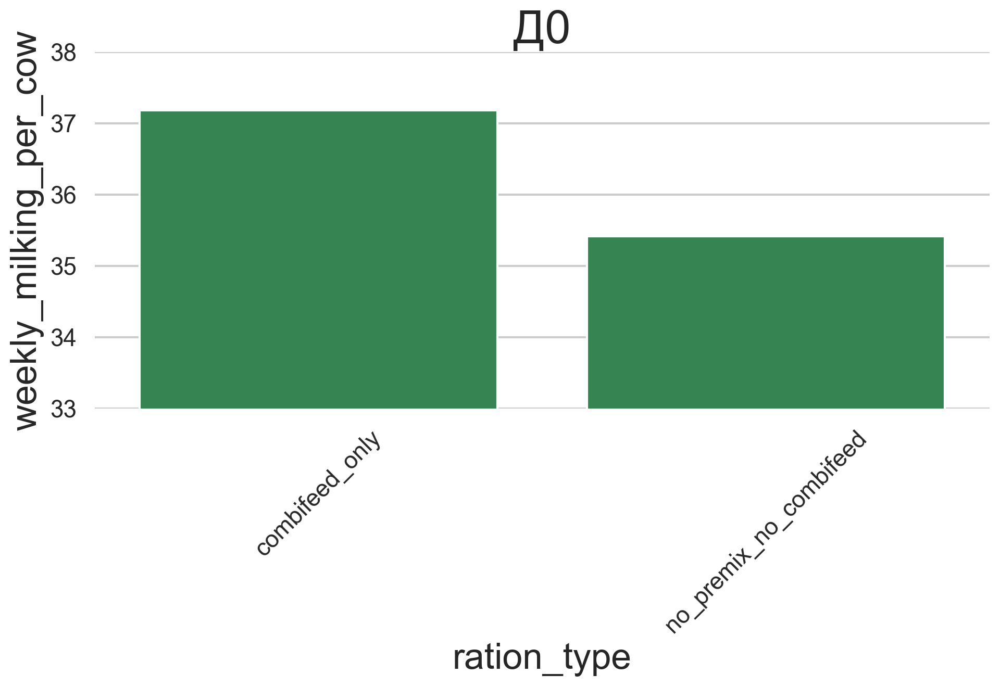

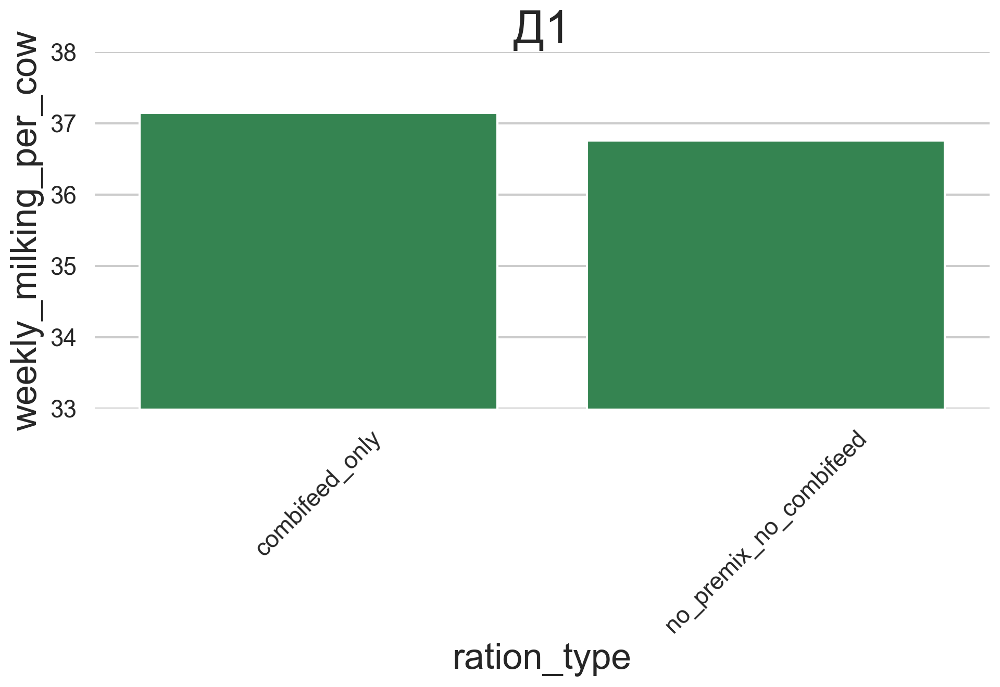

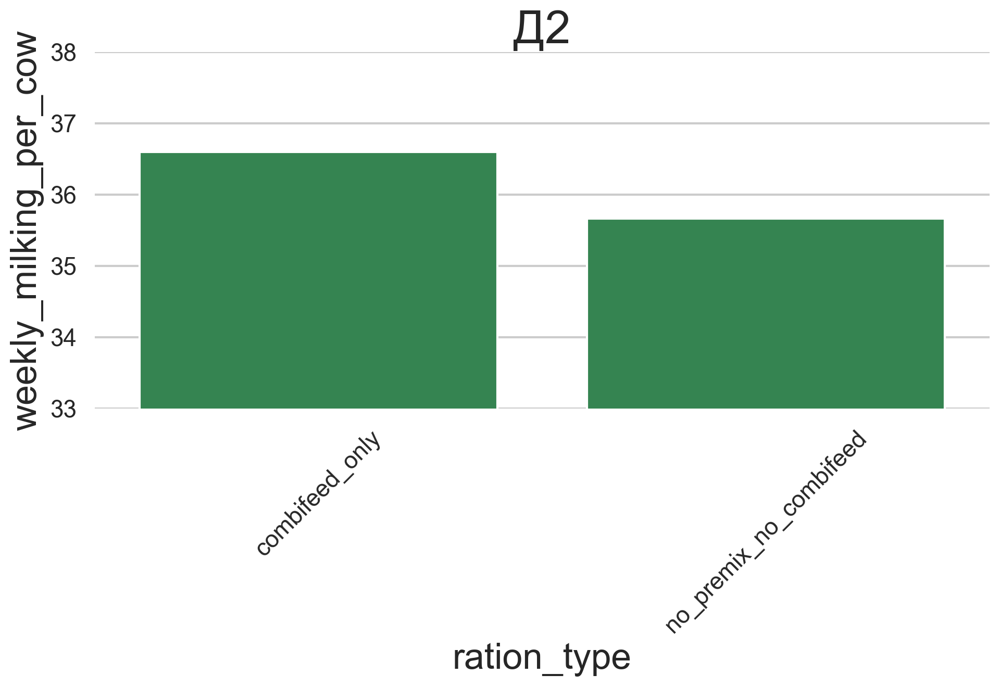

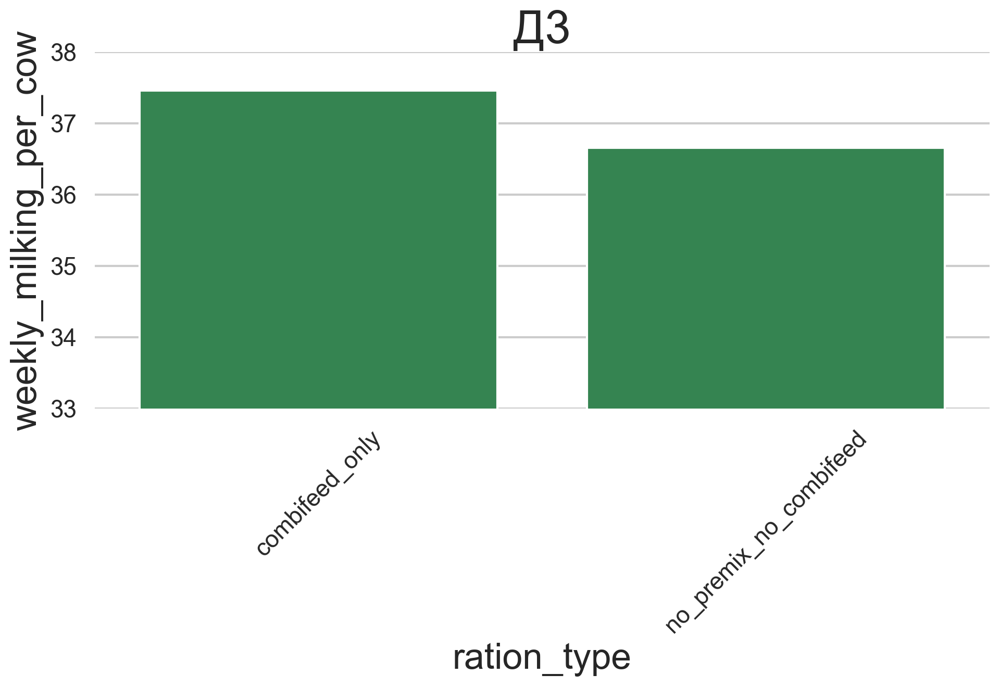

In [30]:
from scipy.stats import f_oneway
for doy in doynye:
    dd = fad_prod[(fad_prod['PhysiologicalGroupName']==doy) & (fad_prod['weekly_milking_per_cow'].notna())]
    plt.subplots()
    sns.barplot(data=dd.groupby('ration_type')['weekly_milking_per_cow'].mean().reset_index(), x='ration_type', y='weekly_milking_per_cow')
    plt.ylim(33, 38)
    plt.title(doy.upper())
    plt.xticks(rotation=45);
    df = dd.copy()
    df['weekly_milking_per_cow'] = pd.to_numeric(df['weekly_milking_per_cow'], errors='coerce')
    df = df.dropna(subset=['weekly_milking_per_cow', 'ration_type'])

    groups = [
        g['weekly_milking_per_cow'].values
        for _, g in df.groupby('ration_type')
    ]

    f_stat, p_val = f_oneway(*groups)
    print(doy.upper())
    print("ANOVA F =", f_stat)
    print("ANOVA p =", p_val)
    print(f'{"-"*25}')

In [31]:
dd = fad_prod[(fad_prod['PhysiologicalGroupName'].isin(doynye)) & (fad_prod['weekly_milking_per_cow'].notna())]
dd

,date,region,prod_farm_name,farm_type,farm_name,cows_total,milk_cows,milk_cows_d0,milk_cows_d1,milk_cows_d2,milk_cows_d3,weekly_milking_per_cow,gross_milk_yield,cow_retired,cow_retired_low_prod,cow_retired_hooves,cow_retired_inj_joint,cow_retired_mastit,cow_retired_jkt,bull_num,year_month,FeedingTaskID,Date,FeedNumber,SectionID,PhysiologicalGroupID,PhysiologicalGroupName,PhysiologicalGroupHeadCount,Appetite,RationName,RationPart,TotalWeight_kg,CompletedAt,year,IngredientID,PhysicalWeight_kg,ingredient_name,ingredient_group,ration_type
1950326,2022-12-01,Воронеж,ЭНА Восток,ЖК,ЖК Бобров,2878.0,2609.0,69.0,2094.0,340.0,106.0,34.1,86551.0,0.0,NaN,NaN,NaN,NaN,NaN,23.0,2022-12,Farms/EkoNiva1C.6dd689ea-831c-11e7-80bc-1c98ec...,2022-12-01,1,461,33,Д0,7,0.9,Д0,1.0,236.0,2022-12-01T03:46:00.0000000,2022,110.0,12.180,солома (общ.),Объёмные корма,combifeed_only
1950327,2022-12-01,Воронеж,ЭНА Восток,ЖК,ЖК Бобров,2878.0,2609.0,69.0,2094.0,340.0,106.0,34.1,86551.0,0.0,NaN,NaN,NaN,NaN,NaN,23.0,2022-12,Farms/EkoNiva1C.6dd689ea-831c-11e7-80bc-1c98ec...,2022-12-01,1,461,33,Д0,7,0.9,Д0,1.0,236.0,2022-12-01T03:46:00.0000000,2022,147.0,51.354,люцерна сенаж,Объёмные корма,combifeed_only
1950328,2022-12-01,Воронеж,ЭНА Восток,ЖК,ЖК Бобров,2878.0,2609.0,69.0,2094.0,340.0,106.0,34.1,86551.0,0.0,NaN,NaN,NaN,NaN,NaN,23.0,2022-12,Farms/EkoNiva1C.6dd689ea-831c-11e7-80bc-1c98ec...,2022-12-01,1,461,33,Д0,7,0.9,Д0,1.0,236.0,2022-12-01T03:46:00.0000000,2022,56.0,4.609,шрот рапсовый,Белковые корма,combifeed_only
1950329,2022-12-01,Воронеж,ЭНА Восток,ЖК,ЖК Бобров,2878.0,2609.0,69.0,2094.0,340.0,106.0,34.1,86551.0,0.0,NaN,NaN,NaN,NaN,NaN,23.0,2022-12,Farms/EkoNiva1C.6dd689ea-831c-11e7-80bc-1c98ec...,2022-12-01,1,461,33,Д0,7,0.9,Д0,1.0,236.0,2022-12-01T03:46:00.0000000,2022,111.0,13.826,шрот соевый,Белковые корма,combifeed_only
1950330,2022-12-01,Воронеж,ЭНА Восток,ЖК,ЖК Бобров,2878.0,2609.0,69.0,2094.0,340.0,106.0,34.1,86551.0,0.0,NaN,NaN,NaN,NaN,NaN,23.0,2022-12,Farms/EkoNiva1C.6dd689ea-831c-11e7-80bc-1c98ec...,2022-12-01,1,461,33,Д0,7,0.9,Д0,1.0,236.0,2022-12-01T03:46:00.0000000,2022,138.0,5.267,ячмень,Энергетические и крахмалистые корма,combifeed_only
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
15170655,2025-07-01,Воронеж,ЭНА Левый берег,ЖК,ЖК Добрино,2988.0,2698.0,174.0,2369.0,0.0,155.0,42.4,112683.0,56.0,1.0,3.0,2.0,3.0,20.0,15.0,2025-07,Farms/EkoNiva1C.216d4235-2852-11e8-80c4-1c98ec...,2025-07-31,33,74,2,Д1,352,1.0,Д1,1.0,17790.0,2025-08-01T06:21:04.2696412,2025,937.0,1128.000,комбикорм №10 эна лб,Комбикорма и стартеры,combifeed_only
15170656,2025-07-01,Воронеж,ЭНА Левый берег,ЖК,ЖК Добрино,2988.0,2698.0,174.0,2369.0,0.0,155.0,42.4,112683.0,56.0,1.0,3.0,2.0,3.0,20.0,15.0,2025-07,Farms/EkoNiva1C.216d4235-2852-11e8-80c4-1c98ec...,2025-07-31,33,74,2,Д1,352,1.0,Д1,1.0,17790.0,2025-08-01T06:21:04.2696412,2025,836.0,504.000,жом свекловичный сухой,Жом и дробина,combifeed_only
15170657,2025-07-01,Воронеж,ЭНА Левый берег,ЖК,ЖК Добрино,2988.0,2698.0,174.0,2369.0,0.0,155.0,42.4,112683.0,56.0,1.0,3.0,2.0,3.0,20.0,15.0,2025-07,Farms/EkoNiva1C.216d4235-2852-11e8-80c4-1c98ec...,2025-07-31,33,74,2,Д1,352,1.0,Д1,1.0,17790.0,2025-08-01T06:21:04.2696412,2025,1126.0,5068.000,кукуруза силос,Объёмные корма,combifeed_only
15170658,2025-07-01,Воронеж,ЭНА Левый берег,ЖК,ЖК Добрино,2988.0,2698.0,174.0,2369.0,0.0,155.0,42.4,112683.0,56.0,1.0,3.0,2.0,3.0,20.0,15.0,2025-07,Farms/EkoNiva1C.216d4235-2852-11e8-80c4-1c98ec...,2025-07-31,33,74,2,Д1,352,1.0,Д1,1.0,17790.0,2025-08-01T06:21:04.2696412,2025,864.0,625.000,патока свекловичная,Энергетические и крахмалистые корма,combifeed_only


<Axes: xlabel='PhysiologicalGroupName', ylabel='Count'>

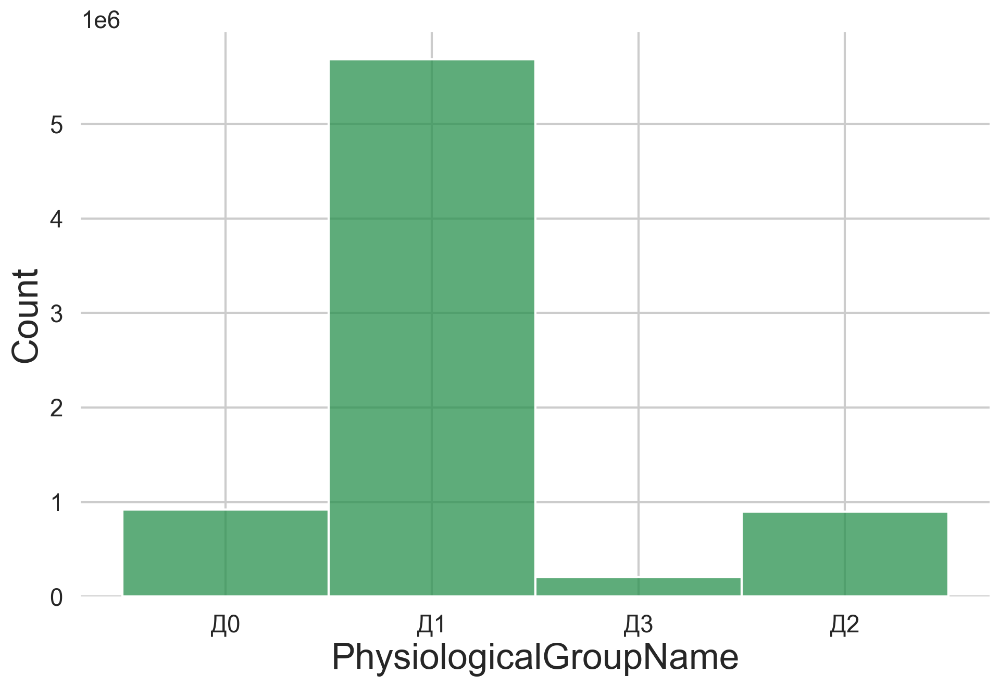

In [32]:
sns.histplot(data=dd[dd['PhysiologicalGroupName'].isin(doynye)], x='PhysiologicalGroupName')

In [33]:
dd = fad_prod[(fad_prod['PhysiologicalGroupName'].isin(doynye)) & (fad_prod['weekly_milking_per_cow'].notna())]
dd

,date,region,prod_farm_name,farm_type,farm_name,cows_total,milk_cows,milk_cows_d0,milk_cows_d1,milk_cows_d2,milk_cows_d3,weekly_milking_per_cow,gross_milk_yield,cow_retired,cow_retired_low_prod,cow_retired_hooves,cow_retired_inj_joint,cow_retired_mastit,cow_retired_jkt,bull_num,year_month,FeedingTaskID,Date,FeedNumber,SectionID,PhysiologicalGroupID,PhysiologicalGroupName,PhysiologicalGroupHeadCount,Appetite,RationName,RationPart,TotalWeight_kg,CompletedAt,year,IngredientID,PhysicalWeight_kg,ingredient_name,ingredient_group,ration_type
1950326,2022-12-01,Воронеж,ЭНА Восток,ЖК,ЖК Бобров,2878.0,2609.0,69.0,2094.0,340.0,106.0,34.1,86551.0,0.0,NaN,NaN,NaN,NaN,NaN,23.0,2022-12,Farms/EkoNiva1C.6dd689ea-831c-11e7-80bc-1c98ec...,2022-12-01,1,461,33,Д0,7,0.9,Д0,1.0,236.0,2022-12-01T03:46:00.0000000,2022,110.0,12.180,солома (общ.),Объёмные корма,combifeed_only
1950327,2022-12-01,Воронеж,ЭНА Восток,ЖК,ЖК Бобров,2878.0,2609.0,69.0,2094.0,340.0,106.0,34.1,86551.0,0.0,NaN,NaN,NaN,NaN,NaN,23.0,2022-12,Farms/EkoNiva1C.6dd689ea-831c-11e7-80bc-1c98ec...,2022-12-01,1,461,33,Д0,7,0.9,Д0,1.0,236.0,2022-12-01T03:46:00.0000000,2022,147.0,51.354,люцерна сенаж,Объёмные корма,combifeed_only
1950328,2022-12-01,Воронеж,ЭНА Восток,ЖК,ЖК Бобров,2878.0,2609.0,69.0,2094.0,340.0,106.0,34.1,86551.0,0.0,NaN,NaN,NaN,NaN,NaN,23.0,2022-12,Farms/EkoNiva1C.6dd689ea-831c-11e7-80bc-1c98ec...,2022-12-01,1,461,33,Д0,7,0.9,Д0,1.0,236.0,2022-12-01T03:46:00.0000000,2022,56.0,4.609,шрот рапсовый,Белковые корма,combifeed_only
1950329,2022-12-01,Воронеж,ЭНА Восток,ЖК,ЖК Бобров,2878.0,2609.0,69.0,2094.0,340.0,106.0,34.1,86551.0,0.0,NaN,NaN,NaN,NaN,NaN,23.0,2022-12,Farms/EkoNiva1C.6dd689ea-831c-11e7-80bc-1c98ec...,2022-12-01,1,461,33,Д0,7,0.9,Д0,1.0,236.0,2022-12-01T03:46:00.0000000,2022,111.0,13.826,шрот соевый,Белковые корма,combifeed_only
1950330,2022-12-01,Воронеж,ЭНА Восток,ЖК,ЖК Бобров,2878.0,2609.0,69.0,2094.0,340.0,106.0,34.1,86551.0,0.0,NaN,NaN,NaN,NaN,NaN,23.0,2022-12,Farms/EkoNiva1C.6dd689ea-831c-11e7-80bc-1c98ec...,2022-12-01,1,461,33,Д0,7,0.9,Д0,1.0,236.0,2022-12-01T03:46:00.0000000,2022,138.0,5.267,ячмень,Энергетические и крахмалистые корма,combifeed_only
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
15170655,2025-07-01,Воронеж,ЭНА Левый берег,ЖК,ЖК Добрино,2988.0,2698.0,174.0,2369.0,0.0,155.0,42.4,112683.0,56.0,1.0,3.0,2.0,3.0,20.0,15.0,2025-07,Farms/EkoNiva1C.216d4235-2852-11e8-80c4-1c98ec...,2025-07-31,33,74,2,Д1,352,1.0,Д1,1.0,17790.0,2025-08-01T06:21:04.2696412,2025,937.0,1128.000,комбикорм №10 эна лб,Комбикорма и стартеры,combifeed_only
15170656,2025-07-01,Воронеж,ЭНА Левый берег,ЖК,ЖК Добрино,2988.0,2698.0,174.0,2369.0,0.0,155.0,42.4,112683.0,56.0,1.0,3.0,2.0,3.0,20.0,15.0,2025-07,Farms/EkoNiva1C.216d4235-2852-11e8-80c4-1c98ec...,2025-07-31,33,74,2,Д1,352,1.0,Д1,1.0,17790.0,2025-08-01T06:21:04.2696412,2025,836.0,504.000,жом свекловичный сухой,Жом и дробина,combifeed_only
15170657,2025-07-01,Воронеж,ЭНА Левый берег,ЖК,ЖК Добрино,2988.0,2698.0,174.0,2369.0,0.0,155.0,42.4,112683.0,56.0,1.0,3.0,2.0,3.0,20.0,15.0,2025-07,Farms/EkoNiva1C.216d4235-2852-11e8-80c4-1c98ec...,2025-07-31,33,74,2,Д1,352,1.0,Д1,1.0,17790.0,2025-08-01T06:21:04.2696412,2025,1126.0,5068.000,кукуруза силос,Объёмные корма,combifeed_only
15170658,2025-07-01,Воронеж,ЭНА Левый берег,ЖК,ЖК Добрино,2988.0,2698.0,174.0,2369.0,0.0,155.0,42.4,112683.0,56.0,1.0,3.0,2.0,3.0,20.0,15.0,2025-07,Farms/EkoNiva1C.216d4235-2852-11e8-80c4-1c98ec...,2025-07-31,33,74,2,Д1,352,1.0,Д1,1.0,17790.0,2025-08-01T06:21:04.2696412,2025,864.0,625.000,патока свекловичная,Энергетические и крахмалистые корма,combifeed_only


In [34]:
herd_metrics

,date,region,prod_farm_name,farm_type,farm_name,ls_capacity,ls_occupancy,forage_cow,milk_cow,dry_cow,milk_marketab_prc,forcow_milk_yeild,forcow_milk_yeild_stand,milk_fat,milk_protein,somatic_cells,bac_contam,cow_retired,cow_lame,cow_mastits,calves,cow_metrit,ph_urine_avr,year_month
0,2020-01-01,Воронеж,ЭНА Восток,ЖК,ЖК Бобров,2800.0,95.535714,2675.0,2329.0,346.0,94.0,NaN,NaN,NaN,NaN,92.0,41.00,52.0,90.0,57,NaN,NaN,NaN,2020-01
1,2020-01-01,Воронеж,ЭНА Восток,ЖК,ЖК Бобров-2,2800.0,101.678571,2847.0,2378.0,469.0,96.0,NaN,NaN,NaN,NaN,90.0,29.00,30.0,44.0,27,NaN,NaN,NaN,2020-01
2,2020-01-01,Воронеж,ЭНА Восток,ЖК,ЖК Верхний Икорец,2800.0,101.071429,2830.0,2363.0,467.0,96.0,NaN,NaN,NaN,NaN,161.0,72.00,52.0,57.0,77,NaN,NaN,NaN,2020-01
3,2020-01-01,Воронеж,ЭНА Восток,ЖК,ЖК Петропавловка,2800.0,59.321429,1661.0,1632.0,29.0,99.0,NaN,NaN,NaN,NaN,69.0,8.00,35.0,120.0,26,NaN,NaN,NaN,2020-01
4,2020-01-01,Воронеж,ЭНА Восток,МТФ,МТФ Владимировка,467.0,37.473233,175.0,175.0,0.0,96.0,NaN,NaN,NaN,NaN,259.0,58.00,17.0,2.0,10,NaN,NaN,NaN,2020-01
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
4296,2025-07-01,Сибирь,Сибирская Нива Маслянино,ЖК,ЖК Елбань,6200.0,95.000000,5882.0,5468.0,414.0,98.0,32.20,33.9,3.9,3.4,102.5,39.36,526.0,186.0,90,812.0,132.0,5.8,2025-07
4297,2025-07-01,Сибирь,Сибирская Нива Маслянино,ЖК,ЖК Пеньково,4700.0,99.000000,4666.0,4172.0,494.0,95.0,30.11,31.8,3.9,3.4,114.0,46.00,189.0,305.0,75,843.0,123.0,6.3,2025-07
4298,2025-07-01,Сибирь,Сибирская Нива Маслянино,РМ,РМ Пеньково,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,2025-07
4299,2025-07-01,Сибирь,Сибирская Нива Черепаново,ЖК,ЖК Огнева Заимка,3550.0,100.000000,3544.0,3141.0,403.0,94.0,34.95,36.0,3.8,3.3,91.0,38.00,115.0,124.0,47,514.0,131.0,6.5,2025-07


Д0
ANOVA F = 35258.7970971919
ANOVA p = 0.0
-------------------------


MemoryError: Unable to allocate 867. MiB for an array with shape (20, 5684629) and data type float64

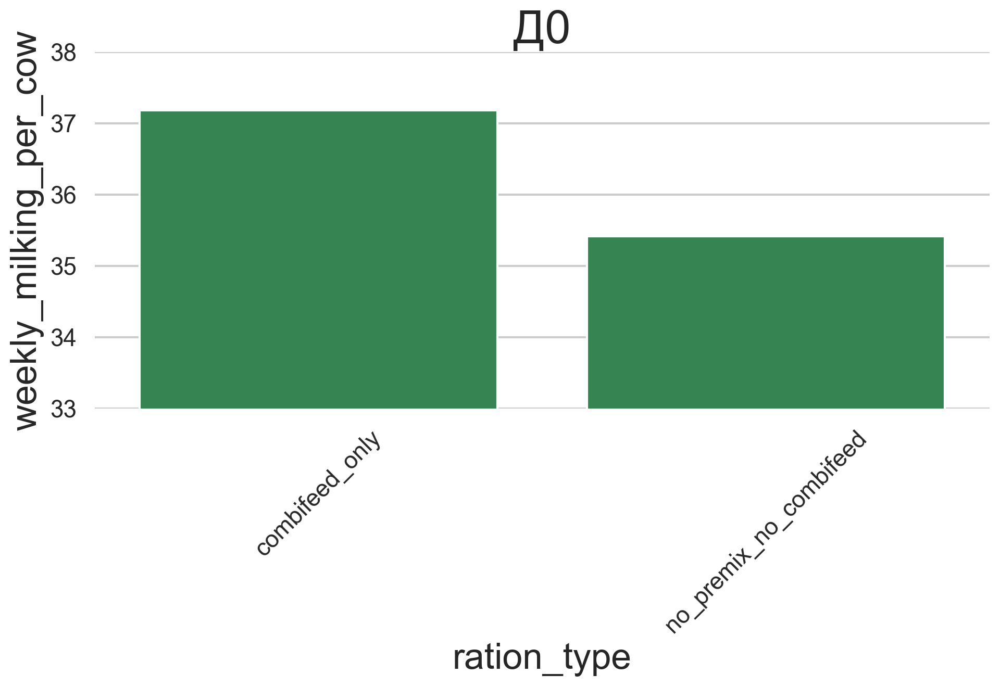

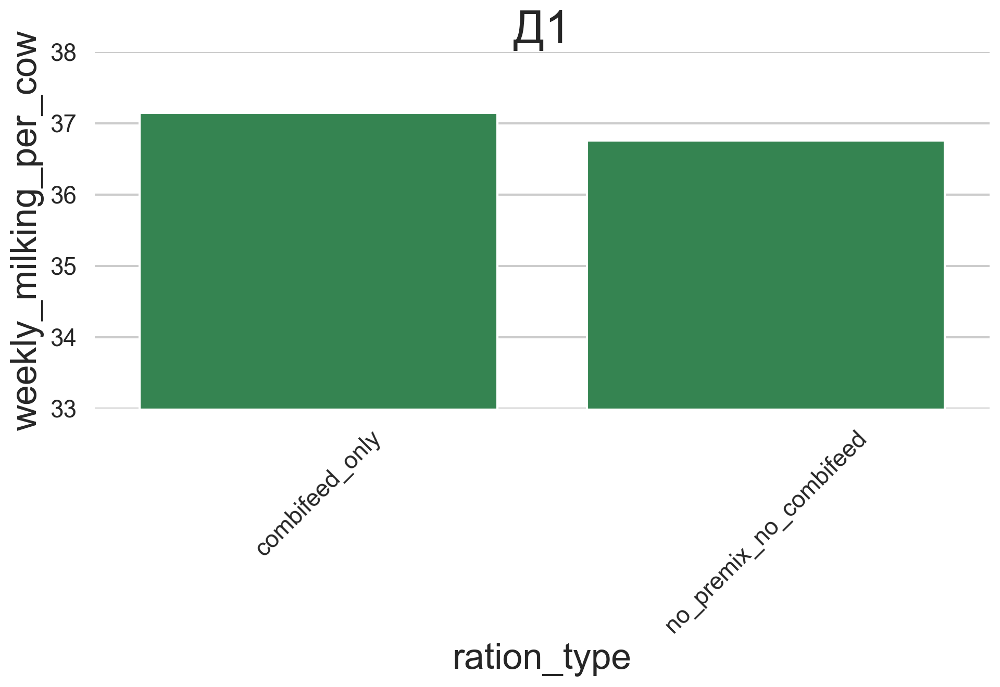

In [35]:
from scipy.stats import f_oneway
for doy in doynye:
    de = fad_prod[(fad_prod['PhysiologicalGroupName']==doy) & (fad_prod['weekly_milking_per_cow'].notna())]
    plt.subplots()
    sns.barplot(data=de.groupby('ration_type')['weekly_milking_per_cow'].mean().reset_index(), x='ration_type', y='weekly_milking_per_cow')
    plt.ylim(33, 38)
    plt.title(doy.upper())
    plt.xticks(rotation=45);
    df = de.copy()
    df['weekly_milking_per_cow'] = pd.to_numeric(df['weekly_milking_per_cow'], errors='coerce')
    df = df.dropna(subset=['weekly_milking_per_cow', 'ration_type'])

    groups = [
        g['weekly_milking_per_cow'].values
        for _, g in df.groupby('ration_type')
    ]

    f_stat, p_val = f_oneway(*groups)
    print(doy.upper())
    print("ANOVA F =", f_stat)
    print("ANOVA p =", p_val)
    print(f'{"-"*25}')

In [36]:
dd[dd['ration_type'] == 'combifeed_only']['weekly_milking_per_cow'].mean()

np.float64(37.115558702256266)

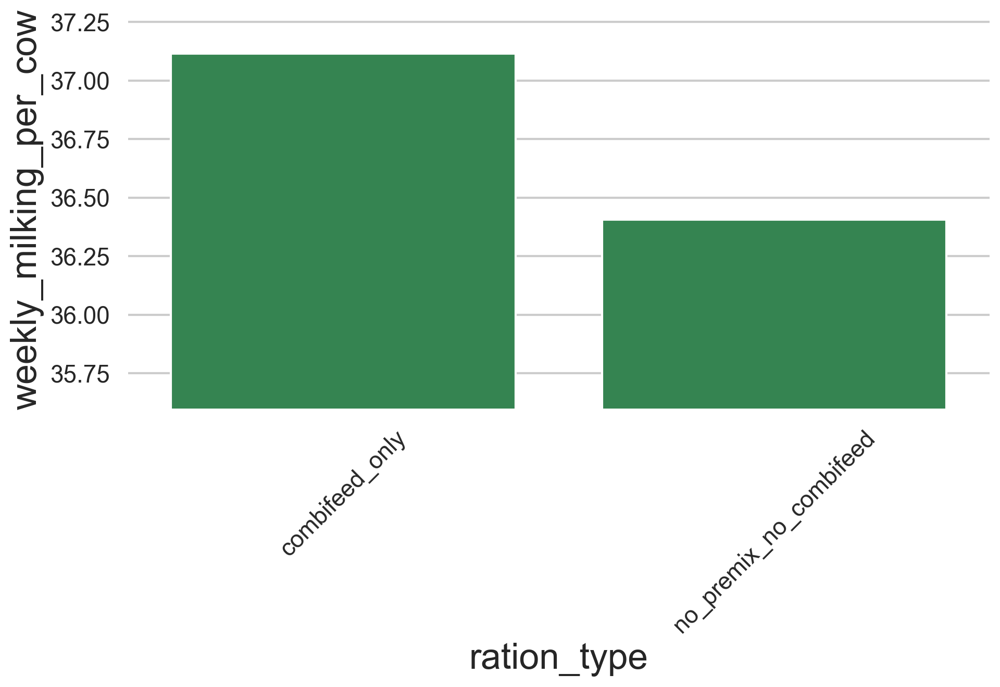

In [37]:
sns.barplot(data=dd.groupby('ration_type')['weekly_milking_per_cow'].mean().reset_index(), x='ration_type', y='weekly_milking_per_cow')
plt.ylim(35.6, 37.3)
plt.xticks(rotation=45);

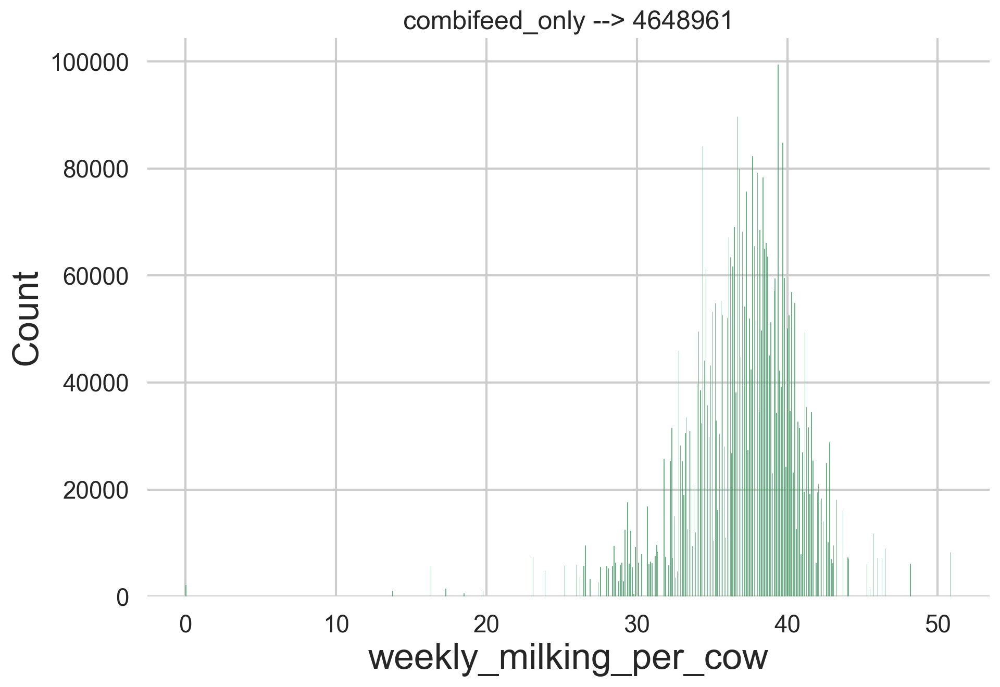

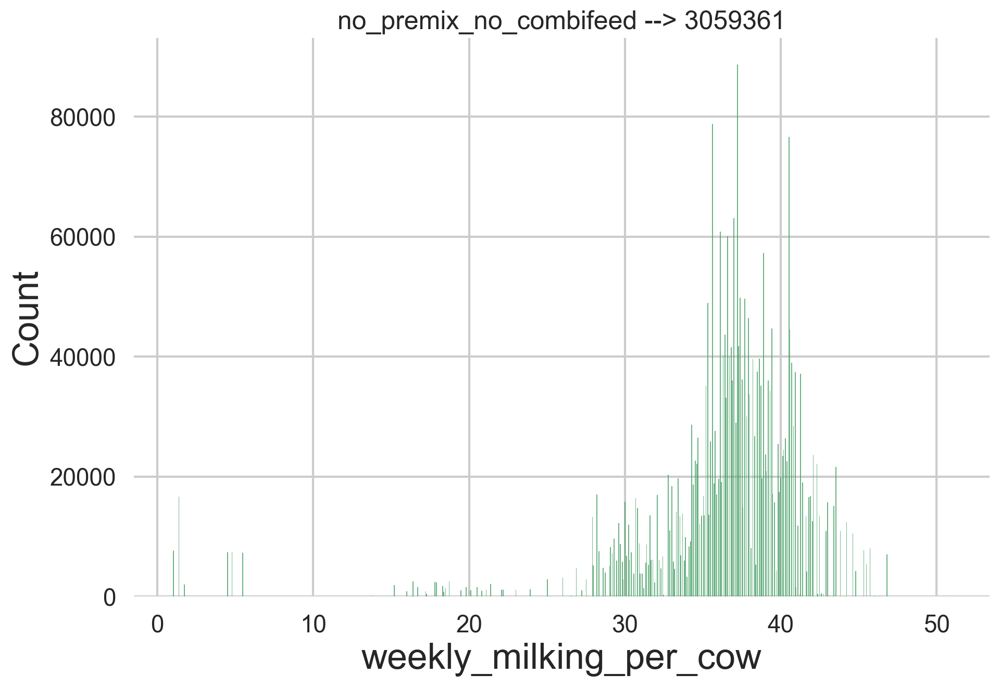

In [38]:
for rt in dd['ration_type'].unique():
    plt.subplots()
    dd2 = dd[dd['ration_type'] == rt]
    sns.histplot(data=dd2, x='weekly_milking_per_cow')
    plt.title(f'{rt} --> {dd2.shape[0]}', fontsize=18)

In [50]:
df = dd.copy()
df['weekly_milking_per_cow'] = pd.to_numeric(df['weekly_milking_per_cow'], errors='coerce')
df = df.dropna(subset=['weekly_milking_per_cow', 'ration_type'])

MemoryError: Unable to allocate 1.15 GiB for an array with shape (20, 7708322) and data type float64

In [ ]:
from scipy.stats import f_oneway

groups = [
    g['weekly_milking_per_cow'].values
    for _, g in df.groupby('ration_type')
]

f_stat, p_val = f_oneway(*groups)

print("ANOVA F =", f_stat)
print("ANOVA p =", p_val)

ANOVA F = 25166.40049511183
ANOVA p = 0.0


In [ ]:
from scipy.stats import kruskal

kw_stat, kw_p = kruskal(*groups)

print("Kruskal–Wallis H =", kw_stat)
print("Kruskal p =", kw_p)

Kruskal–Wallis H = 5397.776138138839
Kruskal p = 0.0


In [ ]:
fad 

,FeedingTaskID,Date,farm_name,FeedNumber,SectionID,PhysiologicalGroupID,PhysiologicalGroupName,PhysiologicalGroupHeadCount,Appetite,RationName,RationPart,TotalWeight_kg,CompletedAt,year,PhysicalWeight_kg,ingredient_name,ingredient_group,year_month,ration_type
0,Farms/EkoNiva1C.216d4235-2852-11e8-80c4-1c98ec...,2022-01-01,ЖК Добрино,15,9,2,Д1,352,0.9,Д1,0.5,8324.0,2022-01-03T05:45:50.5175580,2022,150.259,солома покупная,Объёмные корма,2022-01,combifeed_only
1,Farms/EkoNiva1C.216d4235-2852-11e8-80c4-1c98ec...,2022-01-01,ЖК Добрино,15,9,2,Д1,352,0.9,Д1,0.5,8324.0,2022-01-03T05:45:50.5175580,2022,880.444,люцерна сенаж,Объёмные корма,2022-01,combifeed_only
2,Farms/EkoNiva1C.216d4235-2852-11e8-80c4-1c98ec...,2022-01-01,ЖК Добрино,15,9,2,Д1,352,0.9,Д1,0.5,8324.0,2022-01-03T05:45:50.5175580,2022,542.257,комбикорм 10 группы,Комбикорма и стартеры,2022-01,combifeed_only
3,Farms/EkoNiva1C.216d4235-2852-11e8-80c4-1c98ec...,2022-01-01,ЖК Добрино,15,9,2,Д1,352,0.9,Д1,0.5,8324.0,2022-01-03T05:45:50.5175580,2022,991.793,кукуруза сухая,Энергетические и крахмалистые корма,2022-01,combifeed_only
4,Farms/EkoNiva1C.216d4235-2852-11e8-80c4-1c98ec...,2022-01-01,ЖК Добрино,15,9,2,Д1,352,0.9,Д1,0.5,8324.0,2022-01-03T05:45:50.5175580,2022,156.054,шрот подсолнечный,Белковые корма,2022-01,combifeed_only
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
16411327,Farms/EkoNiva1C.6c69fe1b-2b6f-11e8-80c4-1c98ec...,2025-10-22,ЖК Подболотье,20,131,1,Нетели,32,1.2,С1,1.0,1106.0,2025-10-22T08:50:05.2368034,2025,120.643,солома (общ.),Объёмные корма,2025-10,premix_only
16411328,Farms/EkoNiva1C.6c69fe1b-2b6f-11e8-80c4-1c98ec...,2025-10-22,ЖК Подболотье,20,131,1,Нетели,32,1.2,С1,1.0,1106.0,2025-10-22T08:50:05.2368034,2025,549.169,люцерна сенаж,Объёмные корма,2025-10,premix_only
16411329,Farms/EkoNiva1C.6c69fe1b-2b6f-11e8-80c4-1c98ec...,2025-10-22,ЖК Подболотье,20,131,1,Нетели,32,1.2,С1,1.0,1106.0,2025-10-22T08:50:05.2368034,2025,36.676,жом свекловичный сухой,Жом и дробина,2025-10,premix_only
16411330,Farms/EkoNiva1C.6c69fe1b-2b6f-11e8-80c4-1c98ec...,2025-10-22,ЖК Подболотье,20,131,1,Нетели,32,1.2,С1,1.0,1106.0,2025-10-22T08:50:05.2368034,2025,10.049,премикс молодняк 6-24,"Премиксы, БАДы, дрожжи",2025-10,premix_only


In [ ]:
herd_metrics

,date,region,prod_farm_name,farm_type,farm_name,ls_capacity,ls_occupancy,forage_cow,milk_cow,dry_cow,milk_marketab_prc,forcow_milk_yeild,forcow_milk_yeild_stand,milk_fat,milk_protein,somatic_cells,bac_contam,cow_retired,cow_lame,cow_mastits,calves,cow_metrit,ph_urine_avr,year_month
0,2020-01-01,Воронеж,ЭНА Восток,ЖК,ЖК Бобров,2800.0,95.535714,2675.0,2329.0,346.0,94.0,NaN,NaN,NaN,NaN,92.0,41.00,52.0,90.0,57,NaN,NaN,NaN,2020-01
1,2020-01-01,Воронеж,ЭНА Восток,ЖК,ЖК Бобров-2,2800.0,101.678571,2847.0,2378.0,469.0,96.0,NaN,NaN,NaN,NaN,90.0,29.00,30.0,44.0,27,NaN,NaN,NaN,2020-01
2,2020-01-01,Воронеж,ЭНА Восток,ЖК,ЖК Верхний Икорец,2800.0,101.071429,2830.0,2363.0,467.0,96.0,NaN,NaN,NaN,NaN,161.0,72.00,52.0,57.0,77,NaN,NaN,NaN,2020-01
3,2020-01-01,Воронеж,ЭНА Восток,ЖК,ЖК Петропавловка,2800.0,59.321429,1661.0,1632.0,29.0,99.0,NaN,NaN,NaN,NaN,69.0,8.00,35.0,120.0,26,NaN,NaN,NaN,2020-01
4,2020-01-01,Воронеж,ЭНА Восток,МТФ,МТФ Владимировка,467.0,37.473233,175.0,175.0,0.0,96.0,NaN,NaN,NaN,NaN,259.0,58.00,17.0,2.0,10,NaN,NaN,NaN,2020-01
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
4296,2025-07-01,Сибирь,Сибирская Нива Маслянино,ЖК,ЖК Елбань,6200.0,95.000000,5882.0,5468.0,414.0,98.0,32.20,33.9,3.9,3.4,102.5,39.36,526.0,186.0,90,812.0,132.0,5.8,2025-07
4297,2025-07-01,Сибирь,Сибирская Нива Маслянино,ЖК,ЖК Пеньково,4700.0,99.000000,4666.0,4172.0,494.0,95.0,30.11,31.8,3.9,3.4,114.0,46.00,189.0,305.0,75,843.0,123.0,6.3,2025-07
4298,2025-07-01,Сибирь,Сибирская Нива Маслянино,РМ,РМ Пеньково,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,2025-07
4299,2025-07-01,Сибирь,Сибирская Нива Черепаново,ЖК,ЖК Огнева Заимка,3550.0,100.000000,3544.0,3141.0,403.0,94.0,34.95,36.0,3.8,3.3,91.0,38.00,115.0,124.0,47,514.0,131.0,6.5,2025-07


In [ ]:
fad.groupby('farm_name')['ration_type'].value_counts().reset_index()

,farm_name,ration_type,count
0,ЖК Авангард,premix_only,292707
1,ЖК Авангард,premix_and_combifeed,24872
2,ЖК Авангард,no_premix_no_combifeed,12600
3,ЖК Авангард,combifeed_only,5221
4,ЖК Аристово,combifeed_only,75124
...,...,...,...
185,РМ Поляна,premix_only,10018
186,РМ Поляна,combifeed_only,3793
187,РМ Торопово,premix_only,21714
188,ЭФ Родня,no_premix_no_combifeed,88278


In [ ]:
fad[fad['ration_type'] == 'premix_and_combifeed']

,FeedingTaskID,Date,farm_name,FeedNumber,SectionID,PhysiologicalGroupID,PhysiologicalGroupName,PhysiologicalGroupHeadCount,Appetite,RationName,RationPart,TotalWeight_kg,CompletedAt,year,PhysicalWeight_kg,ingredient_name,ingredient_group,year_month,ration_type
40,Farms/EkoNiva1C.216d4235-2852-11e8-80c4-1c98ec...,2022-01-01,ЖК Добрино,37,99,58,Т3 (9-12 мес.),304,1.0,Т3 9-12,1.0,4360.0,2022-01-01T10:45:00.0000000,2022,279.587,сено луговое,Объёмные корма,2022-01,premix_and_combifeed
41,Farms/EkoNiva1C.216d4235-2852-11e8-80c4-1c98ec...,2022-01-01,ЖК Добрино,37,99,58,Т3 (9-12 мес.),304,1.0,Т3 9-12,1.0,4360.0,2022-01-01T10:45:00.0000000,2022,2158.044,люцерна сенаж,Объёмные корма,2022-01,premix_and_combifeed
42,Farms/EkoNiva1C.216d4235-2852-11e8-80c4-1c98ec...,2022-01-01,ЖК Добрино,37,99,58,Т3 (9-12 мес.),304,1.0,Т3 9-12,1.0,4360.0,2022-01-01T10:45:00.0000000,2022,216.796,дрожжи кормовые,Энергетические и крахмалистые корма,2022-01,premix_and_combifeed
43,Farms/EkoNiva1C.216d4235-2852-11e8-80c4-1c98ec...,2022-01-01,ЖК Добрино,37,99,58,Т3 (9-12 мес.),304,1.0,Т3 9-12,1.0,4360.0,2022-01-01T10:45:00.0000000,2022,626.593,комбикорм 4.2 группы,Комбикорма и стартеры,2022-01,premix_and_combifeed
44,Farms/EkoNiva1C.216d4235-2852-11e8-80c4-1c98ec...,2022-01-01,ЖК Добрино,37,99,58,Т3 (9-12 мес.),304,1.0,Т3 9-12,1.0,4360.0,2022-01-01T10:45:00.0000000,2022,30.778,премикс молодняк рум,"Премиксы, БАДы, дрожжи",2022-01,premix_and_combifeed
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
16410899,Farms/EkoNiva1C.d8ad040c-c9bf-11e7-80bd-1c98ec...,2025-10-22,РМ Пеньково,57,243,51,Т0 (0-2 мес.),372,1.0,Т0 Вне миксера,1.0,2424.0,2025-10-22T08:39:22.3113053,2025,2386.348,молоко,Жидкости,2025-10,premix_and_combifeed
16410900,Farms/EkoNiva1C.d8ad040c-c9bf-11e7-80bd-1c98ec...,2025-10-22,РМ Пеньково,58,269,51,Т0 (0-2 мес.),584,1.0,Т0 Вне миксера,1.0,3806.0,2025-10-22T08:39:22.3113053,2025,24.266,кальвобустер,"Премиксы, БАДы, дрожжи",2025-10,premix_and_combifeed
16410901,Farms/EkoNiva1C.d8ad040c-c9bf-11e7-80bd-1c98ec...,2025-10-22,РМ Пеньково,58,269,51,Т0 (0-2 мес.),584,1.0,Т0 Вне миксера,1.0,3806.0,2025-10-22T08:39:22.3113053,2025,52.210,молоко сухое,Жидкости,2025-10,premix_and_combifeed
16410902,Farms/EkoNiva1C.d8ad040c-c9bf-11e7-80bd-1c98ec...,2025-10-22,РМ Пеньково,58,269,51,Т0 (0-2 мес.),584,1.0,Т0 Вне миксера,1.0,3806.0,2025-10-22T08:39:22.3113053,2025,262.452,комбикорм №3 сибнм,Комбикорма и стартеры,2025-10,premix_and_combifeed


In [ ]:
df = fad_prod[fad_prod['PhysiologicalGroupName'].isin(doynye)]
df

,date,region,prod_farm_name,farm_type,farm_name,cows_total,milk_cows,milk_cows_d0,milk_cows_d1,milk_cows_d2,milk_cows_d3,weekly_milking_per_cow,gross_milk_yield,cow_retired,cow_retired_low_prod,cow_retired_hooves,cow_retired_inj_joint,cow_retired_mastit,cow_retired_jkt,bull_num,year_month,FeedingTaskID,Date,FeedNumber,SectionID,PhysiologicalGroupID,PhysiologicalGroupName,PhysiologicalGroupHeadCount,Appetite,RationName,RationPart,TotalWeight_kg,CompletedAt,year,PhysicalWeight_kg,ingredient_name,ingredient_group,ration_type
0,NaT,NaN,NaN,NaN,ЖК Добрино,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,2022-01,Farms/EkoNiva1C.216d4235-2852-11e8-80c4-1c98ec...,2022-01-01,15,9,2,Д1,352,0.9,Д1,0.5,8324.0,2022-01-03T05:45:50.5175580,2022,150.259,солома покупная,Объёмные корма,combifeed_only
1,NaT,NaN,NaN,NaN,ЖК Добрино,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,2022-01,Farms/EkoNiva1C.216d4235-2852-11e8-80c4-1c98ec...,2022-01-01,15,9,2,Д1,352,0.9,Д1,0.5,8324.0,2022-01-03T05:45:50.5175580,2022,880.444,люцерна сенаж,Объёмные корма,combifeed_only
2,NaT,NaN,NaN,NaN,ЖК Добрино,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,2022-01,Farms/EkoNiva1C.216d4235-2852-11e8-80c4-1c98ec...,2022-01-01,15,9,2,Д1,352,0.9,Д1,0.5,8324.0,2022-01-03T05:45:50.5175580,2022,542.257,комбикорм 10 группы,Комбикорма и стартеры,combifeed_only
3,NaT,NaN,NaN,NaN,ЖК Добрино,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,2022-01,Farms/EkoNiva1C.216d4235-2852-11e8-80c4-1c98ec...,2022-01-01,15,9,2,Д1,352,0.9,Д1,0.5,8324.0,2022-01-03T05:45:50.5175580,2022,991.793,кукуруза сухая,Энергетические и крахмалистые корма,combifeed_only
4,NaT,NaN,NaN,NaN,ЖК Добрино,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,2022-01,Farms/EkoNiva1C.216d4235-2852-11e8-80c4-1c98ec...,2022-01-01,15,9,2,Д1,352,0.9,Д1,0.5,8324.0,2022-01-03T05:45:50.5175580,2022,156.054,шрот подсолнечный,Белковые корма,combifeed_only
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
16411307,NaT,NaN,NaN,NaN,ЖК Подболотье,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,2025-10,Farms/EkoNiva1C.6c69fe1b-2b6f-11e8-80c4-1c98ec...,2025-10-22,16,1,3,Д1,139,1.1,Д1,0.6,5476.0,2025-10-22T08:30:28.0916260,2025,2.481,пропионат хрома,Минералы/буферные,premix_only
16411308,NaT,NaN,NaN,NaN,ЖК Подболотье,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,2025-10,Farms/EkoNiva1C.6c69fe1b-2b6f-11e8-80c4-1c98ec...,2025-10-22,16,1,3,Д1,139,1.1,Д1,0.6,5476.0,2025-10-22T08:30:28.0916260,2025,14.889,премикс дойный б,"Премиксы, БАДы, дрожжи",premix_only
16411309,NaT,NaN,NaN,NaN,ЖК Подболотье,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,2025-10,Farms/EkoNiva1C.6c69fe1b-2b6f-11e8-80c4-1c98ec...,2025-10-22,16,1,3,Д1,139,1.1,Д1,0.6,5476.0,2025-10-22T08:30:28.0916260,2025,1940.178,кукуруза силос,Объёмные корма,premix_only
16411310,NaT,NaN,NaN,NaN,ЖК Подболотье,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,2025-10,Farms/EkoNiva1C.6c69fe1b-2b6f-11e8-80c4-1c98ec...,2025-10-22,16,1,3,Д1,139,1.1,Д1,0.6,5476.0,2025-10-22T08:30:28.0916260,2025,177.275,патока свекловичная,Энергетические и крахмалистые корма,premix_only


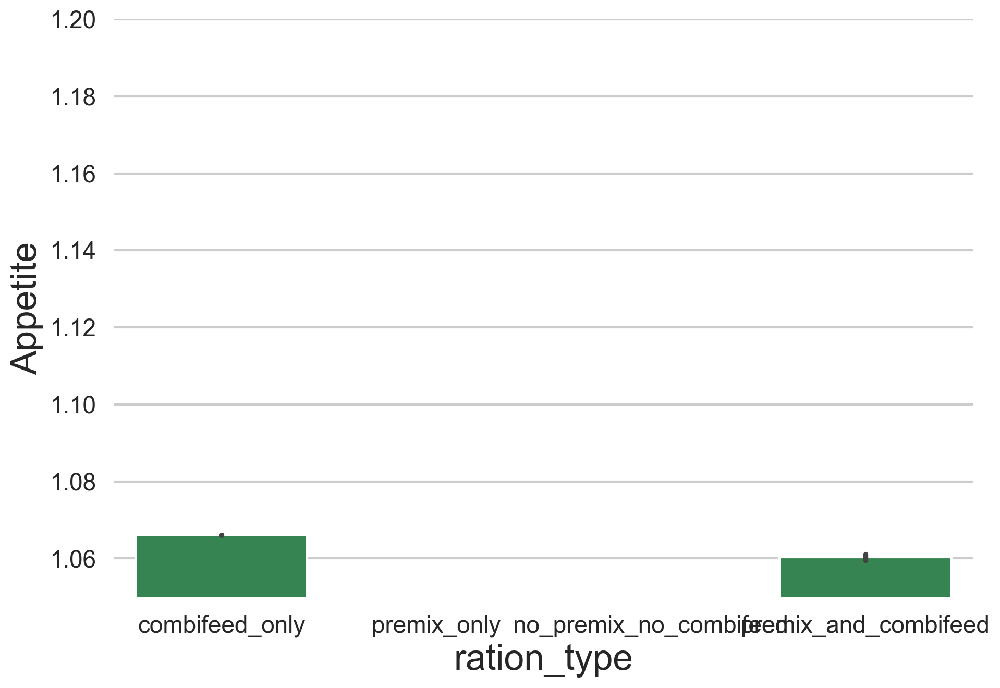

In [ ]:
sns.barplot(data=df, x='ration_type', y='Appetite')
plt.ylim(1.05, 1.2);

<Axes: xlabel='Appetite', ylabel='Count'>

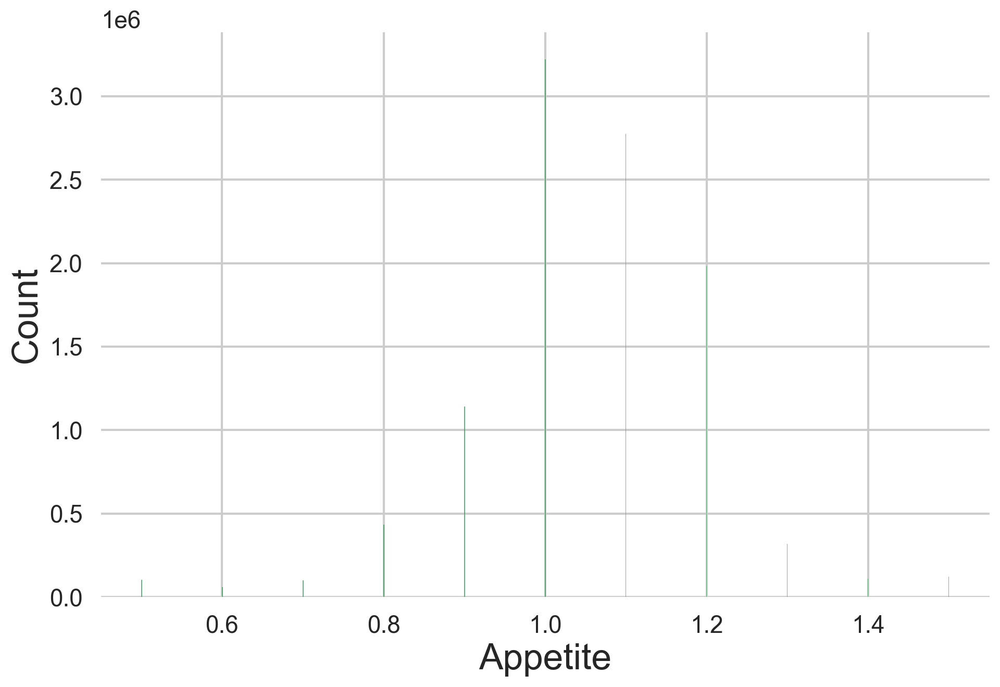

In [ ]:
sns.histplot(data=df, x='Appetite')

In [ ]:
df

,date,region,prod_farm_name,farm_type,farm_name,cows_total,milk_cows,milk_cows_d0,milk_cows_d1,milk_cows_d2,milk_cows_d3,weekly_milking_per_cow,gross_milk_yield,cow_retired,cow_retired_low_prod,cow_retired_hooves,cow_retired_inj_joint,cow_retired_mastit,cow_retired_jkt,bull_num,year_month,FeedingTaskID,Date,FeedNumber,SectionID,PhysiologicalGroupID,PhysiologicalGroupName,PhysiologicalGroupHeadCount,Appetite,RationName,RationPart,TotalWeight_kg,CompletedAt,year,PhysicalWeight_kg,ingredient_name,ingredient_group,ration_type
0,NaT,NaN,NaN,NaN,ЖК Добрино,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,2022-01,Farms/EkoNiva1C.216d4235-2852-11e8-80c4-1c98ec...,2022-01-01,15,9,2,Д1,352,0.9,Д1,0.5,8324.0,2022-01-03T05:45:50.5175580,2022,150.259,солома покупная,Объёмные корма,combifeed_only
1,NaT,NaN,NaN,NaN,ЖК Добрино,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,2022-01,Farms/EkoNiva1C.216d4235-2852-11e8-80c4-1c98ec...,2022-01-01,15,9,2,Д1,352,0.9,Д1,0.5,8324.0,2022-01-03T05:45:50.5175580,2022,880.444,люцерна сенаж,Объёмные корма,combifeed_only
2,NaT,NaN,NaN,NaN,ЖК Добрино,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,2022-01,Farms/EkoNiva1C.216d4235-2852-11e8-80c4-1c98ec...,2022-01-01,15,9,2,Д1,352,0.9,Д1,0.5,8324.0,2022-01-03T05:45:50.5175580,2022,542.257,комбикорм 10 группы,Комбикорма и стартеры,combifeed_only
3,NaT,NaN,NaN,NaN,ЖК Добрино,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,2022-01,Farms/EkoNiva1C.216d4235-2852-11e8-80c4-1c98ec...,2022-01-01,15,9,2,Д1,352,0.9,Д1,0.5,8324.0,2022-01-03T05:45:50.5175580,2022,991.793,кукуруза сухая,Энергетические и крахмалистые корма,combifeed_only
4,NaT,NaN,NaN,NaN,ЖК Добрино,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,2022-01,Farms/EkoNiva1C.216d4235-2852-11e8-80c4-1c98ec...,2022-01-01,15,9,2,Д1,352,0.9,Д1,0.5,8324.0,2022-01-03T05:45:50.5175580,2022,156.054,шрот подсолнечный,Белковые корма,combifeed_only
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
16411307,NaT,NaN,NaN,NaN,ЖК Подболотье,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,2025-10,Farms/EkoNiva1C.6c69fe1b-2b6f-11e8-80c4-1c98ec...,2025-10-22,16,1,3,Д1,139,1.1,Д1,0.6,5476.0,2025-10-22T08:30:28.0916260,2025,2.481,пропионат хрома,Минералы/буферные,premix_only
16411308,NaT,NaN,NaN,NaN,ЖК Подболотье,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,2025-10,Farms/EkoNiva1C.6c69fe1b-2b6f-11e8-80c4-1c98ec...,2025-10-22,16,1,3,Д1,139,1.1,Д1,0.6,5476.0,2025-10-22T08:30:28.0916260,2025,14.889,премикс дойный б,"Премиксы, БАДы, дрожжи",premix_only
16411309,NaT,NaN,NaN,NaN,ЖК Подболотье,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,2025-10,Farms/EkoNiva1C.6c69fe1b-2b6f-11e8-80c4-1c98ec...,2025-10-22,16,1,3,Д1,139,1.1,Д1,0.6,5476.0,2025-10-22T08:30:28.0916260,2025,1940.178,кукуруза силос,Объёмные корма,premix_only
16411310,NaT,NaN,NaN,NaN,ЖК Подболотье,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,2025-10,Farms/EkoNiva1C.6c69fe1b-2b6f-11e8-80c4-1c98ec...,2025-10-22,16,1,3,Д1,139,1.1,Д1,0.6,5476.0,2025-10-22T08:30:28.0916260,2025,177.275,патока свекловичная,Энергетические и крахмалистые корма,premix_only


In [ ]:
from scipy.stats import shapiro, normaltest
ps = {}
for name, g in df.groupby('ration_type'):
    vals = g['weekly_milking_per_cow'].dropna()

    if len(vals) < 20:
        print(f"{name}: мало данных ({len(vals)}), тест может быть ненадёжным")
        continue

    stat, p = normaltest(vals)  # более стабильный, чем shapiro
    ps[name] = p
    print(f"{name}: normaltest p={p:.20f}")
print(ps)

combifeed_only: normaltest p=0.00000000000000000000
no_premix_no_combifeed: normaltest p=0.00000000000000000000
premix_and_combifeed: normaltest p=0.00000000000000000000
premix_only: normaltest p=0.00000000000000000000
{'combifeed_only': np.float64(0.0), 'no_premix_no_combifeed': np.float64(0.0), 'premix_and_combifeed': np.float64(0.0), 'premix_only': np.float64(0.0)}


In [ ]:
from scipy.stats import shapiro, normaltest
ps = {}
for name, g in df.groupby('ration_type'):
    vals = g['Appetite'].dropna()

    if len(vals) < 20:
        print(f"{name}: мало данных ({len(vals)}), тест может быть ненадёжным")
        continue

    stat, p = normaltest(vals)  # более стабильный, чем shapiro
    ps[name] = p
    print(f"{name}: normaltest p={p:.20f}")
print(ps)

combifeed_only: normaltest p=0.00000000000000000000
no_premix_no_combifeed: normaltest p=0.00000000000000000000
premix_and_combifeed: normaltest p=0.00000000000000000000
premix_only: normaltest p=0.00000000000000000000
{'combifeed_only': np.float64(0.0), 'no_premix_no_combifeed': np.float64(0.0), 'premix_and_combifeed': np.float64(0.0), 'premix_only': np.float64(0.0)}


<Axes: xlabel='Appetite', ylabel='Count'>

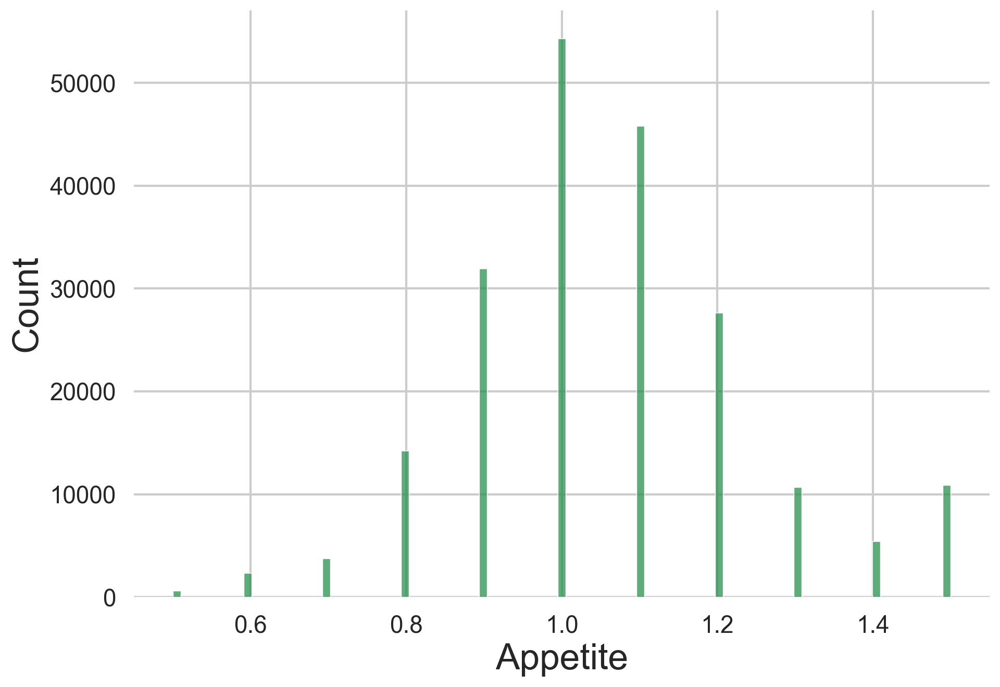

In [ ]:
sns.histplot(data=df[df['ration_type']=='premix_and_combifeed'], x='Appetite')

In [ ]:
dd

,date,region,prod_farm_name,farm_type,farm_name,cows_total,milk_cows,milk_cows_d0,milk_cows_d1,milk_cows_d2,milk_cows_d3,weekly_milking_per_cow,gross_milk_yield,cow_retired,cow_retired_low_prod,cow_retired_hooves,cow_retired_inj_joint,cow_retired_mastit,cow_retired_jkt,bull_num,year_month,FeedingTaskID,Date,FeedNumber,SectionID,PhysiologicalGroupID,PhysiologicalGroupName,PhysiologicalGroupHeadCount,Appetite,RationName,RationPart,TotalWeight_kg,CompletedAt,year,PhysicalWeight_kg,ingredient_name,ingredient_group,ration_type
1950326,2022-12-01,Воронеж,ЭНА Восток,ЖК,ЖК Бобров,2878.0,2609.0,69.0,2094.0,340.0,106.0,34.1,86551.0,0.0,NaN,NaN,NaN,NaN,NaN,23.0,2022-12,Farms/EkoNiva1C.6dd689ea-831c-11e7-80bc-1c98ec...,2022-12-01,1,461,33,Д0,7,0.9,Д0,1.0,236.0,2022-12-01T03:46:00.0000000,2022,12.180,солома (общ.),Объёмные корма,combifeed_only
1950327,2022-12-01,Воронеж,ЭНА Восток,ЖК,ЖК Бобров,2878.0,2609.0,69.0,2094.0,340.0,106.0,34.1,86551.0,0.0,NaN,NaN,NaN,NaN,NaN,23.0,2022-12,Farms/EkoNiva1C.6dd689ea-831c-11e7-80bc-1c98ec...,2022-12-01,1,461,33,Д0,7,0.9,Д0,1.0,236.0,2022-12-01T03:46:00.0000000,2022,51.354,люцерна сенаж,Объёмные корма,combifeed_only
1950328,2022-12-01,Воронеж,ЭНА Восток,ЖК,ЖК Бобров,2878.0,2609.0,69.0,2094.0,340.0,106.0,34.1,86551.0,0.0,NaN,NaN,NaN,NaN,NaN,23.0,2022-12,Farms/EkoNiva1C.6dd689ea-831c-11e7-80bc-1c98ec...,2022-12-01,1,461,33,Д0,7,0.9,Д0,1.0,236.0,2022-12-01T03:46:00.0000000,2022,4.609,шрот рапсовый,Белковые корма,combifeed_only
1950329,2022-12-01,Воронеж,ЭНА Восток,ЖК,ЖК Бобров,2878.0,2609.0,69.0,2094.0,340.0,106.0,34.1,86551.0,0.0,NaN,NaN,NaN,NaN,NaN,23.0,2022-12,Farms/EkoNiva1C.6dd689ea-831c-11e7-80bc-1c98ec...,2022-12-01,1,461,33,Д0,7,0.9,Д0,1.0,236.0,2022-12-01T03:46:00.0000000,2022,13.826,шрот соевый,Белковые корма,combifeed_only
1950330,2022-12-01,Воронеж,ЭНА Восток,ЖК,ЖК Бобров,2878.0,2609.0,69.0,2094.0,340.0,106.0,34.1,86551.0,0.0,NaN,NaN,NaN,NaN,NaN,23.0,2022-12,Farms/EkoNiva1C.6dd689ea-831c-11e7-80bc-1c98ec...,2022-12-01,1,461,33,Д0,7,0.9,Д0,1.0,236.0,2022-12-01T03:46:00.0000000,2022,5.267,ячмень,Энергетические и крахмалистые корма,combifeed_only
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
15170655,2025-07-01,Воронеж,ЭНА Левый берег,ЖК,ЖК Добрино,2988.0,2698.0,174.0,2369.0,0.0,155.0,42.4,112683.0,56.0,1.0,3.0,2.0,3.0,20.0,15.0,2025-07,Farms/EkoNiva1C.216d4235-2852-11e8-80c4-1c98ec...,2025-07-31,33,74,2,Д1,352,1.0,Д1,1.0,17790.0,2025-08-01T06:21:04.2696412,2025,1128.000,комбикорм №10 эна лб,Комбикорма и стартеры,combifeed_only
15170656,2025-07-01,Воронеж,ЭНА Левый берег,ЖК,ЖК Добрино,2988.0,2698.0,174.0,2369.0,0.0,155.0,42.4,112683.0,56.0,1.0,3.0,2.0,3.0,20.0,15.0,2025-07,Farms/EkoNiva1C.216d4235-2852-11e8-80c4-1c98ec...,2025-07-31,33,74,2,Д1,352,1.0,Д1,1.0,17790.0,2025-08-01T06:21:04.2696412,2025,504.000,жом свекловичный сухой,Жом и дробина,combifeed_only
15170657,2025-07-01,Воронеж,ЭНА Левый берег,ЖК,ЖК Добрино,2988.0,2698.0,174.0,2369.0,0.0,155.0,42.4,112683.0,56.0,1.0,3.0,2.0,3.0,20.0,15.0,2025-07,Farms/EkoNiva1C.216d4235-2852-11e8-80c4-1c98ec...,2025-07-31,33,74,2,Д1,352,1.0,Д1,1.0,17790.0,2025-08-01T06:21:04.2696412,2025,5068.000,кукуруза силос,Объёмные корма,combifeed_only
15170658,2025-07-01,Воронеж,ЭНА Левый берег,ЖК,ЖК Добрино,2988.0,2698.0,174.0,2369.0,0.0,155.0,42.4,112683.0,56.0,1.0,3.0,2.0,3.0,20.0,15.0,2025-07,Farms/EkoNiva1C.216d4235-2852-11e8-80c4-1c98ec...,2025-07-31,33,74,2,Д1,352,1.0,Д1,1.0,17790.0,2025-08-01T06:21:04.2696412,2025,625.000,патока свекловичная,Энергетические и крахмалистые корма,combifeed_only


In [ ]:
dd.groupby('ration_type')['weekly_milking_per_cow'].var()

ration_type
combifeed_only            13.626272
no_premix_no_combifeed    14.792241
premix_and_combifeed       6.454350
premix_only               57.355627
Name: weekly_milking_per_cow, dtype: float64

In [ ]:
df.groupby('ration_type')['Appetite'].var()

ration_type
combifeed_only            0.022091
no_premix_no_combifeed    0.018659
premix_and_combifeed      0.034243
premix_only               0.022150
Name: Appetite, dtype: float64

In [ ]:
from scipy.stats import kruskal
import pingouin as pg

welch = pg.welch_anova(
    data=dd,
    dv='weekly_milking_per_cow',
    between='ration_type'
)
print(f'ANOVA Welch --> {welch['p-unc'].values[0]}')

groups = [g['weekly_milking_per_cow'].dropna().values
          for _, g in dd.groupby('ration_type')]

stat, p = kruskal(*groups)

print("Kruskal p-value:", p)

ANOVA Welch --> 0.0
Kruskal p-value: 0.0


In [ ]:
posthoc = pg.pairwise_gameshowell(
    dv='weekly_milking_per_cow',
    between='ration_type',
    data=dd
)
posthoc

,A,B,mean(A),mean(B),diff,se,T,df,pval,hedges
0,combifeed_only,no_premix_no_combifeed,37.121715,36.833444,0.288271,0.003435,83.909516,2.946648e+06,0.0,0.077189
1,combifeed_only,premix_and_combifeed,37.121715,36.975829,0.145886,0.005997,24.328299,2.342944e+05,0.0,0.039967
2,combifeed_only,premix_only,37.121715,35.878865,1.242850,0.006709,185.259801,1.571577e+06,0.0,0.254226
3,no_premix_no_combifeed,premix_and_combifeed,36.833444,36.975829,-0.142384,0.006453,-22.064880,3.117591e+05,0.0,-0.038155
4,no_premix_no_combifeed,premix_only,36.833444,35.878865,0.954579,0.007120,134.077580,1.929008e+06,0.0,0.164155
5,premix_and_combifeed,premix_only,36.975829,35.878865,1.096963,0.008651,126.797590,8.233609e+05,0.0,0.153653


In [ ]:
welch = pg.welch_anova(
    data=df,
    dv='Appetite',
    between='ration_type'
)
print(f'ANOVA Welch --> {welch['p-unc'].values[0]}')

groups = [g['Appetite'].dropna().values
          for _, g in df.groupby('ration_type')]

stat, p = kruskal(*groups)

print("Kruskal p-value:", p)

ANOVA Welch --> 0.0
Kruskal p-value: 0.0


In [ ]:
posthoc = pg.pairwise_gameshowell(
    dv='Appetite',
    between='ration_type',
    data=df
)
posthoc

,A,B,mean(A),mean(B),diff,se,T,df,pval,hedges
0,combifeed_only,no_premix_no_combifeed,1.066090,1.040273,0.025817,0.000109,237.129391,4.201245e+06,0.0,0.177306
1,combifeed_only,premix_and_combifeed,1.066090,1.060324,0.005766,0.000410,14.051606,2.164615e+05,0.0,0.038462
2,combifeed_only,premix_only,1.066090,1.029087,0.037003,0.000133,279.094337,2.402747e+06,0.0,0.248890
3,no_premix_no_combifeed,premix_and_combifeed,1.040273,1.060324,-0.020051,0.000416,-48.164614,2.292119e+05,0.0,-0.141821
4,no_premix_no_combifeed,premix_only,1.040273,1.029087,0.011186,0.000150,74.593820,3.195164e+06,0.0,0.078891
5,premix_and_combifeed,premix_only,1.060324,1.029087,0.031236,0.000423,73.824480,2.444266e+05,0.0,0.203496


In [ ]:
df

,date,region,prod_farm_name,farm_type,farm_name,cows_total,milk_cows,milk_cows_d0,milk_cows_d1,milk_cows_d2,milk_cows_d3,weekly_milking_per_cow,gross_milk_yield,cow_retired,cow_retired_low_prod,cow_retired_hooves,cow_retired_inj_joint,cow_retired_mastit,cow_retired_jkt,bull_num,year_month,FeedingTaskID,Date,FeedNumber,SectionID,PhysiologicalGroupID,PhysiologicalGroupName,PhysiologicalGroupHeadCount,Appetite,RationName,RationPart,TotalWeight_kg,CompletedAt,year,PhysicalWeight_kg,ingredient_name,ingredient_group,ration_type
0,NaT,NaN,NaN,NaN,ЖК Добрино,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,2022-01,Farms/EkoNiva1C.216d4235-2852-11e8-80c4-1c98ec...,2022-01-01,15,9,2,Д1,352,0.9,Д1,0.5,8324.0,2022-01-03T05:45:50.5175580,2022,150.259,солома покупная,Объёмные корма,combifeed_only
1,NaT,NaN,NaN,NaN,ЖК Добрино,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,2022-01,Farms/EkoNiva1C.216d4235-2852-11e8-80c4-1c98ec...,2022-01-01,15,9,2,Д1,352,0.9,Д1,0.5,8324.0,2022-01-03T05:45:50.5175580,2022,880.444,люцерна сенаж,Объёмные корма,combifeed_only
2,NaT,NaN,NaN,NaN,ЖК Добрино,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,2022-01,Farms/EkoNiva1C.216d4235-2852-11e8-80c4-1c98ec...,2022-01-01,15,9,2,Д1,352,0.9,Д1,0.5,8324.0,2022-01-03T05:45:50.5175580,2022,542.257,комбикорм 10 группы,Комбикорма и стартеры,combifeed_only
3,NaT,NaN,NaN,NaN,ЖК Добрино,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,2022-01,Farms/EkoNiva1C.216d4235-2852-11e8-80c4-1c98ec...,2022-01-01,15,9,2,Д1,352,0.9,Д1,0.5,8324.0,2022-01-03T05:45:50.5175580,2022,991.793,кукуруза сухая,Энергетические и крахмалистые корма,combifeed_only
4,NaT,NaN,NaN,NaN,ЖК Добрино,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,2022-01,Farms/EkoNiva1C.216d4235-2852-11e8-80c4-1c98ec...,2022-01-01,15,9,2,Д1,352,0.9,Д1,0.5,8324.0,2022-01-03T05:45:50.5175580,2022,156.054,шрот подсолнечный,Белковые корма,combifeed_only
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
16411307,NaT,NaN,NaN,NaN,ЖК Подболотье,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,2025-10,Farms/EkoNiva1C.6c69fe1b-2b6f-11e8-80c4-1c98ec...,2025-10-22,16,1,3,Д1,139,1.1,Д1,0.6,5476.0,2025-10-22T08:30:28.0916260,2025,2.481,пропионат хрома,Минералы/буферные,premix_only
16411308,NaT,NaN,NaN,NaN,ЖК Подболотье,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,2025-10,Farms/EkoNiva1C.6c69fe1b-2b6f-11e8-80c4-1c98ec...,2025-10-22,16,1,3,Д1,139,1.1,Д1,0.6,5476.0,2025-10-22T08:30:28.0916260,2025,14.889,премикс дойный б,"Премиксы, БАДы, дрожжи",premix_only
16411309,NaT,NaN,NaN,NaN,ЖК Подболотье,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,2025-10,Farms/EkoNiva1C.6c69fe1b-2b6f-11e8-80c4-1c98ec...,2025-10-22,16,1,3,Д1,139,1.1,Д1,0.6,5476.0,2025-10-22T08:30:28.0916260,2025,1940.178,кукуруза силос,Объёмные корма,premix_only
16411310,NaT,NaN,NaN,NaN,ЖК Подболотье,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,2025-10,Farms/EkoNiva1C.6c69fe1b-2b6f-11e8-80c4-1c98ec...,2025-10-22,16,1,3,Д1,139,1.1,Д1,0.6,5476.0,2025-10-22T08:30:28.0916260,2025,177.275,патока свекловичная,Энергетические и крахмалистые корма,premix_only


In [ ]:
dd.columns

Index(['date', 'region', 'prod_farm_name', 'farm_type', 'farm_name',
       'cows_total', 'milk_cows', 'milk_cows_d0', 'milk_cows_d1',
       'milk_cows_d2', 'milk_cows_d3', 'weekly_milking_per_cow',
       'gross_milk_yield', 'cow_retired', 'cow_retired_low_prod',
       'cow_retired_hooves', 'cow_retired_inj_joint', 'cow_retired_mastit',
       'cow_retired_jkt', 'bull_num', 'year_month', 'FeedingTaskID', 'Date',
       'FeedNumber', 'SectionID', 'PhysiologicalGroupID',
       'PhysiologicalGroupName', 'PhysiologicalGroupHeadCount', 'Appetite',
       'RationName', 'RationPart', 'TotalWeight_kg', 'CompletedAt', 'year',
       'PhysicalWeight_kg', 'ingredient_name', 'ingredient_group',
       'ration_type'],
      dtype='object')

In [ ]:
(dd['cow_retired_mastit'].notna()).sum() / dd.shape[0]

np.float64(0.2676844584333659)

<Axes: xlabel='ration_type', ylabel='cow_retired_mastit'>

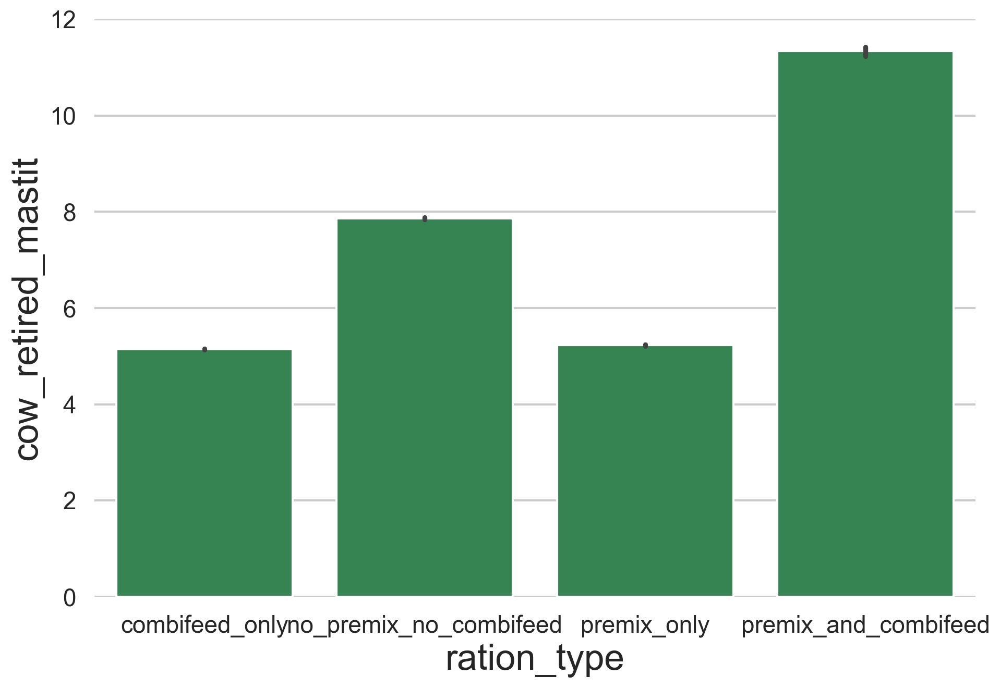

In [ ]:
sns.barplot(data=dd, x='ration_type', y='cow_retired_mastit')

In [ ]:
production_indicators['cow_retired_mastit'].notna().sum()

np.int64(380)

In [ ]:
fad

,FeedingTaskID,Date,farm_name,FeedNumber,SectionID,PhysiologicalGroupID,PhysiologicalGroupName,PhysiologicalGroupHeadCount,Appetite,RationName,RationPart,TotalWeight_kg,CompletedAt,year,PhysicalWeight_kg,ingredient_name,ingredient_group,year_month,ration_type
0,Farms/EkoNiva1C.216d4235-2852-11e8-80c4-1c98ec...,2022-01-01,ЖК Добрино,15,9,2,Д1,352,0.9,Д1,0.5,8324.0,2022-01-03T05:45:50.5175580,2022,150.259,солома покупная,Объёмные корма,2022-01,combifeed_only
1,Farms/EkoNiva1C.216d4235-2852-11e8-80c4-1c98ec...,2022-01-01,ЖК Добрино,15,9,2,Д1,352,0.9,Д1,0.5,8324.0,2022-01-03T05:45:50.5175580,2022,880.444,люцерна сенаж,Объёмные корма,2022-01,combifeed_only
2,Farms/EkoNiva1C.216d4235-2852-11e8-80c4-1c98ec...,2022-01-01,ЖК Добрино,15,9,2,Д1,352,0.9,Д1,0.5,8324.0,2022-01-03T05:45:50.5175580,2022,542.257,комбикорм 10 группы,Комбикорма и стартеры,2022-01,combifeed_only
3,Farms/EkoNiva1C.216d4235-2852-11e8-80c4-1c98ec...,2022-01-01,ЖК Добрино,15,9,2,Д1,352,0.9,Д1,0.5,8324.0,2022-01-03T05:45:50.5175580,2022,991.793,кукуруза сухая,Энергетические и крахмалистые корма,2022-01,combifeed_only
4,Farms/EkoNiva1C.216d4235-2852-11e8-80c4-1c98ec...,2022-01-01,ЖК Добрино,15,9,2,Д1,352,0.9,Д1,0.5,8324.0,2022-01-03T05:45:50.5175580,2022,156.054,шрот подсолнечный,Белковые корма,2022-01,combifeed_only
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
16411327,Farms/EkoNiva1C.6c69fe1b-2b6f-11e8-80c4-1c98ec...,2025-10-22,ЖК Подболотье,20,131,1,Нетели,32,1.2,С1,1.0,1106.0,2025-10-22T08:50:05.2368034,2025,120.643,солома (общ.),Объёмные корма,2025-10,premix_only
16411328,Farms/EkoNiva1C.6c69fe1b-2b6f-11e8-80c4-1c98ec...,2025-10-22,ЖК Подболотье,20,131,1,Нетели,32,1.2,С1,1.0,1106.0,2025-10-22T08:50:05.2368034,2025,549.169,люцерна сенаж,Объёмные корма,2025-10,premix_only
16411329,Farms/EkoNiva1C.6c69fe1b-2b6f-11e8-80c4-1c98ec...,2025-10-22,ЖК Подболотье,20,131,1,Нетели,32,1.2,С1,1.0,1106.0,2025-10-22T08:50:05.2368034,2025,36.676,жом свекловичный сухой,Жом и дробина,2025-10,premix_only
16411330,Farms/EkoNiva1C.6c69fe1b-2b6f-11e8-80c4-1c98ec...,2025-10-22,ЖК Подболотье,20,131,1,Нетели,32,1.2,С1,1.0,1106.0,2025-10-22T08:50:05.2368034,2025,10.049,премикс молодняк 6-24,"Премиксы, БАДы, дрожжи",2025-10,premix_only


In [ ]:
df['ration_type'].value_counts()

ration_type
combifeed_only            6361673
no_premix_no_combifeed    2226417
premix_only               1570321
premix_and_combifeed       207630
Name: count, dtype: int64

In [ ]:
production_indicators

,date,region,prod_farm_name,farm_type,farm_name,cows_total,milk_cows,milk_cows_d0,milk_cows_d1,milk_cows_d2,milk_cows_d3,weekly_milking_per_cow,gross_milk_yield,cow_retired,cow_retired_low_prod,cow_retired_hooves,cow_retired_inj_joint,cow_retired_mastit,cow_retired_jkt,bull_num,year_month
0,2022-12-01,Воронеж,ЭНА Восток,ЖК,ЖК Бобров,2878.0,2609.0,69.0,2094.0,340.0,106.0,34.1,86551.0,0.0,NaN,NaN,NaN,NaN,NaN,23.0,2022-12
1,2022-12-01,Воронеж,ЭНА Восток,ЖК,ЖК Бобров-2,2882.0,2591.0,131.0,2149.0,261.0,50.0,36.3,88816.0,68.0,NaN,NaN,NaN,NaN,NaN,18.0,2022-12
2,2022-12-01,Воронеж,ЭНА Восток,ЖК,ЖК Верхний Икорец,2893.0,2580.0,101.0,2104.0,375.0,0.0,38.3,98563.0,85.0,NaN,NaN,NaN,NaN,NaN,0.0,2022-12
3,2022-12-01,Воронеж,ЭНА Восток,ЖК,ЖК Петропавловка,2885.0,2686.0,90.0,2271.0,163.0,162.0,35.2,87647.0,153.0,NaN,NaN,NaN,NaN,NaN,26.0,2022-12
4,2022-12-01,Воронеж,ЭНА Восток,МТФ,МТФ ЭНАВ,799.0,738.0,8.0,507.0,0.0,223.0,NaN,NaN,66.0,NaN,NaN,NaN,NaN,NaN,0.0,2022-12
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
1742,2025-07-01,Сибирь,Сибирская Нива Маслянино,ЖК,ЖК Елбань,5882.0,5468.0,169.0,4455.0,288.0,556.0,36.0,191276.0,526.0,0.0,14.0,33.0,13.0,26.0,0.0,2025-07
1743,2025-07-01,Сибирь,Сибирская Нива Маслянино,ЖК,ЖК Пеньково,4666.0,4172.0,304.0,3023.0,559.0,286.0,36.7,147218.0,189.0,48.0,23.0,24.0,19.0,24.0,12.0,2025-07
1744,2025-07-01,Сибирь,Сибирская Нива Маслянино,РМ,РМ Пеньково,0.0,0.0,0.0,0.0,0.0,0.0,NaN,NaN,0.0,NaN,NaN,NaN,NaN,NaN,164.0,2025-07
1745,2025-07-01,Сибирь,Сибирская Нива Черепаново,ЖК,ЖК Огнева Заимка,3544.0,3140.0,214.0,1842.0,1027.0,57.0,40.4,119264.0,115.0,21.0,18.0,20.0,20.0,11.0,10.0,2025-07


In [ ]:
herd_metrics['cow_metrit'].notna().sum() / herd_metrics.shape[0]

np.float64(0.34903240848682676)

In [ ]:
herd_metrics

,date,region,prod_farm_name,farm_type,farm_name,ls_capacity,ls_occupancy,forage_cow,milk_cow,dry_cow,milk_marketab_prc,forcow_milk_yeild,forcow_milk_yeild_stand,milk_fat,milk_protein,somatic_cells,bac_contam,cow_retired,cow_lame,cow_mastits,calves,cow_metrit,ph_urine_avr,year_month
0,2020-01-01,Воронеж,ЭНА Восток,ЖК,ЖК Бобров,2800.0,95.535714,2675.0,2329.0,346.0,94.0,NaN,NaN,NaN,NaN,92.0,41.00,52.0,90.0,57,NaN,NaN,NaN,2020-01
1,2020-01-01,Воронеж,ЭНА Восток,ЖК,ЖК Бобров-2,2800.0,101.678571,2847.0,2378.0,469.0,96.0,NaN,NaN,NaN,NaN,90.0,29.00,30.0,44.0,27,NaN,NaN,NaN,2020-01
2,2020-01-01,Воронеж,ЭНА Восток,ЖК,ЖК Верхний Икорец,2800.0,101.071429,2830.0,2363.0,467.0,96.0,NaN,NaN,NaN,NaN,161.0,72.00,52.0,57.0,77,NaN,NaN,NaN,2020-01
3,2020-01-01,Воронеж,ЭНА Восток,ЖК,ЖК Петропавловка,2800.0,59.321429,1661.0,1632.0,29.0,99.0,NaN,NaN,NaN,NaN,69.0,8.00,35.0,120.0,26,NaN,NaN,NaN,2020-01
4,2020-01-01,Воронеж,ЭНА Восток,МТФ,МТФ Владимировка,467.0,37.473233,175.0,175.0,0.0,96.0,NaN,NaN,NaN,NaN,259.0,58.00,17.0,2.0,10,NaN,NaN,NaN,2020-01
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
4296,2025-07-01,Сибирь,Сибирская Нива Маслянино,ЖК,ЖК Елбань,6200.0,95.000000,5882.0,5468.0,414.0,98.0,32.20,33.9,3.9,3.4,102.5,39.36,526.0,186.0,90,812.0,132.0,5.8,2025-07
4297,2025-07-01,Сибирь,Сибирская Нива Маслянино,ЖК,ЖК Пеньково,4700.0,99.000000,4666.0,4172.0,494.0,95.0,30.11,31.8,3.9,3.4,114.0,46.00,189.0,305.0,75,843.0,123.0,6.3,2025-07
4298,2025-07-01,Сибирь,Сибирская Нива Маслянино,РМ,РМ Пеньково,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,2025-07
4299,2025-07-01,Сибирь,Сибирская Нива Черепаново,ЖК,ЖК Огнева Заимка,3550.0,100.000000,3544.0,3141.0,403.0,94.0,34.95,36.0,3.8,3.3,91.0,38.00,115.0,124.0,47,514.0,131.0,6.5,2025-07


In [ ]:
fad

,FeedingTaskID,Date,farm_name,FeedNumber,SectionID,PhysiologicalGroupID,PhysiologicalGroupName,PhysiologicalGroupHeadCount,Appetite,RationName,RationPart,TotalWeight_kg,CompletedAt,year,PhysicalWeight_kg,ingredient_name,ingredient_group,year_month,ration_type
0,Farms/EkoNiva1C.216d4235-2852-11e8-80c4-1c98ec...,2022-01-01,ЖК Добрино,15,9,2,Д1,352,0.9,Д1,0.5,8324.0,2022-01-03T05:45:50.5175580,2022,150.259,солома покупная,Объёмные корма,2022-01,combifeed_only
1,Farms/EkoNiva1C.216d4235-2852-11e8-80c4-1c98ec...,2022-01-01,ЖК Добрино,15,9,2,Д1,352,0.9,Д1,0.5,8324.0,2022-01-03T05:45:50.5175580,2022,880.444,люцерна сенаж,Объёмные корма,2022-01,combifeed_only
2,Farms/EkoNiva1C.216d4235-2852-11e8-80c4-1c98ec...,2022-01-01,ЖК Добрино,15,9,2,Д1,352,0.9,Д1,0.5,8324.0,2022-01-03T05:45:50.5175580,2022,542.257,комбикорм 10 группы,Комбикорма и стартеры,2022-01,combifeed_only
3,Farms/EkoNiva1C.216d4235-2852-11e8-80c4-1c98ec...,2022-01-01,ЖК Добрино,15,9,2,Д1,352,0.9,Д1,0.5,8324.0,2022-01-03T05:45:50.5175580,2022,991.793,кукуруза сухая,Энергетические и крахмалистые корма,2022-01,combifeed_only
4,Farms/EkoNiva1C.216d4235-2852-11e8-80c4-1c98ec...,2022-01-01,ЖК Добрино,15,9,2,Д1,352,0.9,Д1,0.5,8324.0,2022-01-03T05:45:50.5175580,2022,156.054,шрот подсолнечный,Белковые корма,2022-01,combifeed_only
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
16411327,Farms/EkoNiva1C.6c69fe1b-2b6f-11e8-80c4-1c98ec...,2025-10-22,ЖК Подболотье,20,131,1,Нетели,32,1.2,С1,1.0,1106.0,2025-10-22T08:50:05.2368034,2025,120.643,солома (общ.),Объёмные корма,2025-10,premix_only
16411328,Farms/EkoNiva1C.6c69fe1b-2b6f-11e8-80c4-1c98ec...,2025-10-22,ЖК Подболотье,20,131,1,Нетели,32,1.2,С1,1.0,1106.0,2025-10-22T08:50:05.2368034,2025,549.169,люцерна сенаж,Объёмные корма,2025-10,premix_only
16411329,Farms/EkoNiva1C.6c69fe1b-2b6f-11e8-80c4-1c98ec...,2025-10-22,ЖК Подболотье,20,131,1,Нетели,32,1.2,С1,1.0,1106.0,2025-10-22T08:50:05.2368034,2025,36.676,жом свекловичный сухой,Жом и дробина,2025-10,premix_only
16411330,Farms/EkoNiva1C.6c69fe1b-2b6f-11e8-80c4-1c98ec...,2025-10-22,ЖК Подболотье,20,131,1,Нетели,32,1.2,С1,1.0,1106.0,2025-10-22T08:50:05.2368034,2025,10.049,премикс молодняк 6-24,"Премиксы, БАДы, дрожжи",2025-10,premix_only


In [ ]:
herd_fad = fad.merge(herd_metrics, on=['year_month', 'farm_name'], how='left')

In [ ]:
herd_fad_s = herd_fad[herd_fad['PhysiologicalGroupName'].isin(suhostoy)]

In [ ]:
herd_fad_s

,FeedingTaskID,Date,farm_name,FeedNumber,SectionID,PhysiologicalGroupID,PhysiologicalGroupName,PhysiologicalGroupHeadCount,Appetite,RationName,RationPart,TotalWeight_kg,CompletedAt,year,PhysicalWeight_kg,ingredient_name,ingredient_group,year_month,ration_type,date,region,prod_farm_name,farm_type,ls_capacity,ls_occupancy,forage_cow,milk_cow,dry_cow,milk_marketab_prc,forcow_milk_yeild,forcow_milk_yeild_stand,milk_fat,milk_protein,somatic_cells,bac_contam,cow_retired,cow_lame,cow_mastits,calves,cow_metrit,ph_urine_avr
252,Farms/EkoNiva1C.216d4235-2852-11e8-80c4-1c98ec...,2022-01-01,ЖК Добрино,24,90,5,С1,24,1.0,С1,1.0,2228.0,2022-01-01T09:47:00.0000000,2022,142.699,сено луговое,Объёмные корма,2022-01,premix_only,2022-01-01,Воронеж,ЭНА Левый берег,ЖК,2800.0,104.964286,2939.0,2748.0,191.0,94.0,NaN,NaN,NaN,NaN,85.0,12.0,51.0,59.0,31,NaN,NaN,NaN
253,Farms/EkoNiva1C.216d4235-2852-11e8-80c4-1c98ec...,2022-01-01,ЖК Добрино,24,90,5,С1,24,1.0,С1,1.0,2228.0,2022-01-01T09:47:00.0000000,2022,263.445,люцерна сенаж,Объёмные корма,2022-01,premix_only,2022-01-01,Воронеж,ЭНА Левый берег,ЖК,2800.0,104.964286,2939.0,2748.0,191.0,94.0,NaN,NaN,NaN,NaN,85.0,12.0,51.0,59.0,31,NaN,NaN,NaN
254,Farms/EkoNiva1C.216d4235-2852-11e8-80c4-1c98ec...,2022-01-01,ЖК Добрино,24,90,5,С1,24,1.0,С1,1.0,2228.0,2022-01-01T09:47:00.0000000,2022,0.997,соль,Минералы/буферные,2022-01,premix_only,2022-01-01,Воронеж,ЭНА Левый берег,ЖК,2800.0,104.964286,2939.0,2748.0,191.0,94.0,NaN,NaN,NaN,NaN,85.0,12.0,51.0,59.0,31,NaN,NaN,NaN
255,Farms/EkoNiva1C.216d4235-2852-11e8-80c4-1c98ec...,2022-01-01,ЖК Добрино,24,90,5,С1,24,1.0,С1,1.0,2228.0,2022-01-01T09:47:00.0000000,2022,3.741,премикс дойный,"Премиксы, БАДы, дрожжи",2022-01,premix_only,2022-01-01,Воронеж,ЭНА Левый берег,ЖК,2800.0,104.964286,2939.0,2748.0,191.0,94.0,NaN,NaN,NaN,NaN,85.0,12.0,51.0,59.0,31,NaN,NaN,NaN
256,Farms/EkoNiva1C.216d4235-2852-11e8-80c4-1c98ec...,2022-01-01,ЖК Добрино,24,90,5,С1,24,1.0,С1,1.0,2228.0,2022-01-01T09:47:00.0000000,2022,206.041,кукуруза силос,Объёмные корма,2022-01,premix_only,2022-01-01,Воронеж,ЭНА Левый берег,ЖК,2800.0,104.964286,2939.0,2748.0,191.0,94.0,NaN,NaN,NaN,NaN,85.0,12.0,51.0,59.0,31,NaN,NaN,NaN
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
16411322,Farms/EkoNiva1C.6c69fe1b-2b6f-11e8-80c4-1c98ec...,2025-10-22,ЖК Подболотье,19,103,7,С1,37,1.4,С1,1.0,1601.0,2025-10-22T08:51:09.2068847,2025,189.343,солома (общ.),Объёмные корма,2025-10,premix_only,NaT,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN
16411323,Farms/EkoNiva1C.6c69fe1b-2b6f-11e8-80c4-1c98ec...,2025-10-22,ЖК Подболотье,19,103,7,С1,37,1.4,С1,1.0,1601.0,2025-10-22T08:51:09.2068847,2025,861.890,люцерна сенаж,Объёмные корма,2025-10,premix_only,NaT,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN
16411324,Farms/EkoNiva1C.6c69fe1b-2b6f-11e8-80c4-1c98ec...,2025-10-22,ЖК Подболотье,19,103,7,С1,37,1.4,С1,1.0,1601.0,2025-10-22T08:51:09.2068847,2025,57.560,жом свекловичный сухой,Жом и дробина,2025-10,premix_only,NaT,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN
16411325,Farms/EkoNiva1C.6c69fe1b-2b6f-11e8-80c4-1c98ec...,2025-10-22,ЖК Подболотье,19,103,7,С1,37,1.4,С1,1.0,1601.0,2025-10-22T08:51:09.2068847,2025,15.771,премикс молодняк 6-24,"Премиксы, БАДы, дрожжи",2025-10,premix_only,NaT,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN


In [ ]:
ration_monthly = (
    herd_fad_s.groupby(['farm_name', 'year_month', 'ration_type'])
    .size()
    .reset_index(name='count')
)
ration_pivot = ration_monthly.pivot_table(
    index=['farm_name', 'year_month'],
    columns='ration_type',
    values='count',
    aggfunc='sum',
    fill_value=0
).reset_index()

ration_cols = [c for c in ration_pivot.columns if c not in ['farm_name','year_month']]

ration_pivot[ration_cols] = ration_pivot[ration_cols].div(
    ration_pivot[ration_cols].sum(axis=1),
    axis=0
)
metrit = herd_fad_s[['farm_name','year_month','cow_metrit']].drop_duplicates()

merged = ration_pivot.merge(metrit, on=['farm_name','year_month'], how='left')

In [ ]:
merged

,farm_name,year_month,combifeed_only,no_premix_no_combifeed,premix_and_combifeed,premix_only,cow_metrit
0,ЖК Авангард,2023-03,0.0,0.0,0.000000,1.000000,16.0
1,ЖК Авангард,2023-04,0.0,0.0,0.000000,1.000000,28.0
2,ЖК Авангард,2023-05,0.0,0.0,0.000000,1.000000,19.0
3,ЖК Авангард,2023-06,0.0,0.0,0.676030,0.323970,29.0
4,ЖК Авангард,2023-07,0.0,0.0,0.731707,0.268293,22.0
...,...,...,...,...,...,...,...
1519,ЭФ Родня,2025-06,0.0,1.0,0.000000,0.000000,NaN
1520,ЭФ Родня,2025-07,0.0,1.0,0.000000,0.000000,NaN
1521,ЭФ Родня,2025-08,0.0,1.0,0.000000,0.000000,NaN
1522,ЭФ Родня,2025-09,0.0,1.0,0.000000,0.000000,NaN


In [ ]:
merged_melt = merged.melt(id_vars=['farm_name', 'year_month', 'cow_metrit'], var_name='ration_type', value_name='percentage')

<Axes: xlabel='value', ylabel='cow_metrit'>

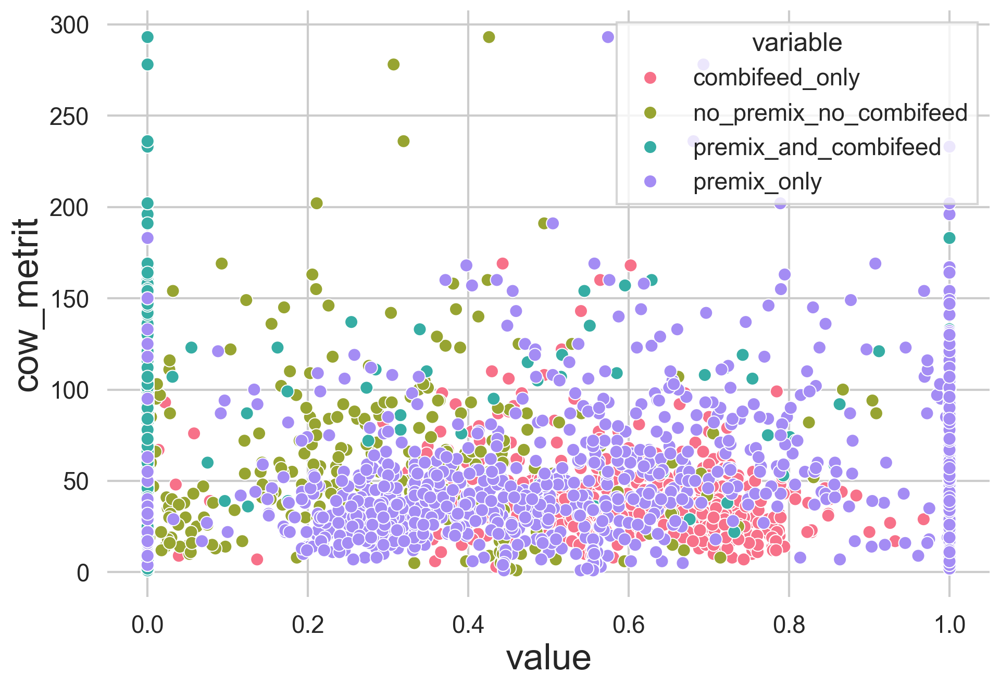

In [ ]:
sns.scatterplot(data=merged.melt(id_vars=['farm_name', 'year_month', 'cow_metrit']), x='value', y='cow_metrit', hue='variable')

<Axes: xlabel='premix_and_combifeed', ylabel='cow_metrit'>

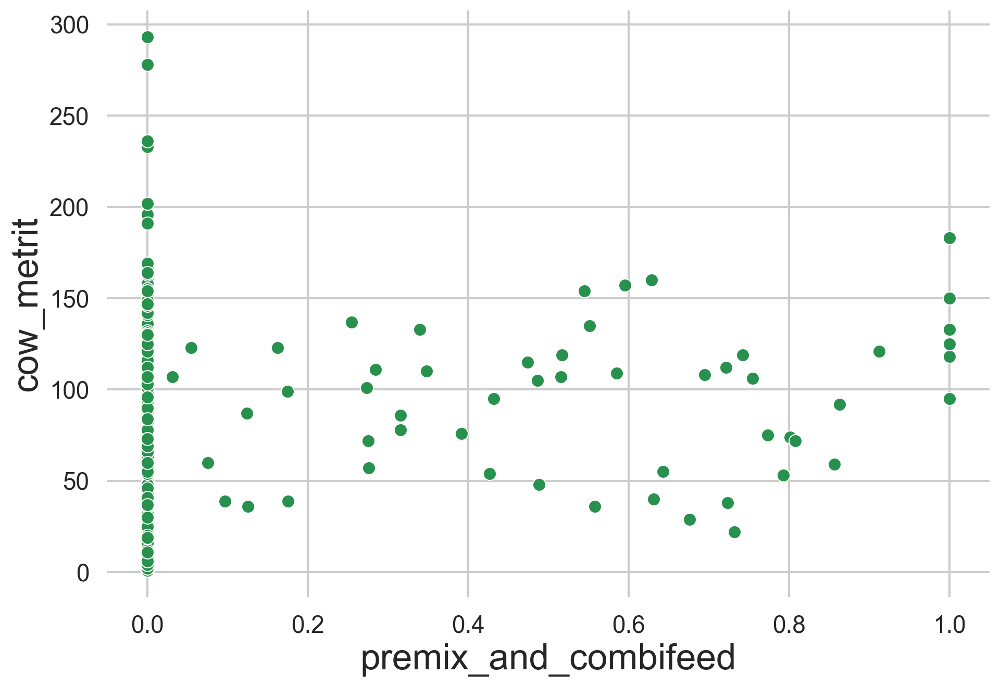

In [ ]:
sns.scatterplot(data=merged, x='premix_and_combifeed', y='cow_metrit')

In [ ]:
sm.OLS(merged_melt['cow_metrit'], sm.add_constant(merged_melt['percentage'])).fit().pvalues

const        NaN
percentage   NaN
dtype: float64

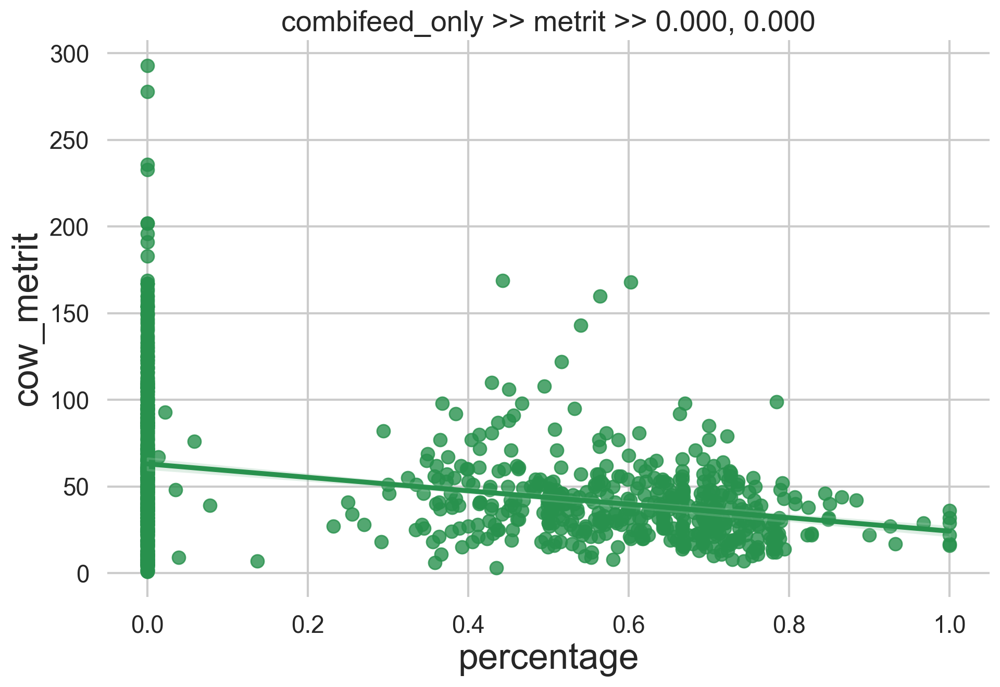

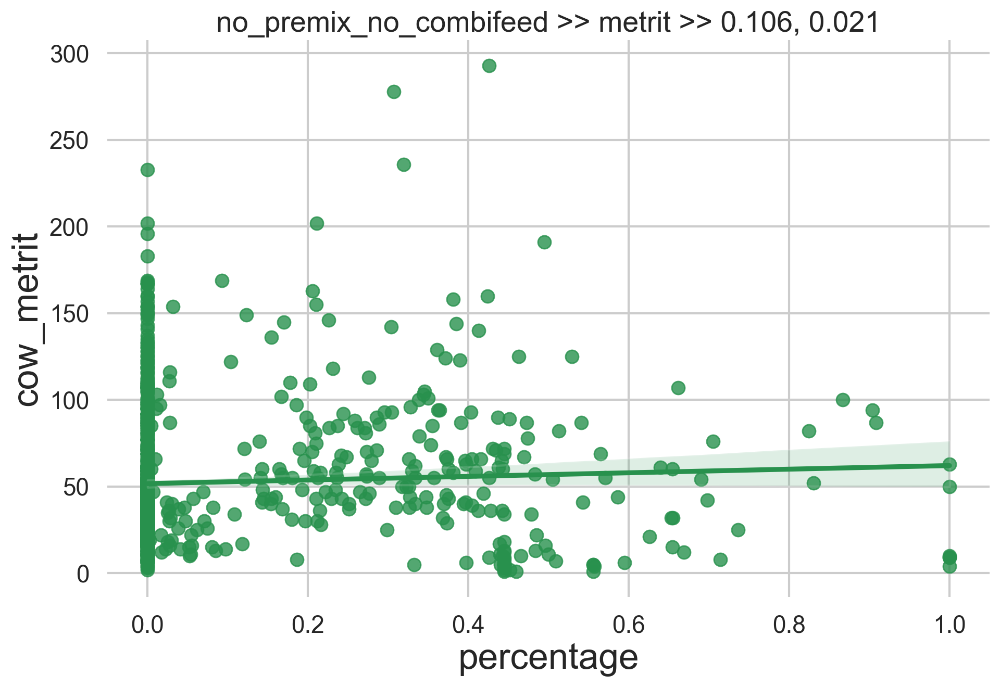

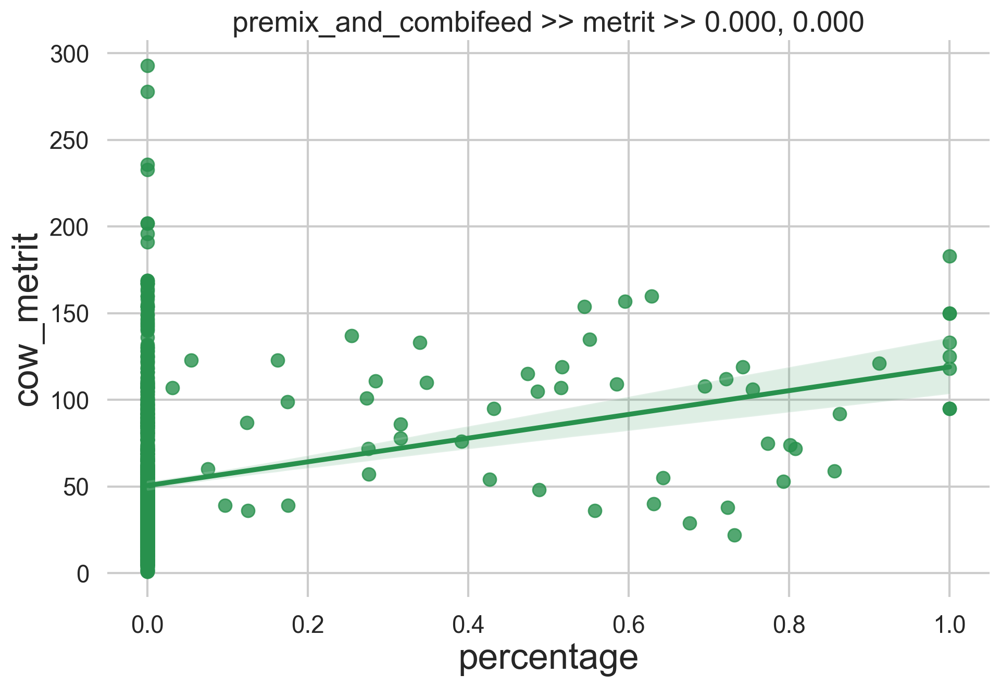

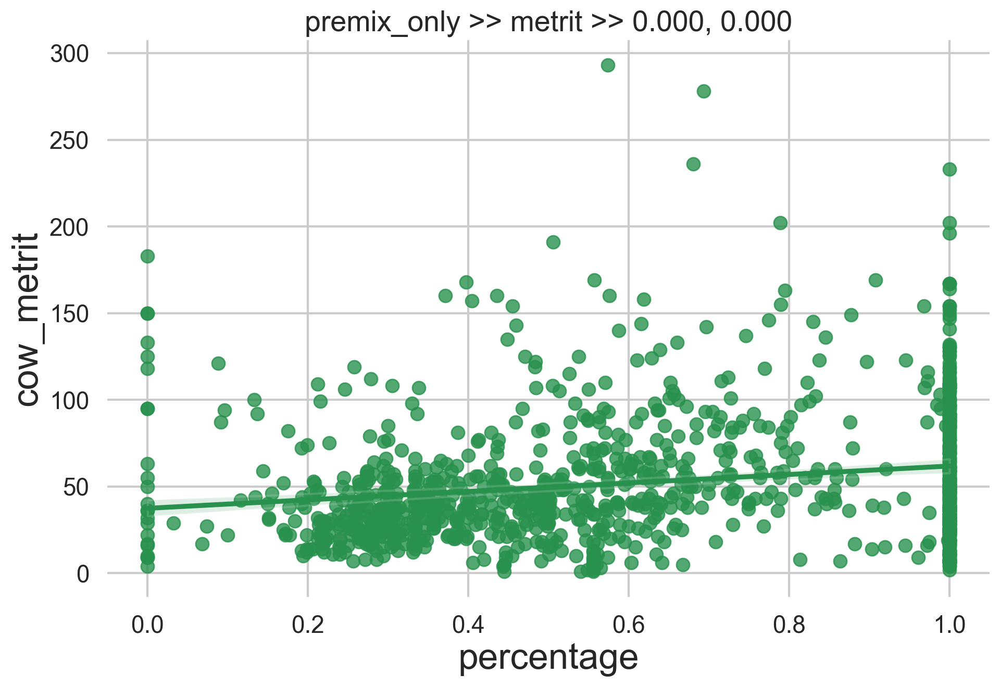

In [ ]:
from scipy.stats import pearsonr, spearmanr

for t in merged_melt['ration_type'].unique():
    X = merged_melt[(merged_melt['ration_type'] == t)]
    x = X['percentage']
    y = X['cow_metrit']
    mask = ~np.isnan(x) & ~np.isnan(y)
    r, p = pearsonr(x[mask], y[mask])
    rho, p2 = spearmanr(x[mask], y[mask])
    plt.subplots()
    sns.regplot(data=X, x='percentage', y='cow_metrit')
    plt.title(f'{t} >> metrit >> {p:.3f}, {p2:.3f}', fontsize=20)

In [ ]:
merged_melt.groupby('ration_type')['cow_metrit'].var()

ration_type
combifeed_only            1415.227194
no_premix_no_combifeed    1415.227194
premix_and_combifeed      1415.227194
premix_only               1415.227194
Name: cow_metrit, dtype: float64

In [ ]:
merged_melt.columns

Index(['farm_name', 'year_month', 'cow_metrit', 'ration_type', 'percentage'], dtype='object')

In [ ]:
merged_melt["pct_logit"] = np.log(merged_melt["percentage"] / (1 - merged_melt["percentage"]))

In [ ]:
dfs = (merged_melt.groupby(['farm_name', 'year_month'])['percentage'].sum() != 1).reset_index()
dfs[dfs['percentage'] == True]

,farm_name,year_month,percentage
320,ЖК Бушовка,2025-09,True
897,ЖК Огнева Заимка,2024-04,True


In [ ]:
merged_melt[merged_melt['farm_name'].isin(['ЖК Бушовка', 'ЖК Огнева Заимка'])].groupby(['farm_name', 'year_month'])['percentage'].sum()

farm_name         year_month
ЖК Бушовка        2022-08       1.0
                  2022-09       1.0
                  2022-10       1.0
                  2022-11       1.0
                  2022-12       1.0
                               ... 
ЖК Огнева Заимка  2025-06       1.0
                  2025-07       1.0
                  2025-08       1.0
                  2025-09       1.0
                  2025-10       1.0
Name: percentage, Length: 71, dtype: float64

In [ ]:
merged

,farm_name,year_month,combifeed_only,no_premix_no_combifeed,premix_and_combifeed,premix_only,cow_metrit
0,ЖК Авангард,2023-03,0.0,0.0,0.000000,1.000000,16.0
1,ЖК Авангард,2023-04,0.0,0.0,0.000000,1.000000,28.0
2,ЖК Авангард,2023-05,0.0,0.0,0.000000,1.000000,19.0
3,ЖК Авангард,2023-06,0.0,0.0,0.676030,0.323970,29.0
4,ЖК Авангард,2023-07,0.0,0.0,0.731707,0.268293,22.0
...,...,...,...,...,...,...,...
1519,ЭФ Родня,2025-06,0.0,1.0,0.000000,0.000000,NaN
1520,ЭФ Родня,2025-07,0.0,1.0,0.000000,0.000000,NaN
1521,ЭФ Родня,2025-08,0.0,1.0,0.000000,0.000000,NaN
1522,ЭФ Родня,2025-09,0.0,1.0,0.000000,0.000000,NaN


<Axes: xlabel='cow_metrit', ylabel='Count'>

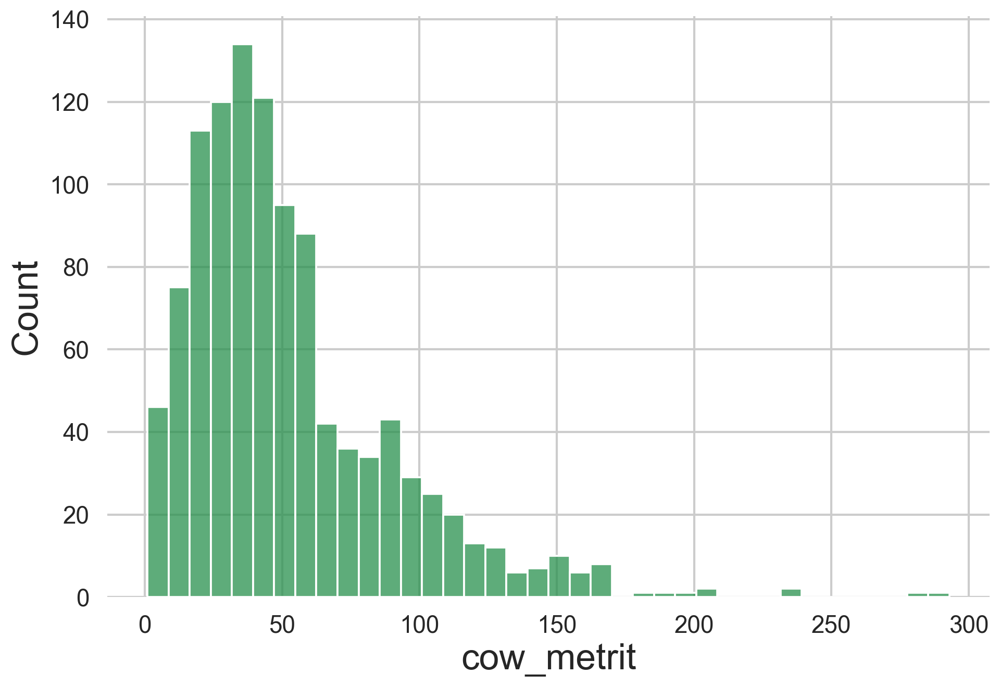

In [ ]:
sns.histplot(data=merged, x='cow_metrit')

In [ ]:
merged['cow_metrit'].describe()

count    1092.000000
mean       52.510989
std        37.619505
min         1.000000
25%        27.000000
50%        43.000000
75%        67.000000
max       293.000000
Name: cow_metrit, dtype: float64

In [ ]:
mean = merged['cow_metrit'].mean()
var = merged['cow_metrit'].var()

dispersion_ratio = var / mean
print("dispersion ratio =", dispersion_ratio)

dispersion ratio = 26.951067199005777


In [ ]:
var

np.float64(1415.227193521419)

In [ ]:
merged['cow_metrit'].min(), merged['cow_metrit'].max()

(np.float64(1.0), np.float64(293.0))

In [ ]:
merged['cow_metrit'].std()

np.float64(37.61950549278152)

In [ ]:
import statsmodels.api as sm
import statsmodels.formula.api as smf

# формируем формулу
formula = "cow_metrit ~ premix_only + premix_and_combifeed + no_premix_no_combifeed"

nb_model = smf.glm(
    formula=formula,
    data=merged,
    family=sm.families.NegativeBinomial()
).fit()

print(nb_model.summary())

                 Generalized Linear Model Regression Results                  
Dep. Variable:             cow_metrit   No. Observations:                 1092
Model:                            GLM   Df Residuals:                     1088
Model Family:        NegativeBinomial   Df Model:                            3
Link Function:                    Log   Scale:                          1.0000
Method:                          IRLS   Log-Likelihood:                -5388.9
Date:                Fri, 12 Dec 2025   Deviance:                       474.94
Time:                        03:09:19   Pearson chi2:                     421.
No. Iterations:                     6   Pseudo R-squ. (CS):            0.06878
Covariance Type:            nonrobust                                         
                             coef    std err          z      P>|z|      [0.025      0.975]
------------------------------------------------------------------------------------------
Intercept                  3

In [ ]:
from scipy.stats import spearmanr, pearsonr

for col in ration_cols:   # premix_only, premix_and_combifeed, etc.
    mask = ~merged[col].isna() & ~merged['cow_metrit'].isna()
    spear = spearmanr(merged[mask][col], merged[mask]['cow_metrit'], nan_policy='omit')
    pear = pearsonr(merged[mask][col], merged[mask]['cow_metrit'])

    print(f"{col}: spearman={spear.correlation:.3f} (p={spear.pvalue:.4f}), "
          f"pearson={pear[0]:.3f} (p={pear[1]:.4f})")

combifeed_only: spearman=-0.316 (p=0.0000), pearson=-0.326 (p=0.0000)
no_premix_no_combifeed: spearman=0.070 (p=0.0208), pearson=0.049 (p=0.1064)
premix_and_combifeed: spearman=0.240 (p=0.0000), pearson=0.253 (p=0.0000)
premix_only: spearman=0.217 (p=0.0000), pearson=0.196 (p=0.0000)


In [ ]:
merged[ration_cols].corr()

,combifeed_only,no_premix_no_combifeed,premix_and_combifeed,premix_only
combifeed_only,1.000000,-0.390340,-0.154000,-0.669541
no_premix_no_combifeed,-0.390340,1.000000,-0.047683,-0.324560
premix_and_combifeed,-0.154000,-0.047683,1.000000,-0.198182
premix_only,-0.669541,-0.324560,-0.198182,1.000000


In [ ]:
def shift_year_month(ym: str):
    y, m = map(int, ym.split('-'))
    if m == 12:
        return f"{y+1}-01"
    else:
        return f"{y}-{m+1:02d}"

In [ ]:
ration_pivot['year_month_shifted'] = ration_pivot['year_month'].apply(shift_year_month)

In [ ]:
merged_lag = ration_pivot.merge(
    herd_metrics[['farm_name','year_month','cow_metrit']],
    left_on=['farm_name','year_month_shifted'],
    right_on=['farm_name','year_month'],
    how='left'
)

In [ ]:
merged_lag = merged_lag.drop(columns=['year_month_y'])
merged_lag = merged_lag.rename(columns={'year_month_x': 'year_month'})

In [ ]:
merged_lag

,farm_name,year_month,combifeed_only,no_premix_no_combifeed,premix_and_combifeed,premix_only,year_month_shifted,cow_metrit
0,ЖК Авангард,2023-03,0.0,0.0,0.000000,1.000000,2023-04,28.0
1,ЖК Авангард,2023-04,0.0,0.0,0.000000,1.000000,2023-05,19.0
2,ЖК Авангард,2023-05,0.0,0.0,0.000000,1.000000,2023-06,29.0
3,ЖК Авангард,2023-06,0.0,0.0,0.676030,0.323970,2023-07,22.0
4,ЖК Авангард,2023-07,0.0,0.0,0.731707,0.268293,2023-08,36.0
...,...,...,...,...,...,...,...,...
1519,ЭФ Родня,2025-06,0.0,1.0,0.000000,0.000000,2025-07,NaN
1520,ЭФ Родня,2025-07,0.0,1.0,0.000000,0.000000,2025-08,NaN
1521,ЭФ Родня,2025-08,0.0,1.0,0.000000,0.000000,2025-09,NaN
1522,ЭФ Родня,2025-09,0.0,1.0,0.000000,0.000000,2025-10,NaN


In [ ]:
ration_cols = [
    'premix_only',
    'premix_and_combifeed',
    'combifeed_only',
    'no_premix_no_combifeed'
]

premix_only:
  Spearman r=0.2245, p=0.0000
  Pearson  r=0.1978, p=0.0000


premix_and_combifeed:
  Spearman r=0.2431, p=0.0000
  Pearson  r=0.2687, p=0.0000
combifeed_only:
  Spearman r=-0.3229, p=0.0000
  Pearson  r=-0.3326, p=0.0000
no_premix_no_combifeed:
  Spearman r=0.0690, p=0.0236
  Pearson  r=0.0512, p=0.0935


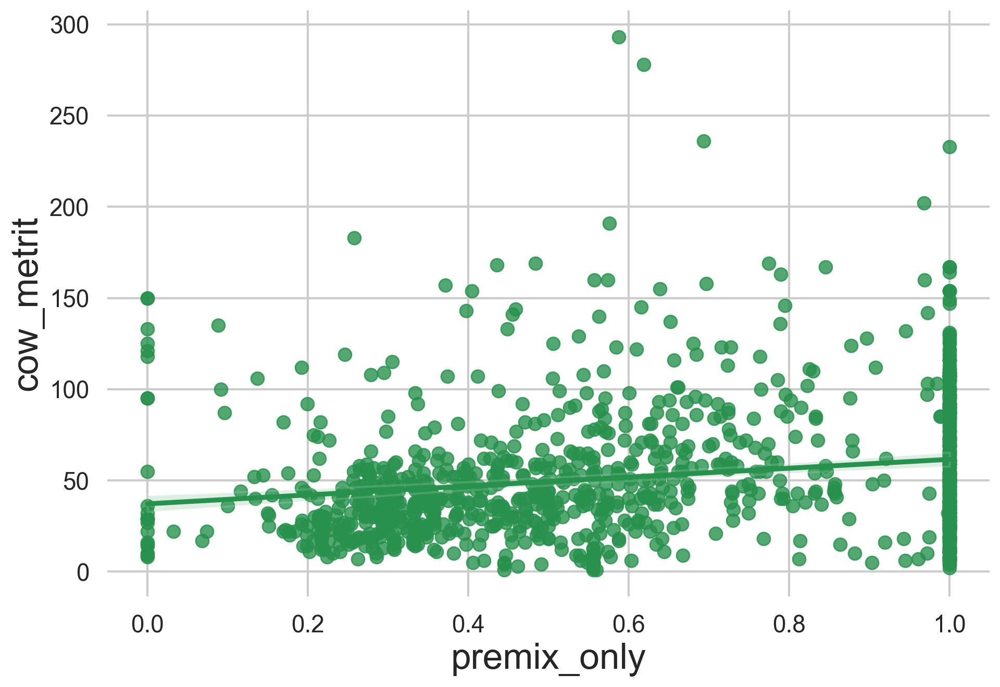

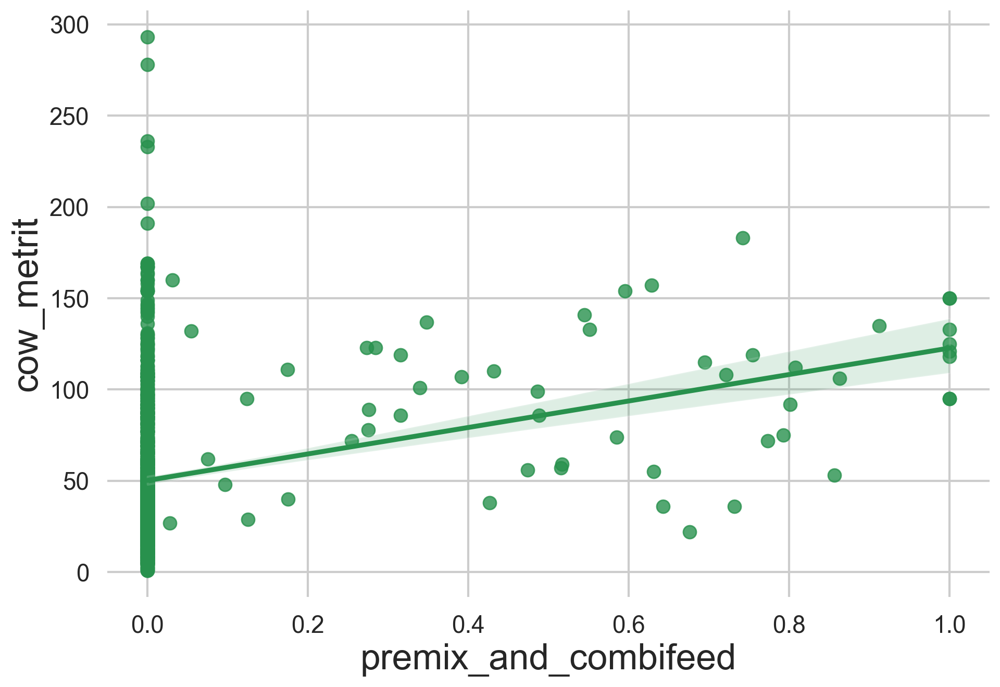

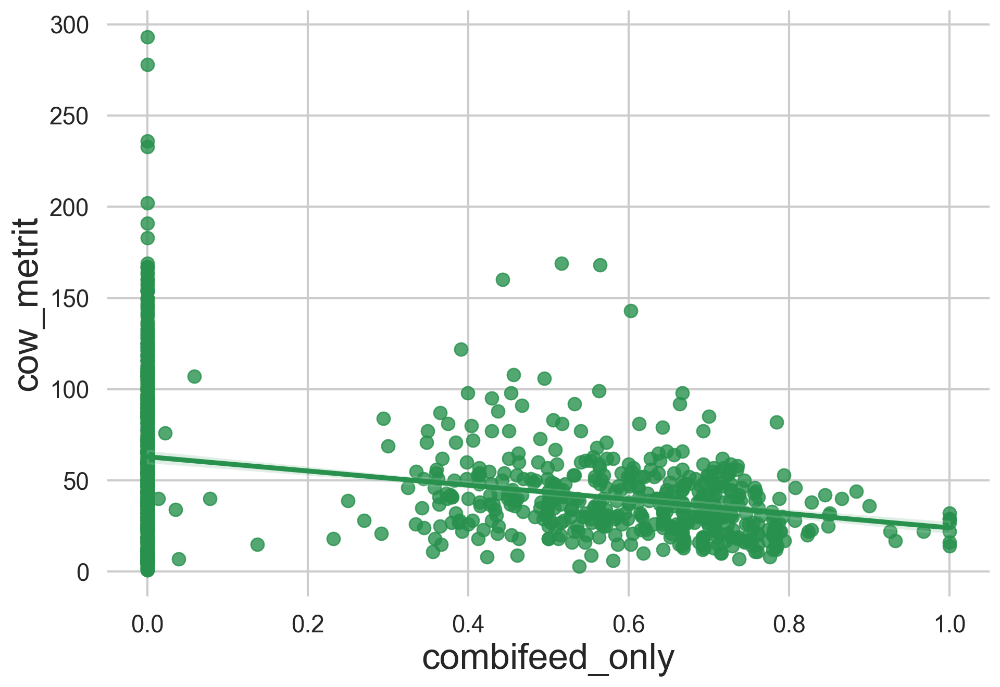

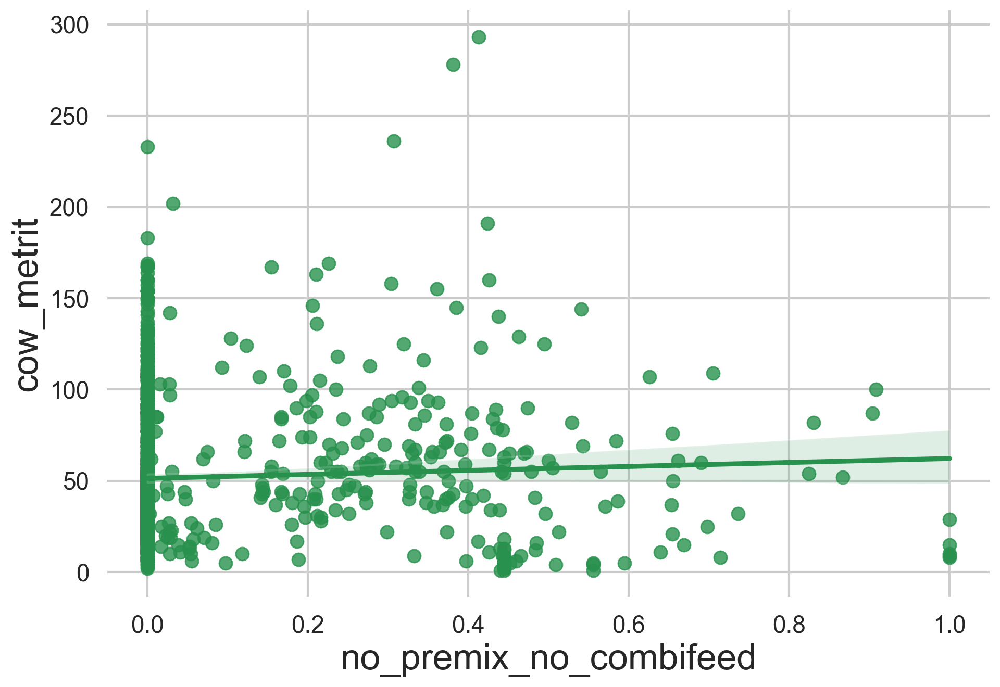

In [ ]:
from scipy.stats import spearmanr, pearsonr

for col in ration_cols:
    mask = ~merged_lag[col].isna() & ~merged_lag['cow_metrit'].isna()
    x = merged_lag[mask][col]
    y = merged_lag[mask]['cow_metrit']
    spear = spearmanr(x, y, nan_policy='omit')
    pear = pearsonr(x.dropna(), y.loc[x.notna()])

    print(f"{col}:")
    print(f"  Spearman r={spear.correlation:.4f}, p={spear.pvalue:.4f}")
    print(f"  Pearson  r={pear[0]:.4f}, p={pear[1]:.4f}")
    plt.subplots()
    sns.regplot(data=merged_lag[mask], x=col, y='cow_metrit')

In [ ]:
merged

,farm_name,year_month,combifeed_only,no_premix_no_combifeed,premix_and_combifeed,premix_only,cow_metrit
0,ЖК Авангард,2023-03,0.0,0.0,0.000000,1.000000,16.0
1,ЖК Авангард,2023-04,0.0,0.0,0.000000,1.000000,28.0
2,ЖК Авангард,2023-05,0.0,0.0,0.000000,1.000000,19.0
3,ЖК Авангард,2023-06,0.0,0.0,0.676030,0.323970,29.0
4,ЖК Авангард,2023-07,0.0,0.0,0.731707,0.268293,22.0
...,...,...,...,...,...,...,...
1519,ЭФ Родня,2025-06,0.0,1.0,0.000000,0.000000,NaN
1520,ЭФ Родня,2025-07,0.0,1.0,0.000000,0.000000,NaN
1521,ЭФ Родня,2025-08,0.0,1.0,0.000000,0.000000,NaN
1522,ЭФ Родня,2025-09,0.0,1.0,0.000000,0.000000,NaN


In [ ]:
metrit = herd_fad_s[['farm_name','year_month','cow_metrit', 'ls_occupancy']].drop_duplicates()

merged_2 = ration_pivot.merge(metrit, on=['farm_name','year_month'], how='left')
merged_2

,farm_name,year_month,combifeed_only,no_premix_no_combifeed,premix_and_combifeed,premix_only,year_month_shifted,cow_metrit,ls_occupancy
0,ЖК Авангард,2023-03,0.0,0.0,0.000000,1.000000,2023-04,16.0,103.0
1,ЖК Авангард,2023-04,0.0,0.0,0.000000,1.000000,2023-05,28.0,103.0
2,ЖК Авангард,2023-05,0.0,0.0,0.000000,1.000000,2023-06,19.0,103.0
3,ЖК Авангард,2023-06,0.0,0.0,0.676030,0.323970,2023-07,29.0,103.0
4,ЖК Авангард,2023-07,0.0,0.0,0.731707,0.268293,2023-08,22.0,103.0
...,...,...,...,...,...,...,...,...,...
1519,ЭФ Родня,2025-06,0.0,1.0,0.000000,0.000000,2025-07,NaN,NaN
1520,ЭФ Родня,2025-07,0.0,1.0,0.000000,0.000000,2025-08,NaN,NaN
1521,ЭФ Родня,2025-08,0.0,1.0,0.000000,0.000000,2025-09,NaN,NaN
1522,ЭФ Родня,2025-09,0.0,1.0,0.000000,0.000000,2025-10,NaN,NaN


In [ ]:
herd_fad_s

,FeedingTaskID,Date,farm_name,FeedNumber,SectionID,PhysiologicalGroupID,PhysiologicalGroupName,PhysiologicalGroupHeadCount,Appetite,RationName,RationPart,TotalWeight_kg,CompletedAt,year,PhysicalWeight_kg,ingredient_name,ingredient_group,year_month,ration_type,date,region,prod_farm_name,farm_type,ls_capacity,ls_occupancy,forage_cow,milk_cow,dry_cow,milk_marketab_prc,forcow_milk_yeild,forcow_milk_yeild_stand,milk_fat,milk_protein,somatic_cells,bac_contam,cow_retired,cow_lame,cow_mastits,calves,cow_metrit,ph_urine_avr
252,Farms/EkoNiva1C.216d4235-2852-11e8-80c4-1c98ec...,2022-01-01,ЖК Добрино,24,90,5,С1,24,1.0,С1,1.0,2228.0,2022-01-01T09:47:00.0000000,2022,142.699,сено луговое,Объёмные корма,2022-01,premix_only,2022-01-01,Воронеж,ЭНА Левый берег,ЖК,2800.0,104.964286,2939.0,2748.0,191.0,94.0,NaN,NaN,NaN,NaN,85.0,12.0,51.0,59.0,31,NaN,NaN,NaN
253,Farms/EkoNiva1C.216d4235-2852-11e8-80c4-1c98ec...,2022-01-01,ЖК Добрино,24,90,5,С1,24,1.0,С1,1.0,2228.0,2022-01-01T09:47:00.0000000,2022,263.445,люцерна сенаж,Объёмные корма,2022-01,premix_only,2022-01-01,Воронеж,ЭНА Левый берег,ЖК,2800.0,104.964286,2939.0,2748.0,191.0,94.0,NaN,NaN,NaN,NaN,85.0,12.0,51.0,59.0,31,NaN,NaN,NaN
254,Farms/EkoNiva1C.216d4235-2852-11e8-80c4-1c98ec...,2022-01-01,ЖК Добрино,24,90,5,С1,24,1.0,С1,1.0,2228.0,2022-01-01T09:47:00.0000000,2022,0.997,соль,Минералы/буферные,2022-01,premix_only,2022-01-01,Воронеж,ЭНА Левый берег,ЖК,2800.0,104.964286,2939.0,2748.0,191.0,94.0,NaN,NaN,NaN,NaN,85.0,12.0,51.0,59.0,31,NaN,NaN,NaN
255,Farms/EkoNiva1C.216d4235-2852-11e8-80c4-1c98ec...,2022-01-01,ЖК Добрино,24,90,5,С1,24,1.0,С1,1.0,2228.0,2022-01-01T09:47:00.0000000,2022,3.741,премикс дойный,"Премиксы, БАДы, дрожжи",2022-01,premix_only,2022-01-01,Воронеж,ЭНА Левый берег,ЖК,2800.0,104.964286,2939.0,2748.0,191.0,94.0,NaN,NaN,NaN,NaN,85.0,12.0,51.0,59.0,31,NaN,NaN,NaN
256,Farms/EkoNiva1C.216d4235-2852-11e8-80c4-1c98ec...,2022-01-01,ЖК Добрино,24,90,5,С1,24,1.0,С1,1.0,2228.0,2022-01-01T09:47:00.0000000,2022,206.041,кукуруза силос,Объёмные корма,2022-01,premix_only,2022-01-01,Воронеж,ЭНА Левый берег,ЖК,2800.0,104.964286,2939.0,2748.0,191.0,94.0,NaN,NaN,NaN,NaN,85.0,12.0,51.0,59.0,31,NaN,NaN,NaN
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
16411322,Farms/EkoNiva1C.6c69fe1b-2b6f-11e8-80c4-1c98ec...,2025-10-22,ЖК Подболотье,19,103,7,С1,37,1.4,С1,1.0,1601.0,2025-10-22T08:51:09.2068847,2025,189.343,солома (общ.),Объёмные корма,2025-10,premix_only,NaT,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN
16411323,Farms/EkoNiva1C.6c69fe1b-2b6f-11e8-80c4-1c98ec...,2025-10-22,ЖК Подболотье,19,103,7,С1,37,1.4,С1,1.0,1601.0,2025-10-22T08:51:09.2068847,2025,861.890,люцерна сенаж,Объёмные корма,2025-10,premix_only,NaT,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN
16411324,Farms/EkoNiva1C.6c69fe1b-2b6f-11e8-80c4-1c98ec...,2025-10-22,ЖК Подболотье,19,103,7,С1,37,1.4,С1,1.0,1601.0,2025-10-22T08:51:09.2068847,2025,57.560,жом свекловичный сухой,Жом и дробина,2025-10,premix_only,NaT,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN
16411325,Farms/EkoNiva1C.6c69fe1b-2b6f-11e8-80c4-1c98ec...,2025-10-22,ЖК Подболотье,19,103,7,С1,37,1.4,С1,1.0,1601.0,2025-10-22T08:51:09.2068847,2025,15.771,премикс молодняк 6-24,"Премиксы, БАДы, дрожжи",2025-10,premix_only,NaT,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN


In [ ]:
df_s = fad[fad['PhysiologicalGroupName'].isin(suhostoy)]
df_s['SectionID'].nunique()

443

<Axes: xlabel='SectionID', ylabel='Count'>

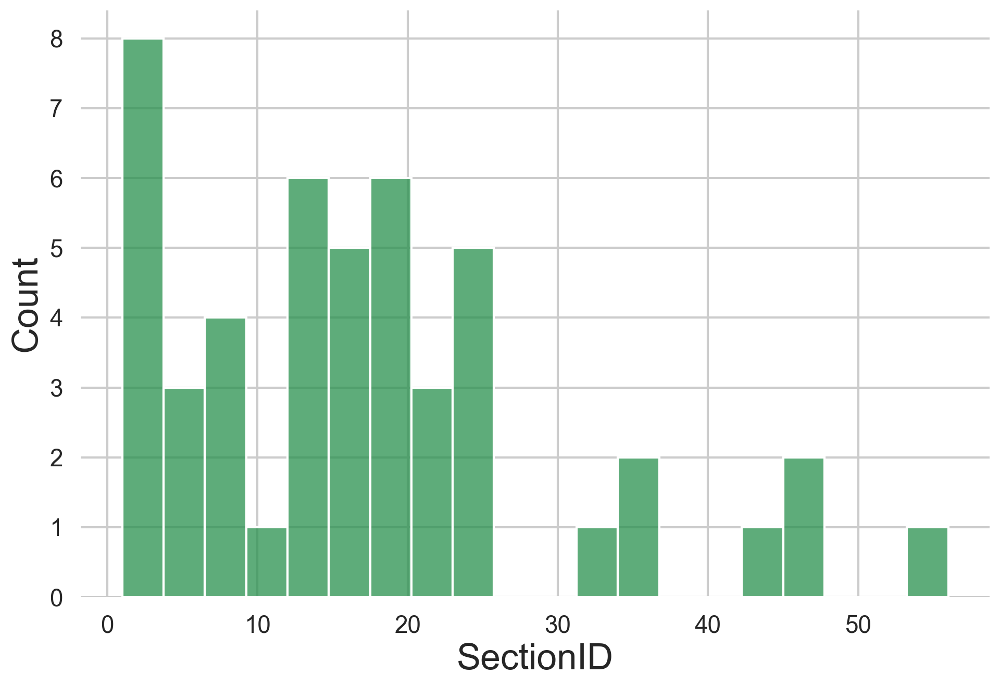

In [ ]:
sns.histplot(df_s.groupby('farm_name')['SectionID'].nunique().reset_index(), x='SectionID', bins=20)

In [ ]:
df_s.groupby(['farm_name','SectionID','ration_type']).size().head(20)

farm_name    SectionID  ration_type           
ЖК Авангард  9          premix_and_combifeed        880
                        premix_only               10186
             11         premix_only                4505
ЖК Аристово  16         no_premix_no_combifeed      890
             106        premix_only                   8
             132        premix_only                 184
             133        no_premix_no_combifeed       90
                        premix_only                 218
             134        premix_only                   5
             135        premix_only                1380
             136        premix_only                  60
             140        no_premix_no_combifeed        4
                        premix_only                  75
             144        no_premix_no_combifeed      100
ЖК Бобров    363        premix_only                 950
             374        premix_only                 245
             406        combifeed_only             6341
 

In [ ]:
[[1,1], [2,2], [3,3], [4,4], [5,5]]*30

[[1, 1],
 [2, 2],
 [3, 3],
 [4, 4],
 [5, 5],
 [1, 1],
 [2, 2],
 [3, 3],
 [4, 4],
 [5, 5],
 [1, 1],
 [2, 2],
 [3, 3],
 [4, 4],
 [5, 5],
 [1, 1],
 [2, 2],
 [3, 3],
 [4, 4],
 [5, 5],
 [1, 1],
 [2, 2],
 [3, 3],
 [4, 4],
 [5, 5],
 [1, 1],
 [2, 2],
 [3, 3],
 [4, 4],
 [5, 5],
 [1, 1],
 [2, 2],
 [3, 3],
 [4, 4],
 [5, 5],
 [1, 1],
 [2, 2],
 [3, 3],
 [4, 4],
 [5, 5],
 [1, 1],
 [2, 2],
 [3, 3],
 [4, 4],
 [5, 5],
 [1, 1],
 [2, 2],
 [3, 3],
 [4, 4],
 [5, 5],
 [1, 1],
 [2, 2],
 [3, 3],
 [4, 4],
 [5, 5],
 [1, 1],
 [2, 2],
 [3, 3],
 [4, 4],
 [5, 5],
 [1, 1],
 [2, 2],
 [3, 3],
 [4, 4],
 [5, 5],
 [1, 1],
 [2, 2],
 [3, 3],
 [4, 4],
 [5, 5],
 [1, 1],
 [2, 2],
 [3, 3],
 [4, 4],
 [5, 5],
 [1, 1],
 [2, 2],
 [3, 3],
 [4, 4],
 [5, 5],
 [1, 1],
 [2, 2],
 [3, 3],
 [4, 4],
 [5, 5],
 [1, 1],
 [2, 2],
 [3, 3],
 [4, 4],
 [5, 5],
 [1, 1],
 [2, 2],
 [3, 3],
 [4, 4],
 [5, 5],
 [1, 1],
 [2, 2],
 [3, 3],
 [4, 4],
 [5, 5],
 [1, 1],
 [2, 2],
 [3, 3],
 [4, 4],
 [5, 5],
 [1, 1],
 [2, 2],
 [3, 3],
 [4, 4],
 [5, 5],
 [1, 1],
 

In [ ]:
d = pd.DataFrame()
for i in range(30):
    d[i] = [[1,1], [2,2], [3,3], [4,4], [5,5]]
d

,0,1,2,3,4,5,6,7,8,9,10,11,12,13,14,15,16,17,18,19,20,21,22,23,24,25,26,27,28,29
0,"[1, 1]","[1, 1]","[1, 1]","[1, 1]","[1, 1]","[1, 1]","[1, 1]","[1, 1]","[1, 1]","[1, 1]","[1, 1]","[1, 1]","[1, 1]","[1, 1]","[1, 1]","[1, 1]","[1, 1]","[1, 1]","[1, 1]","[1, 1]","[1, 1]","[1, 1]","[1, 1]","[1, 1]","[1, 1]","[1, 1]","[1, 1]","[1, 1]","[1, 1]","[1, 1]"
1,"[2, 2]","[2, 2]","[2, 2]","[2, 2]","[2, 2]","[2, 2]","[2, 2]","[2, 2]","[2, 2]","[2, 2]","[2, 2]","[2, 2]","[2, 2]","[2, 2]","[2, 2]","[2, 2]","[2, 2]","[2, 2]","[2, 2]","[2, 2]","[2, 2]","[2, 2]","[2, 2]","[2, 2]","[2, 2]","[2, 2]","[2, 2]","[2, 2]","[2, 2]","[2, 2]"
2,"[3, 3]","[3, 3]","[3, 3]","[3, 3]","[3, 3]","[3, 3]","[3, 3]","[3, 3]","[3, 3]","[3, 3]","[3, 3]","[3, 3]","[3, 3]","[3, 3]","[3, 3]","[3, 3]","[3, 3]","[3, 3]","[3, 3]","[3, 3]","[3, 3]","[3, 3]","[3, 3]","[3, 3]","[3, 3]","[3, 3]","[3, 3]","[3, 3]","[3, 3]","[3, 3]"
3,"[4, 4]","[4, 4]","[4, 4]","[4, 4]","[4, 4]","[4, 4]","[4, 4]","[4, 4]","[4, 4]","[4, 4]","[4, 4]","[4, 4]","[4, 4]","[4, 4]","[4, 4]","[4, 4]","[4, 4]","[4, 4]","[4, 4]","[4, 4]","[4, 4]","[4, 4]","[4, 4]","[4, 4]","[4, 4]","[4, 4]","[4, 4]","[4, 4]","[4, 4]","[4, 4]"
4,"[5, 5]","[5, 5]","[5, 5]","[5, 5]","[5, 5]","[5, 5]","[5, 5]","[5, 5]","[5, 5]","[5, 5]","[5, 5]","[5, 5]","[5, 5]","[5, 5]","[5, 5]","[5, 5]","[5, 5]","[5, 5]","[5, 5]","[5, 5]","[5, 5]","[5, 5]","[5, 5]","[5, 5]","[5, 5]","[5, 5]","[5, 5]","[5, 5]","[5, 5]","[5, 5]"


In [ ]:
import pymannkendall as mk
import numpy as np

result = mk.multivariate_test(d.values)
print(result)

ValueError: setting an array element with a sequence.

In [ ]:
d = pd.DataFrame(columns= ['date', '1', '2', '3', '4', '5'])
for col in d.columns:
    v = np.random.randint(0, 5)
    d[col] = np.array([v]*30)
d['date'] = np.array(range(30))

In [ ]:
d

,date,1,2,3,4,5
0,0,3,0,4,0,0
1,1,3,0,4,0,0
2,2,3,0,4,0,0
3,3,3,0,4,0,0
4,4,3,0,4,0,0
5,5,3,0,4,0,0
6,6,3,0,4,0,0
7,7,3,0,4,0,0
8,8,3,0,4,0,0
9,9,3,0,4,0,0


In [ ]:
mk.multivariate_test(d.values)


Multivariate_Mann_Kendall_Test(trend='increasing', h=np.True_, p=np.float64(9.769962616701378e-15), z=np.float64(7.743007455519685), Tau=np.float64(0.16666666666666666), s=np.float64(435.0), var_s=np.float64(3141.6666666666665), slope=np.float64(0.0), intercept=np.float64(0.0))

In [ ]:
import numpy as np
import pymannkendall as mk

# X — массив формы (30, 5)
X = np.random.rand(30, 5)

result = mk.multivariate_test(X)
result

Multivariate_Mann_Kendall_Test(trend='no trend', h=np.False_, p=np.float64(0.8606612078442617), z=np.float64(-0.1755325356950476), Tau=np.float64(-0.010574712643678161), s=np.float64(-23.0), var_s=15708.333333333332, slope=np.float64(-0.00044153721175193823), intercept=np.float64(0.42115928810287034))

In [ ]:
X

array([[0.73848376, 0.33653226, 0.21315376, 0.23449013, 0.57040873],
       [0.04103721, 0.25297743, 0.6526586 , 0.28015179, 0.29475355],
       [0.75690325, 0.27193377, 0.21136272, 0.346874  , 0.65106726],
       [0.64371047, 0.57818778, 0.06930532, 0.02560551, 0.67146834],
       [0.98708195, 0.2755624 , 0.49179512, 0.66480548, 0.1640298 ],
       [0.45467449, 0.62957762, 0.31253779, 0.32203148, 0.2116134 ],
       [0.42562249, 0.43006554, 0.17420315, 0.81788634, 0.44017253],
       [0.06148261, 0.69642967, 0.69956413, 0.25336938, 0.56064003],
       [0.0316985 , 0.03184203, 0.20786158, 0.61254011, 0.56892805],
       [0.45818674, 0.40119905, 0.41019888, 0.07387314, 0.61977476],
       [0.82879544, 0.8999003 , 0.56334316, 0.65921954, 0.381736  ],
       [0.02790317, 0.77801751, 0.86396617, 0.00717389, 0.82677183],
       [0.40757771, 0.22723086, 0.56170356, 0.42281552, 0.53201795],
       [0.88966034, 0.11751659, 0.01662055, 0.9486665 , 0.18022252],
       [0.80419162, 0.35729358, 0.

In [ ]:
df = pd.DataFrame({
    "year_month": ["2023-01", "2023-02", "2023-03"],
    "metrit_cow": [90, 120, 150]
})

In [ ]:
def get_time_row_metrit(df):
    df["year_month"] = pd.to_datetime(df["year_month"], format="%Y-%m")
    df["days_in_month"] = df["year_month"].dt.days_in_month
    df["metrit_per_day"] = df["metrit_cow"] / df["days_in_month"]

    daily_rows = []

    for _, row in df.iterrows():
        start = row["year_month"]
        end = start + pd.offsets.MonthEnd(0)
        dates = pd.date_range(start=start, end=end, freq="D")
        
        for d in dates:
            daily_rows.append({
                "date": d,
                "metrit_cow_daily": row["metrit_per_day"]
            })

    return pd.DataFrame(daily_rows)

get_time_row_metrit(df)

,date,metrit_cow_daily
0,2023-01-01,2.903226
1,2023-01-02,2.903226
2,2023-01-03,2.903226
3,2023-01-04,2.903226
4,2023-01-05,2.903226
...,...,...
85,2023-03-27,4.838710
86,2023-03-28,4.838710
87,2023-03-29,4.838710
88,2023-03-30,4.838710


In [ ]:
def make_windows(df, win=60, total=90):
    df = df.sort_values("date")
    windows = []
    for i in range(total - win + 1):
        win_df = df.iloc[i:i+win]
        windows.append(win_df)
    return windows

def window_to_vector(win_df):
    means = win_df[["1","2","3","4","5"]].mean().values
    stds = win_df[["1","2","3","4","5"]].std().values
    return np.concatenate([means, stds])

In [ ]:
windows = make_windows(df)

X = np.vstack([window_to_vector(w) for w in windows])
result = mk.multivariate_test(X)
print(result)

KeyError: 'date'

In [ ]:
from hyppo.ksample import KSample

def make_rolling_windows(df, win_size=60, horizon_days=90):
    df = df.copy()
    df["date"] = pd.to_datetime(df["date"])
    df = df.sort_values("date").reset_index(drop=True)

    if horizon_days is not None:
        df = df.iloc[:horizon_days].reset_index(drop=True)

    n = len(df)
    if n < win_size:
        raise ValueError(f"Слишком мало данных: {n} строк при окне {win_size}")

    windows = []
    n_windows = n - win_size + 1
    for start in range(n_windows):
        win_df = df.iloc[start:start + win_size]
        windows.append(win_df)

    return windows

def analyze_nutrition_windows(
    df,
    metrics_cols=("1", "2", "3", "4", "5"),
    win_size=60,
    horizon_days=90,
    alpha=0.05,
):

    windows = make_rolling_windows(df, win_size=win_size, horizon_days=horizon_days)
    samples = [w[list(metrics_cols)].to_numpy() for w in windows]
    stat, p_value = KSample(indep_test="Dcorr").test(*samples)

    is_stable = p_value > alpha
    mean_nutrition = None
    if is_stable:
        df_sorted = df.copy()
        df_sorted["date"] = pd.to_datetime(df_sorted["date"])
        df_sorted = df_sorted.sort_values("date").reset_index(drop=True)
        if horizon_days is not None:
            df_sorted = df_sorted.iloc[:horizon_days]
        mean_nutrition = df_sorted[list(metrics_cols)].mean()

    return {
        "is_stable": is_stable,
        "p_value": p_value,
        "statistic": stat,
        "mean_nutrition": mean_nutrition,
    }




def get_time_row_metrit(df_monthly):
    df = df_monthly.copy()
    df["year_month"] = pd.to_datetime(df["year_month"], format="%Y-%m")
    df["days_in_month"] = df["year_month"].dt.days_in_month
    df["metrit_per_day"] = df["metrit_cow"] / df["days_in_month"]

    rows = []
    for _, row in df.iterrows():
        start = row["year_month"]
        end = start + pd.offsets.MonthEnd(0)
        dates = pd.date_range(start=start, end=end, freq="D")
        for d in dates:
            rows.append({
                "date": d,
                "metrit_cow_daily": row["metrit_per_day"],
            })

    daily_df = pd.DataFrame(rows)
    return daily_df



## ЗДЕСЬ МЯСО &darr; &darr; &darr;

In [13]:
import numpy as np
import pandas as pd
import pymannkendall as mk


def build_metrit_ration_lagged(
    df,
    ration_feature_cols,
    lookback_days=60,
    alpha=0.05,
    min_days_in_window=50,
):
    """
    df: DataFrame с колонками:
        - 'date' (datetime или str)
        - 'farm_name'
        - 'cow_metrit_per_day'
        - фичи рациона (ration_feature_cols)

    ration_feature_cols: список колонок, описывающих питание
        (например: ['calories', 'protein', 'calcium', 'sugar', 'water'])

    lookback_days: сколько дней назад брать для окна (обычно 60).
                   Окно для дня T: (T - lookback_days, T), то есть
                   предыдущие lookback_days, не включая сам день T.

    alpha: уровень значимости для multivariate Mann–Kendall.

    min_days_in_window: минимальное количество дней, которое должно быть
                        в окне, чтобы считать его валидным (на случай пропусков).

    Возвращает два DataFrame:
        - good_rows_df: строки, где рацион за последние lookback_days стабилен.
          Каждая строка:
              farm_name
              date                 – день метритов
              cow_metrit_per_day   – метриты в этот день
              window_start_date    – начало окна (T - lookback_days)
              window_end_date      – конец окна (T - 1 день)
              mean_<feature>       – среднее питание за окно

        - windows_log_df: лог всех рассмотренных окон, по каждой ферме и дате:
              farm_name
              date_T               – день метритов
              window_start_date
              window_end_date
              n_days_in_window
              is_stable
              p_value
              trend
    """

    df = df.copy()
    df["date"] = pd.to_datetime(df["date"])

    good_rows = []
    windows_log = []

    # Идём по фермам отдельно
    for farm, farm_df in df.groupby("farm_name"):
        farm_df = farm_df.sort_values("date").reset_index(drop=True)

        # Чтобы не бегать по индексам, удобно иметь Series для быстрого доступа
        dates = farm_df["date"].values

        for idx in range(len(farm_df)):
            date_T = dates[idx]

            # окно: (T - lookback_days, T), T не включаем
            window_start = date_T - pd.Timedelta(days=lookback_days)
            window_end = date_T - pd.Timedelta(days=1)

            # выбираем все дни корма, попавшие в это окно
            mask = (farm_df["date"] >= window_start) & (farm_df["date"] <= window_end)
            win_df = farm_df.loc[mask]

            n_win = len(win_df)
            if n_win < min_days_in_window:
                # слишком мало точек — логируем, но как "невалидное"/нестабильное окно
                windows_log.append({
                    "farm_name": farm,
                    "date_T": date_T,
                    "window_start_date": window_start,
                    "window_end_date": window_end,
                    "n_days_in_window": n_win,
                    "is_stable": False,
                    "p_value": np.nan,
                    "trend": "insufficient_data",
                })
                continue

            # матрица X: (n_win, n_features)
            X = win_df[list(ration_feature_cols)].to_numpy()

            # multivariate Mann–Kendall по окну
            mk_result = mk.multivariate_test(X, alpha=alpha)
            # mk_result.h == False → нет тренда → СТАБИЛЬНО
            p_value = mk_result.p
            is_stable = p_value > alpha
            trend = mk_result.trend  # 'increasing' / 'decreasing' / 'no trend'

            # логируем окно
            windows_log.append({
                "farm_name": farm,
                "date_T": date_T,
                "window_start_date": window_start,
                "window_end_date": window_end,
                "n_days_in_window": n_win,
                "is_stable": is_stable,
                "p_value": p_value,
                "trend": trend,
            })

            if not is_stable:
                continue  # рацион в этом окне не считаем стабильным

            # Если рацион стабилен: считаем среднее питание за окно
            mean_nutrition = win_df[list(ration_feature_cols)].mean()

            # берём метриты в день T
            cow_metrit_T = farm_df.loc[idx, "cow_metrit_per_day"]

            row_dict = {
                "farm_name": farm,
                "date": date_T,
                "cow_metrit_per_day": cow_metrit_T,
                "window_start_date": window_start,
                "window_end_date": window_end,
            }
            # добавляем mean_<feature>
            for col in ration_feature_cols:
                row_dict[f"mean_{col}"] = mean_nutrition[col]

            good_rows.append(row_dict)

    good_rows_df = pd.DataFrame(good_rows)
    windows_log_df = pd.DataFrame(windows_log)

    return good_rows_df, windows_log_df

In [14]:
def get_time_row_metrit_by_farm(df_monthly):
    df = df_monthly.copy()
    df["year_month"] = pd.to_datetime(df["year_month"], format="%Y-%m", errors="coerce")
    df["days_in_month"] = df["year_month"].dt.days_in_month
    df["metrit_per_day"] = 0.0
    mask = df["cow_metrit"] > 0
    valid_mask = mask & (df["calves"] > 0)

    df.loc[valid_mask, "metrit_per_day"] = (
        df.loc[valid_mask, "cow_metrit"] /
        df.loc[valid_mask, "days_in_month"] /
        df.loc[valid_mask, "calves"]
    )
    error_mask = mask & (df["calves"] == 0)
    if error_mask.any():
        print("WARNING: Есть строки cow_metrit>0 и calves=0 — это логическая ошибка в данных:")
        print(df.loc[error_mask, ["farm_name", "year_month", "cow_metrit", "calves"]])
    rows = []
    for _, row in df.iterrows():
        farm = row["farm_name"]
        start = row["year_month"]
        end = start + pd.offsets.MonthEnd(0)
        dates = pd.date_range(start=start, end=end, freq="D")

        for d in dates:
            rows.append({
                "farm_name": farm,
                "date": d,
                "cow_metrit_per_day": row["metrit_per_day"],
            })

    daily_df = pd.DataFrame(rows)
    daily_df.replace([np.inf, -np.inf], 0.0, inplace=True)
    daily_df["cow_metrit_per_day"] = daily_df["cow_metrit_per_day"].fillna(0.0)

    return daily_df

In [15]:
herd_metrics = herd_metrics[~((herd_metrics['calves']==0) & (herd_metrics['cow_metrit']!=0))]

In [16]:
metrit_daily = get_time_row_metrit_by_farm(herd_metrics)

In [17]:
df = pd.read_csv("datasets/FeedingPreLast.csv", index_col=0).rename(columns={"Date": "date"})
df["date"] = pd.to_datetime(df["date"])
df

,date,farm_name,Белковые корма,Жидкости,Жиры и глюкозогенные добавки,Жом и дробина,Кальциесодержащие,Комбикорма и стартеры,Минералы/буферные,Объёмные корма,Остатки,Энергетические и крахмалистые корма
0,2022-01-05,ЖК Добрино,2.029072,1.823163,0.0,0.000000,0.295665,0.000000,0.251922,27.385651,0.0,1.063867
1,2022-01-05,ЖК Коршево,0.709130,3.684383,0.0,0.000000,0.063687,2.019473,0.218880,30.028700,0.0,0.000000
2,2022-01-06,ЖК Добрино,2.269377,1.811687,0.0,0.000000,0.294141,0.000000,0.249424,27.324712,0.0,0.885715
3,2022-01-06,ЖК Коршево,0.825975,3.716895,0.0,0.000000,0.063617,1.982343,0.218610,30.772119,0.0,0.000000
4,2022-01-07,ЖК Добрино,1.720963,1.624439,0.0,0.000000,0.274031,0.000000,0.217664,27.792455,0.0,0.706280
...,...,...,...,...,...,...,...,...,...,...,...,...
44778,2025-10-26,ЖК Семено-Макарово,3.000000,0.000000,0.0,1.250000,0.187000,0.000000,0.000000,40.085714,0.0,0.000000
44779,2025-10-26,ЖК Старая Чигла,0.000000,0.000000,0.0,0.000000,0.347881,0.000000,0.000000,41.940299,0.0,0.000000
44780,2025-10-26,ЖК Старое Резяпкино,1.412407,0.000000,0.0,2.344736,0.191114,0.778193,0.000000,31.115036,0.0,0.000000
44781,2025-10-26,ЖК Уланово,0.000000,5.157159,0.0,0.000000,0.000000,0.000000,0.000000,20.304945,0.0,0.000000


In [18]:
df_all = pd.merge(df, metrit_daily, on=['date', 'farm_name'], how='inner')

In [19]:
df_all.columns

Index(['date', 'farm_name', 'Белковые корма', 'Жидкости',
       'Жиры и глюкозогенные добавки', 'Жом и дробина', 'Кальциесодержащие',
       'Комбикорма и стартеры', 'Минералы/буферные', 'Объёмные корма',
       'Остатки', 'Энергетические и крахмалистые корма', 'cow_metrit_per_day'],
      dtype='object')

In [20]:
ration_cols = df_all.columns[2:-1]
ration_cols

Index(['Белковые корма', 'Жидкости', 'Жиры и глюкозогенные добавки',
       'Жом и дробина', 'Кальциесодержащие', 'Комбикорма и стартеры',
       'Минералы/буферные', 'Объёмные корма', 'Остатки',
       'Энергетические и крахмалистые корма'],
      dtype='object')

In [21]:
df_all

,date,farm_name,Белковые корма,Жидкости,Жиры и глюкозогенные добавки,Жом и дробина,Кальциесодержащие,Комбикорма и стартеры,Минералы/буферные,Объёмные корма,Остатки,Энергетические и крахмалистые корма,cow_metrit_per_day
0,2022-01-05,ЖК Добрино,2.029072,1.823163,0.0,0.000000,0.295665,0.000000,0.251922,27.385651,0.0,1.063867,0.000000
1,2022-01-05,ЖК Коршево,0.709130,3.684383,0.0,0.000000,0.063687,2.019473,0.218880,30.028700,0.0,0.000000,0.000000
2,2022-01-06,ЖК Добрино,2.269377,1.811687,0.0,0.000000,0.294141,0.000000,0.249424,27.324712,0.0,0.885715,0.000000
3,2022-01-06,ЖК Коршево,0.825975,3.716895,0.0,0.000000,0.063617,1.982343,0.218610,30.772119,0.0,0.000000,0.000000
4,2022-01-07,ЖК Добрино,1.720963,1.624439,0.0,0.000000,0.274031,0.000000,0.217664,27.792455,0.0,0.706280,0.000000
...,...,...,...,...,...,...,...,...,...,...,...,...,...
38232,2025-07-31,ЖК Уланово,2.695925,2.136448,0.0,0.000000,0.178473,0.000000,0.000000,30.562282,0.0,0.000000,0.006847
38233,2025-07-31,ЖК Шацк,2.838828,3.260073,0.0,2.875458,0.368566,0.000000,0.186480,27.628205,0.0,0.000000,0.005540
38234,2025-07-31,ЖК Щучье,1.783465,0.000000,0.0,0.000000,0.093343,1.389764,0.000000,23.090551,0.0,0.000000,0.005657
38235,2025-07-31,МТФ Каширинское,0.000000,0.000000,0.0,0.888889,0.055556,0.000000,0.277778,20.888889,0.0,0.000000,0.003147


In [22]:
df_all.columns

Index(['date', 'farm_name', 'Белковые корма', 'Жидкости',
       'Жиры и глюкозогенные добавки', 'Жом и дробина', 'Кальциесодержащие',
       'Комбикорма и стартеры', 'Минералы/буферные', 'Объёмные корма',
       'Остатки', 'Энергетические и крахмалистые корма', 'cow_metrit_per_day'],
      dtype='object')

In [23]:
# допустим у тебя есть df со столбцами:
# ['date', 'farm_name', 'cow_metrit_per_day', 'calories', 'protein', 'calcium', 'sugar', 'water']

ration_cols = df_all.columns[2:-1]

good_df, log_df = build_metrit_ration_lagged(
    df_all,
    ration_feature_cols=ration_cols,
    lookback_days=60,
    alpha=0.05,
    min_days_in_window=50,
)

# good_df: готовый датасет "метриты в день T" + "среднее питание за последние 60 дней при стабильном рационе"
# log_df: подробный лог, для каких дней окно было стабильным / нестабильным, p-value, тренд и т.п.

In [34]:
good_df

,farm_name,date,cow_metrit_per_day,window_start_date,window_end_date,mean_Белковые корма,mean_Жидкости,mean_Жиры и глюкозогенные добавки,mean_Жом и дробина,mean_Кальциесодержащие,mean_Комбикорма и стартеры,mean_Минералы/буферные,mean_Объёмные корма,mean_Остатки,mean_Энергетические и крахмалистые корма
0,ЖК Авангард,2023-05-23,0.004608,2023-03-24,2023-05-22,1.701370,0.060922,0.0,0.366876,0.320727,0.0,0.159730,33.070578,0.0,0.328861
1,ЖК Авангард,2023-05-24,0.004608,2023-03-25,2023-05-23,1.698964,0.059728,0.0,0.372589,0.322944,0.0,0.159712,33.060957,0.0,0.330739
2,ЖК Авангард,2023-05-25,0.004608,2023-03-26,2023-05-24,1.695586,0.058579,0.0,0.377218,0.324857,0.0,0.159462,33.058741,0.0,0.331988
3,ЖК Авангард,2023-05-26,0.004608,2023-03-27,2023-05-25,1.695219,0.057474,0.0,0.381444,0.326727,0.0,0.159252,33.059961,0.0,0.332764
4,ЖК Авангард,2023-05-27,0.004608,2023-03-28,2023-05-26,1.692787,0.056409,0.0,0.385640,0.328527,0.0,0.159050,33.061400,0.0,0.333037
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
10633,МТФ Щучье,2025-06-08,0.003986,2025-04-09,2025-06-07,1.283420,0.000000,0.0,0.000000,0.249906,0.0,0.000000,24.123020,0.0,0.000000
10634,МТФ Щучье,2025-06-09,0.003986,2025-04-10,2025-06-08,1.291621,0.000000,0.0,0.000000,0.250192,0.0,0.000000,24.074737,0.0,0.000000
10635,МТФ Щучье,2025-07-29,0.005424,2025-05-30,2025-07-28,1.629038,0.000000,0.0,0.000000,0.263112,0.0,0.000000,25.545218,0.0,0.000000
10636,МТФ Щучье,2025-07-30,0.005424,2025-05-31,2025-07-29,1.646821,0.000000,0.0,0.000000,0.262999,0.0,0.000000,25.486669,0.0,0.000000


<Axes: xlabel='mean_Кальциесодержащие', ylabel='Count'>

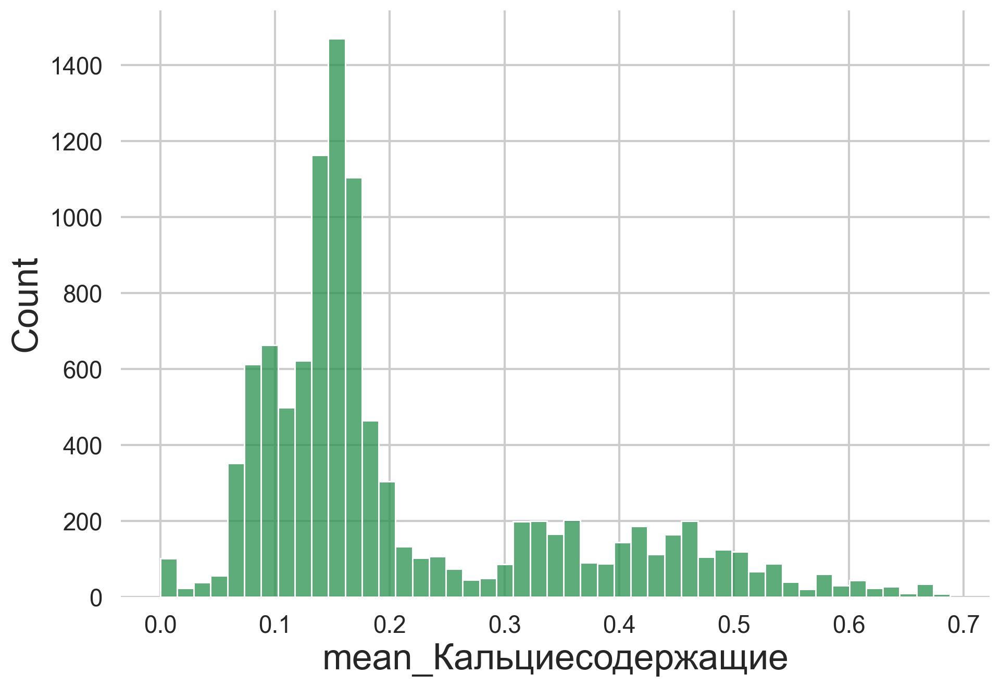

In [38]:
sns.histplot(good_df, x="mean_Кальциесодержащие")

In [39]:
over_ca = good_df[good_df["mean_Кальциесодержащие"] > 0.3]
over_ca

,farm_name,date,cow_metrit_per_day,window_start_date,window_end_date,mean_Белковые корма,mean_Жидкости,mean_Жиры и глюкозогенные добавки,mean_Жом и дробина,mean_Кальциесодержащие,mean_Комбикорма и стартеры,mean_Минералы/буферные,mean_Объёмные корма,mean_Остатки,mean_Энергетические и крахмалистые корма
0,ЖК Авангард,2023-05-23,0.004608,2023-03-24,2023-05-22,1.701370,0.060922,0.0,0.366876,0.320727,0.0,0.159730,33.070578,0.0,0.328861
1,ЖК Авангард,2023-05-24,0.004608,2023-03-25,2023-05-23,1.698964,0.059728,0.0,0.372589,0.322944,0.0,0.159712,33.060957,0.0,0.330739
2,ЖК Авангард,2023-05-25,0.004608,2023-03-26,2023-05-24,1.695586,0.058579,0.0,0.377218,0.324857,0.0,0.159462,33.058741,0.0,0.331988
3,ЖК Авангард,2023-05-26,0.004608,2023-03-27,2023-05-25,1.695219,0.057474,0.0,0.381444,0.326727,0.0,0.159252,33.059961,0.0,0.332764
4,ЖК Авангард,2023-05-27,0.004608,2023-03-28,2023-05-26,1.692787,0.056409,0.0,0.385640,0.328527,0.0,0.159050,33.061400,0.0,0.333037
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
9705,ЖК Шацк,2025-06-28,0.005444,2025-04-29,2025-06-27,2.614247,1.872487,0.0,2.913084,0.363970,0.0,0.151770,29.068928,0.0,0.000000
9706,ЖК Шацк,2025-06-29,0.005444,2025-04-30,2025-06-28,2.615265,1.882343,0.0,2.916042,0.364277,0.0,0.151850,29.018078,0.0,0.000000
9707,ЖК Шацк,2025-06-30,0.005444,2025-05-01,2025-06-29,2.638212,1.891994,0.0,2.919143,0.364736,0.0,0.151959,28.982404,0.0,0.000000
9708,ЖК Шацк,2025-07-01,0.005540,2025-05-02,2025-06-30,2.636053,1.893598,0.0,2.925234,0.365153,0.0,0.151188,28.946247,0.0,0.000000


In [ ]:
new_ration_cols = ['mean_' + ration for ration in ration_cols]

In [ ]:
def prepare_good_df_for_logreg(good_df, new_ration_cols):
    df = good_df.copy()
    y = df["cow_metrit_per_day"]
    X = df[new_ration_cols].copy()
    mask = (
        np.isfinite(y) &
        np.all(np.isfinite(X), axis=1)
    )

    df = df.loc[mask].copy()
    X = X.loc[mask]
    y = y.loc[mask]

    X = sm.add_constant(X, has_constant="add")

    return X, y, df

In [ ]:
def fit_binomial_glm_from_good_df(good_df, new_ration_cols):
    X, y, df_used = prepare_good_df_for_logreg(good_df, new_ration_cols)
    model = sm.GLM(y, X, family=sm.families.Binomial()).fit()

    return model, df_used

In [ ]:
model, df_used = fit_binomial_glm_from_good_df(good_df, new_new_ration_cols)
print(model.summary())

odds_ratios = np.exp(model.params).sort_values(ascending=False)
pvals = model.pvalues

result = pd.DataFrame({
    "coef": model.params,
    "odds_ratio": odds_ratios,
    "p_value": pvals
}).sort_values("p_value")

display(result)

In [25]:
good_df

,farm_name,date,cow_metrit_per_day,window_start_date,window_end_date,mean_Белковые корма,mean_Жидкости,mean_Жиры и глюкозогенные добавки,mean_Жом и дробина,mean_Кальциесодержащие,mean_Комбикорма и стартеры,mean_Минералы/буферные,mean_Объёмные корма,mean_Остатки,mean_Энергетические и крахмалистые корма
0,ЖК Авангард,2023-05-23,0.004608,2023-03-24,2023-05-22,1.701370,0.060922,0.0,0.366876,0.320727,0.0,0.159730,33.070578,0.0,0.328861
1,ЖК Авангард,2023-05-24,0.004608,2023-03-25,2023-05-23,1.698964,0.059728,0.0,0.372589,0.322944,0.0,0.159712,33.060957,0.0,0.330739
2,ЖК Авангард,2023-05-25,0.004608,2023-03-26,2023-05-24,1.695586,0.058579,0.0,0.377218,0.324857,0.0,0.159462,33.058741,0.0,0.331988
3,ЖК Авангард,2023-05-26,0.004608,2023-03-27,2023-05-25,1.695219,0.057474,0.0,0.381444,0.326727,0.0,0.159252,33.059961,0.0,0.332764
4,ЖК Авангард,2023-05-27,0.004608,2023-03-28,2023-05-26,1.692787,0.056409,0.0,0.385640,0.328527,0.0,0.159050,33.061400,0.0,0.333037
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
10633,МТФ Щучье,2025-06-08,0.003986,2025-04-09,2025-06-07,1.283420,0.000000,0.0,0.000000,0.249906,0.0,0.000000,24.123020,0.0,0.000000
10634,МТФ Щучье,2025-06-09,0.003986,2025-04-10,2025-06-08,1.291621,0.000000,0.0,0.000000,0.250192,0.0,0.000000,24.074737,0.0,0.000000
10635,МТФ Щучье,2025-07-29,0.005424,2025-05-30,2025-07-28,1.629038,0.000000,0.0,0.000000,0.263112,0.0,0.000000,25.545218,0.0,0.000000
10636,МТФ Щучье,2025-07-30,0.005424,2025-05-31,2025-07-29,1.646821,0.000000,0.0,0.000000,0.262999,0.0,0.000000,25.486669,0.0,0.000000


In [15]:
log_df['is_stable'].sum() / log_df.shape[0]

np.float64(0.278212202840181)

In [26]:
new_ration_cols = ['mean_' + ration for ration in ration_cols]

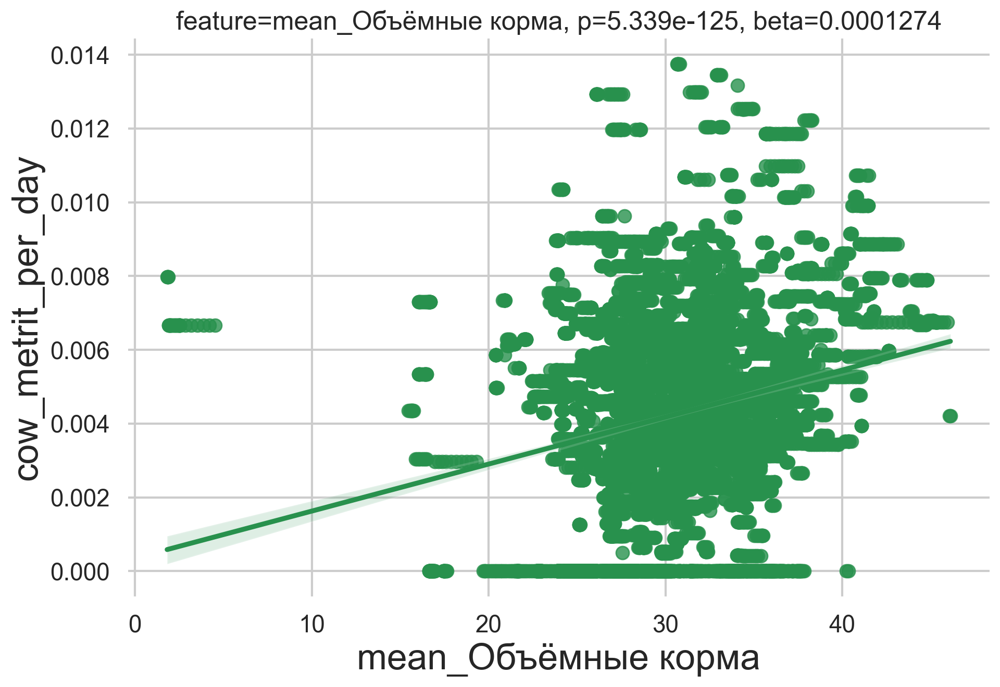

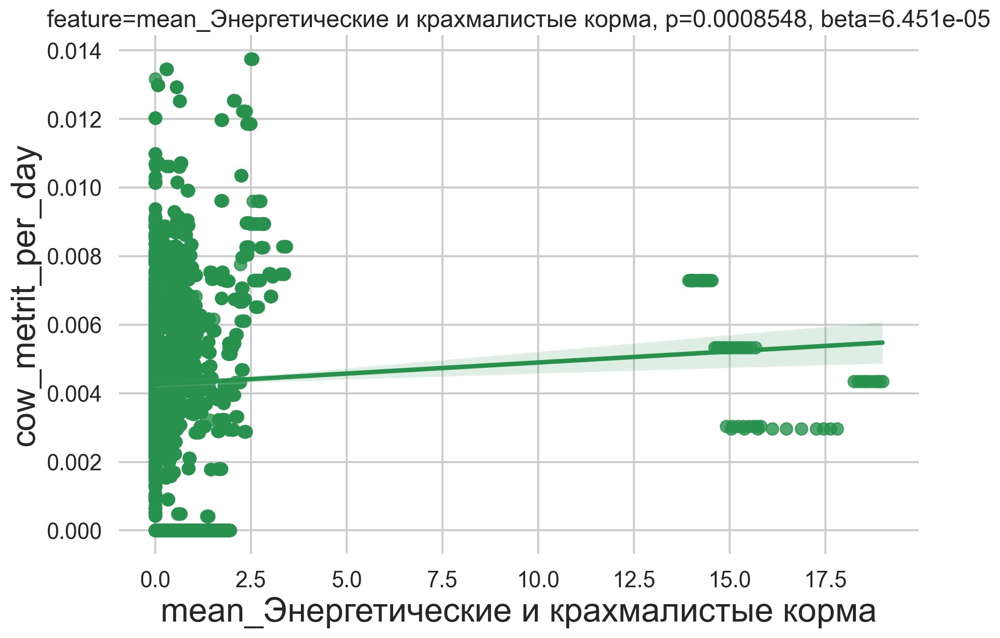

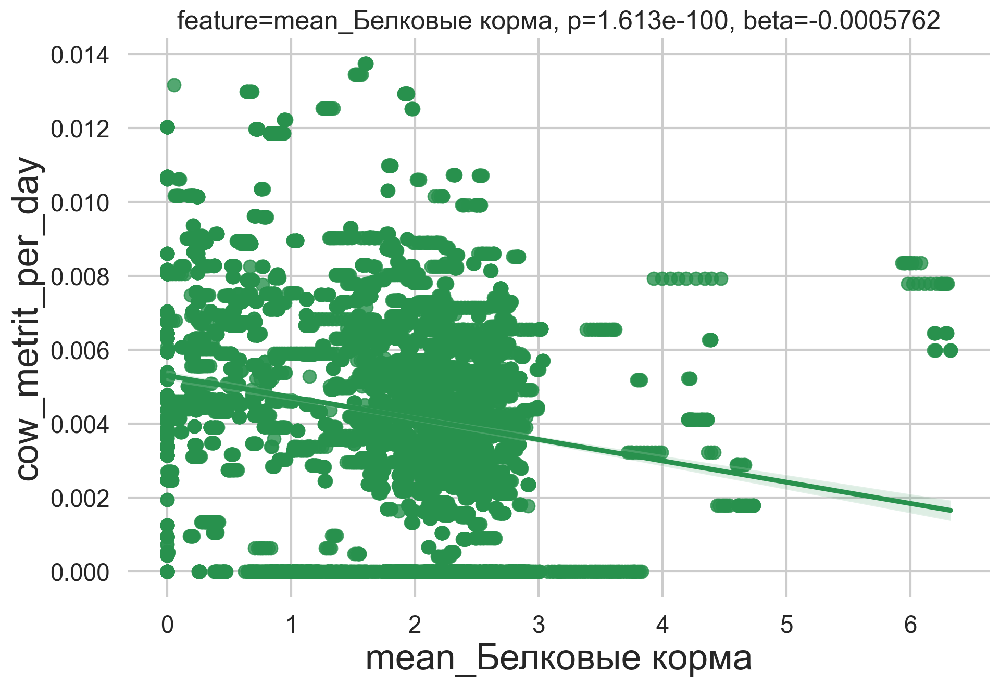

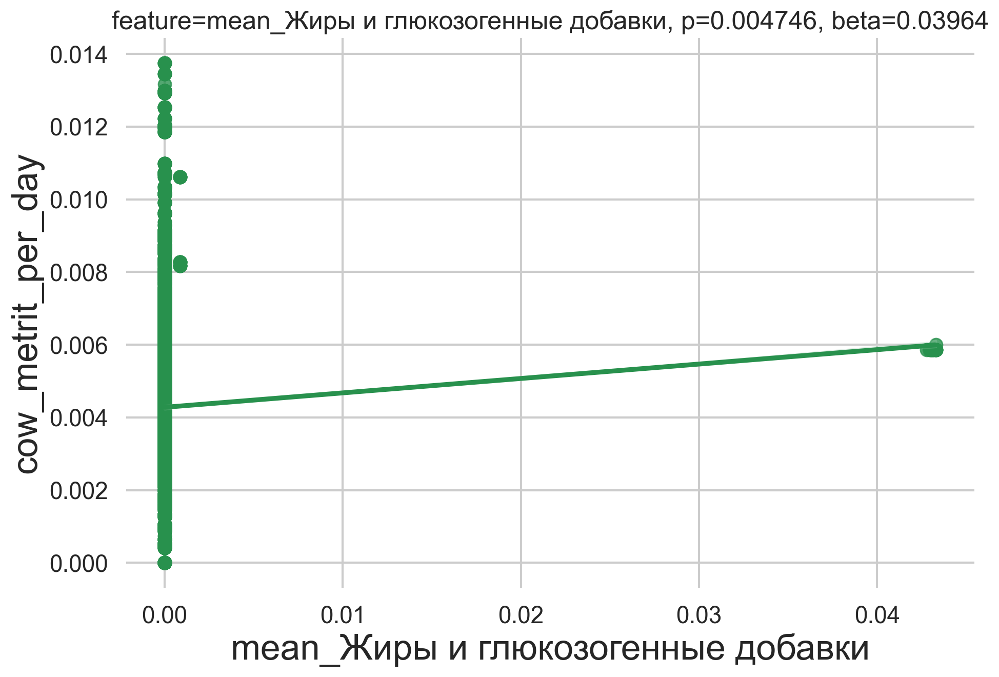

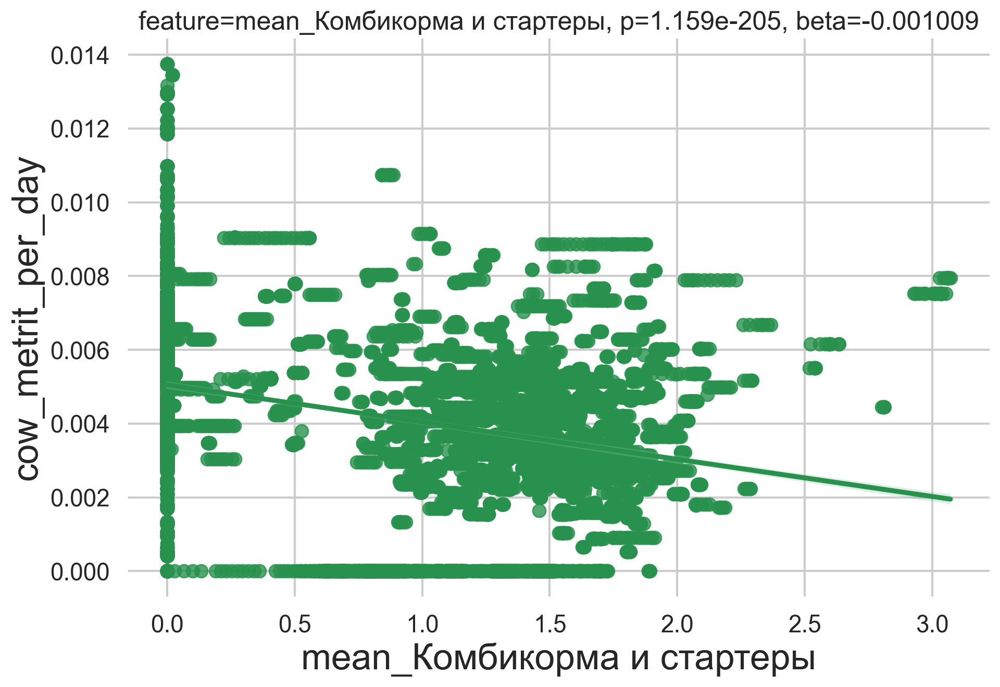

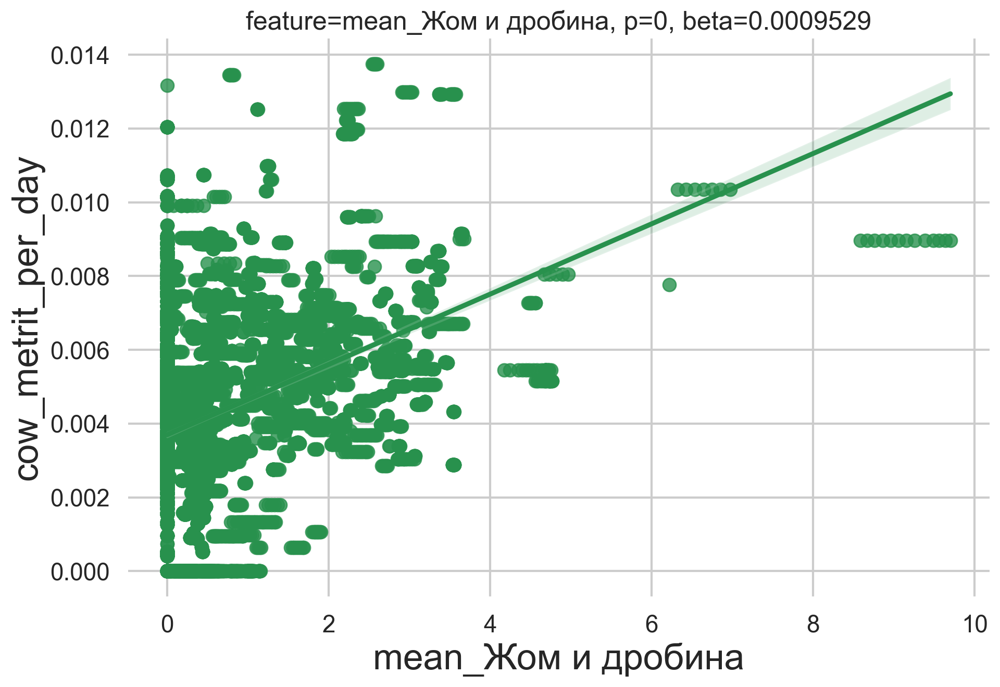

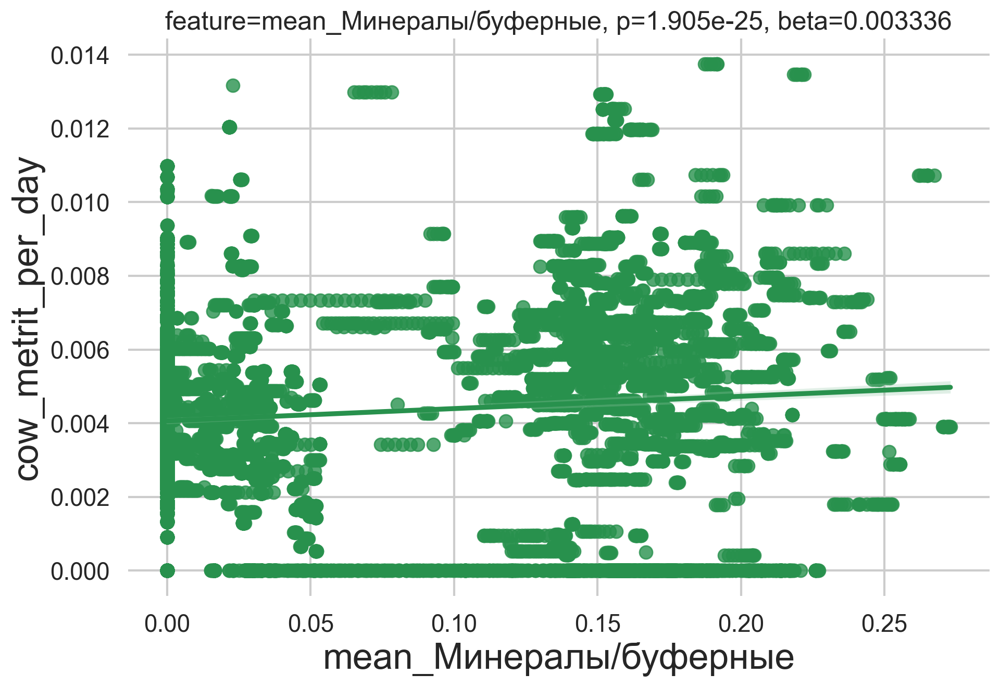

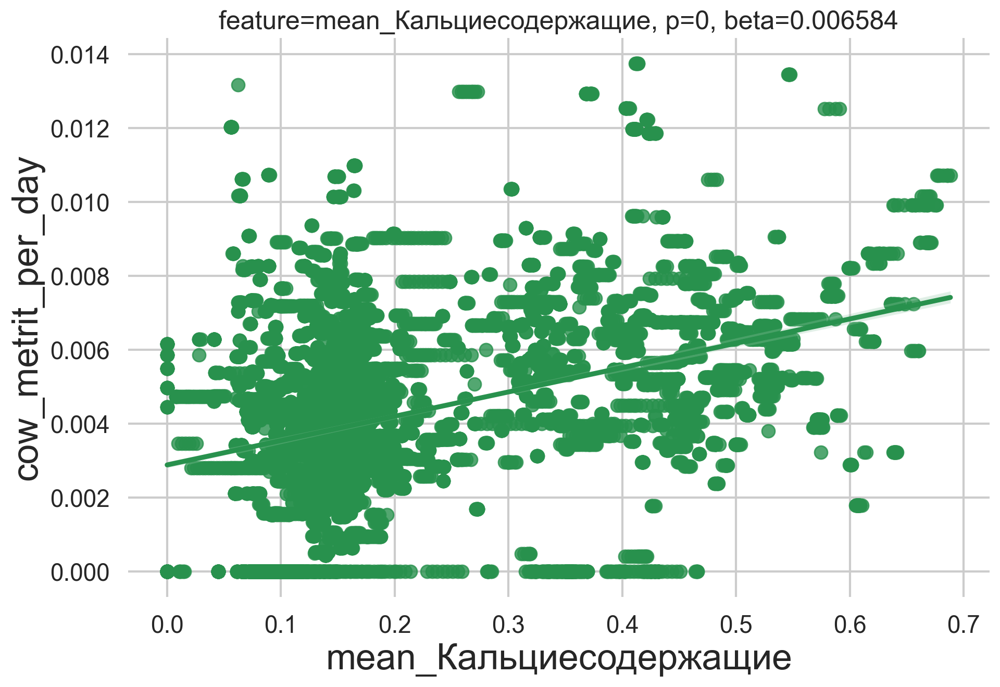

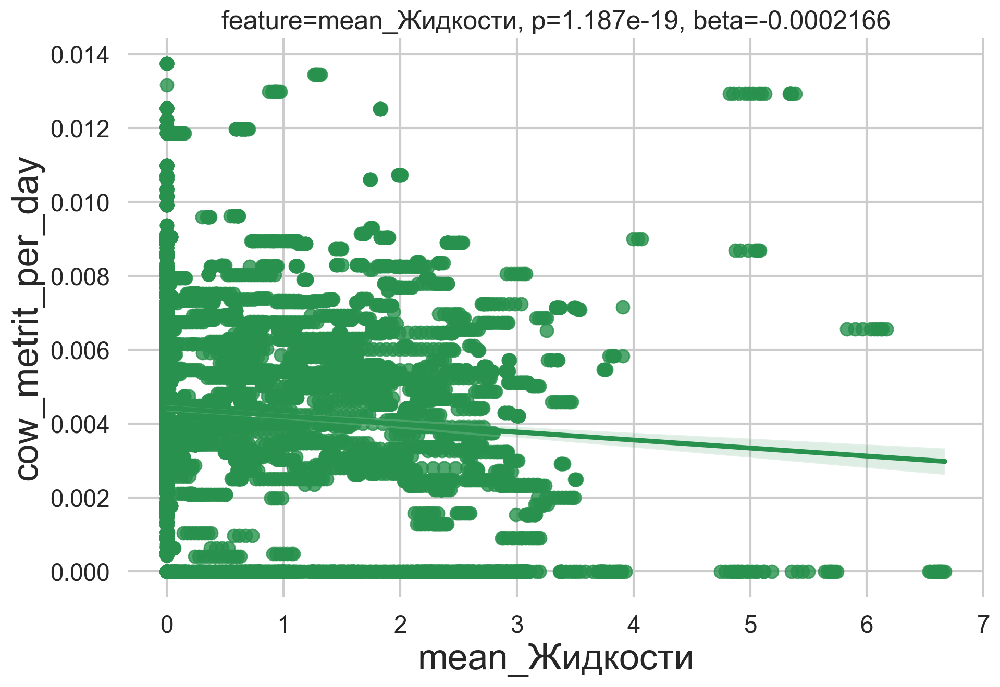

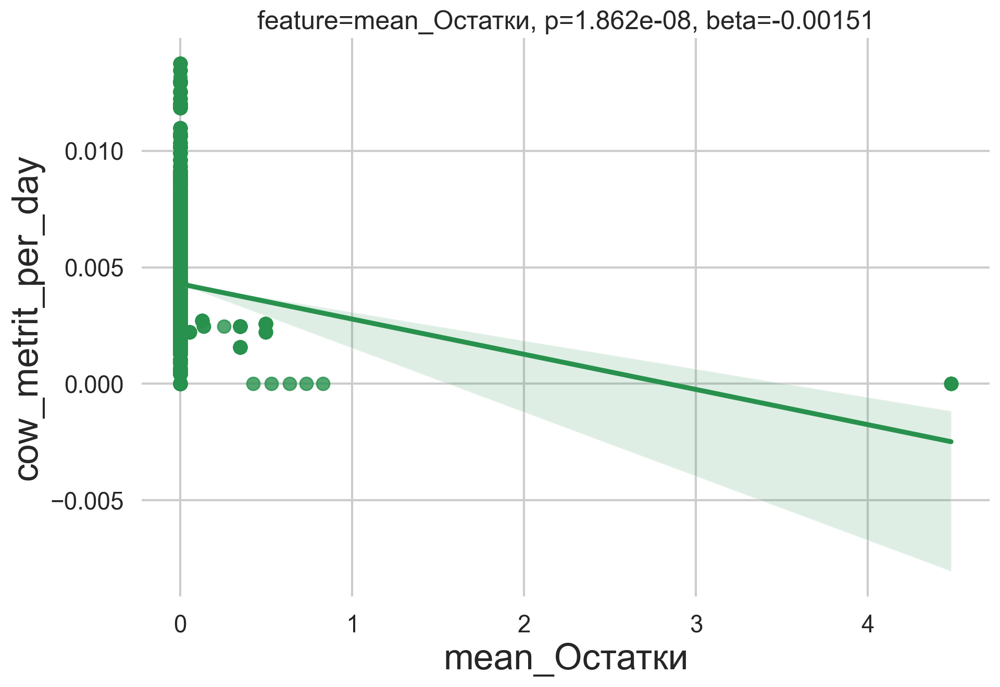

In [18]:
for feature in new_ration_cols:
    plt.subplots()
    mask = good_df[feature].notna() & good_df['cow_metrit_per_day'].notna()
    
    res = sm.OLS(
        good_df.loc[mask, 'cow_metrit_per_day'],
        sm.add_constant(good_df.loc[mask, feature])
    ).fit()
    
    sns.regplot(data=good_df[mask], x=feature, y='cow_metrit_per_day')
    
    title_text = f"feature={feature}, p={res.pvalues[feature]:.4g}, beta={res.params[feature]:.4g}"
    plt.title(title_text, fontsize=18)

In [20]:
good_df['cow_metrit_per_day'].isna().sum()

np.int64(0)

In [22]:
good_df[(~good_df['cow_metrit_per_day'].isna()) & (~good_df[new_ration_cols].isna())]

,farm_name,date,cow_metrit_per_day,window_start_date,window_end_date,mean_Объёмные корма,mean_Энергетические и крахмалистые корма,mean_Белковые корма,mean_Жиры и глюкозогенные добавки,mean_Комбикорма и стартеры,mean_Жом и дробина,mean_Минералы/буферные,mean_Кальциесодержащие,mean_Жидкости,mean_Остатки
0,NaN,NaT,NaN,NaT,NaT,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN
1,NaN,NaT,NaN,NaT,NaT,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN
2,NaN,NaT,NaN,NaT,NaT,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN
3,NaN,NaT,NaN,NaT,NaT,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN
4,NaN,NaT,NaN,NaT,NaT,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
10633,NaN,NaT,NaN,NaT,NaT,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN
10634,NaN,NaT,NaN,NaT,NaT,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN
10635,NaN,NaT,NaN,NaT,NaT,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN
10636,NaN,NaT,NaN,NaT,NaT,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN


In [24]:
good_df

,farm_name,date,cow_metrit_per_day,window_start_date,window_end_date,mean_Объёмные корма,mean_Энергетические и крахмалистые корма,mean_Белковые корма,mean_Жиры и глюкозогенные добавки,mean_Комбикорма и стартеры,mean_Жом и дробина,mean_Минералы/буферные,mean_Кальциесодержащие,mean_Жидкости,mean_Остатки
0,ЖК Авангард,2023-05-23,0.004608,2023-03-24,2023-05-22,33.070578,0.328861,1.701370,0.0,0.0,0.366876,0.159730,0.320727,0.060922,0.0
1,ЖК Авангард,2023-05-24,0.004608,2023-03-25,2023-05-23,33.060957,0.330739,1.698964,0.0,0.0,0.372589,0.159712,0.322944,0.059728,0.0
2,ЖК Авангард,2023-05-25,0.004608,2023-03-26,2023-05-24,33.058741,0.331988,1.695586,0.0,0.0,0.377218,0.159462,0.324857,0.058579,0.0
3,ЖК Авангард,2023-05-26,0.004608,2023-03-27,2023-05-25,33.059961,0.332764,1.695219,0.0,0.0,0.381444,0.159252,0.326727,0.057474,0.0
4,ЖК Авангард,2023-05-27,0.004608,2023-03-28,2023-05-26,33.061400,0.333037,1.692787,0.0,0.0,0.385640,0.159050,0.328527,0.056409,0.0
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
10633,МТФ Щучье,2025-06-08,0.003986,2025-04-09,2025-06-07,24.123020,0.000000,1.283420,0.0,0.0,0.000000,0.000000,0.249906,0.000000,0.0
10634,МТФ Щучье,2025-06-09,0.003986,2025-04-10,2025-06-08,24.074737,0.000000,1.291621,0.0,0.0,0.000000,0.000000,0.250192,0.000000,0.0
10635,МТФ Щучье,2025-07-29,0.005424,2025-05-30,2025-07-28,25.545218,0.000000,1.629038,0.0,0.0,0.000000,0.000000,0.263112,0.000000,0.0
10636,МТФ Щучье,2025-07-30,0.005424,2025-05-31,2025-07-29,25.486669,0.000000,1.646821,0.0,0.0,0.000000,0.000000,0.262999,0.000000,0.0


In [25]:
gg = good_df[good_df['cow_metrit_per_day'].notna()]
gg = gg[gg[new_ration_cols].notna()]
sum(gg[new_ration_cols].isna().sum())

0

In [26]:
dg = good_df[good_df['cow_metrit_per_day'].notna()].copy()
for col in new_ration_cols:
    dg = dg[dg[col].notna()]

In [27]:
mask = good_df['cow_metrit_per_day'].notna() & good_df[new_ration_cols].notna().all(axis=1)
gs = good_df[mask]

In [28]:
for col in dg.columns:
    print(col, '-->', dg[col].isna().sum(), 'nans')
    print(col, '-->', dg[col].isin([np.inf, -np.inf]).sum(), 'infs', '\n---------')

farm_name --> 0 nans
farm_name --> 0 infs 
---------
date --> 0 nans
date --> 0 infs 
---------
cow_metrit_per_day --> 0 nans
cow_metrit_per_day --> 0 infs 
---------
window_start_date --> 0 nans
window_start_date --> 0 infs 
---------
window_end_date --> 0 nans
window_end_date --> 0 infs 
---------
mean_Объёмные корма --> 0 nans
mean_Объёмные корма --> 0 infs 
---------
mean_Энергетические и крахмалистые корма --> 0 nans
mean_Энергетические и крахмалистые корма --> 0 infs 
---------
mean_Белковые корма --> 0 nans
mean_Белковые корма --> 0 infs 
---------
mean_Жиры и глюкозогенные добавки --> 0 nans
mean_Жиры и глюкозогенные добавки --> 0 infs 
---------
mean_Комбикорма и стартеры --> 0 nans
mean_Комбикорма и стартеры --> 0 infs 
---------
mean_Жом и дробина --> 0 nans
mean_Жом и дробина --> 0 infs 
---------
mean_Минералы/буферные --> 0 nans
mean_Минералы/буферные --> 0 infs 
---------
mean_Кальциесодержащие --> 0 nans
mean_Кальциесодержащие --> 0 infs 
---------
mean_Жидкости --> 0 n

In [30]:
print(sm.OLS(dg['cow_metrit_per_day'], sm.add_constant(dg[new_ration_cols])).fit().summary())

                            OLS Regression Results                            
Dep. Variable:     cow_metrit_per_day   R-squared:                       0.299
Model:                            OLS   Adj. R-squared:                  0.298
Method:                 Least Squares   F-statistic:                     453.4
Date:                 Пт, 12 дек 2025   Prob (F-statistic):               0.00
Time:                        04:42:23   Log-Likelihood:                 50246.
No. Observations:               10638   AIC:                        -1.005e+05
Df Residuals:                   10627   BIC:                        -1.004e+05
Df Model:                          10                                         
Covariance Type:            nonrobust                                         
                                               coef    std err          t      P>|t|      [0.025      0.975]
-----------------------------------------------------------------------------------------------------

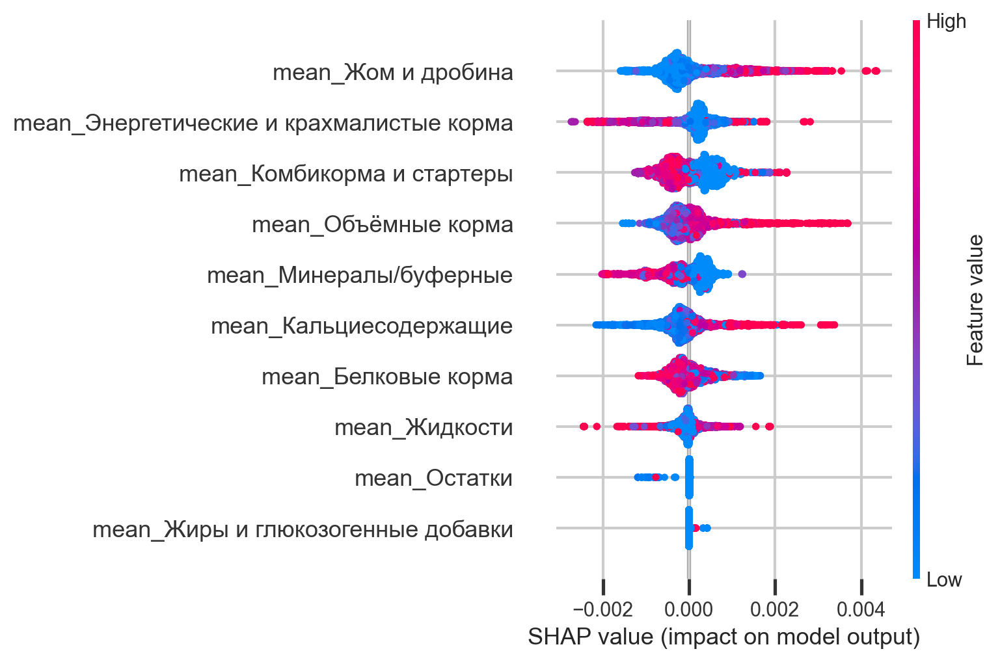

ValueError: Could not find feature named: feature_name

In [32]:
import xgboost as xgb
import shap
X = dg[new_ration_cols]
y = dg['cow_metrit_per_day']
model = xgb.XGBRegressor()
model.fit(X, y)

explainer = shap.TreeExplainer(model)
sh_values = explainer.shap_values(X)

shap.summary_plot(sh_values, X)
shap.dependence_plot("feature_name", sh_values, X)

In [33]:
from pygam import LinearGAM, s

gam = LinearGAM(s(0) + s(1) + s(2)).fit(X, y)
gam.summary()

LinearGAM                                                                                                 
=============================================== ==========================================================
Distribution:                        NormalDist Effective DoF:                                     34.1349
Link Function:                     IdentityLink Log Likelihood:                           -1070061244.9154
Number of Samples:                        10638 AIC:                                       2140122560.1006
                                                AICc:                                      2140122560.3401
                                                GCV:                                                   0.0
                                                Scale:                                                 0.0
                                                Pseudo R-Squared:                                   0.2512
Feature Function                  Lam

In [ ]:
from sklearn.ensemble import RandomForestRegressor
import pandas as pd

rf = RandomForestRegressor(n_estimators=500, random_state=42)
rf.fit(X, y)

importances = pd.Series(rf.feature_importances_, index=new_ration_cols).sort_values(ascending=False)
print(importances)

from sklearn.inspection import permutation_importance

result = permutation_importance(rf, X, y, n_repeats=10, random_state=42)
perm_importance = pd.Series(result.importances_mean, index=new_ration_cols).sort_values(ascending=False)
print(perm_importance)

mean_Премиксы, БАДы, дрожжи                 0.221261
mean_Энергетические и крахмалистые корма    0.167558
mean_Белковые корма                         0.137111
mean_Комбикорма и стартеры                  0.132414
mean_Объёмные корма                         0.120128
mean_Минералы/буферные                      0.090224
mean_Жом и дробина                          0.067405
mean_Жидкости                               0.062643
mean_Жиры и глюкозогенные добавки           0.000632
mean_Остатки                                0.000625
dtype: float64
mean_Премиксы, БАДы, дрожжи                 0.641050
mean_Энергетические и крахмалистые корма    0.460165
mean_Комбикорма и стартеры                  0.410943
mean_Белковые корма                         0.315873
mean_Минералы/буферные                      0.297812
mean_Объёмные корма                         0.268585
mean_Жом и дробина                          0.147442
mean_Жидкости                               0.131014
mean_Жиры и глюкозогенные добав

In [34]:
import statsmodels.api as sm
import pandas as pd

target_col = 'cow_metrit_per_day'

# 1. Собираем всё в один датафрейм и выкидываем NaN
data = good_df[[target_col] + new_ration_cols].copy()
data = data.dropna()

# 2. y и X после dropna — индексы уже точно совпадают
y = data[target_col]
X = data[new_ration_cols]

# 3. Убираем один рацион, чтобы не было идеальной коллинеарности
# (так как доли в сумме дают 1, + константа = линейная зависимость)
# уберём, например, последний
X = X.drop(columns=[X.columns[-1]])

# 4. Добавляем константу
X = sm.add_constant(X)

# 5. Строим модель
model = sm.OLS(y, X).fit()
print(model.summary())

                            OLS Regression Results                            
Dep. Variable:     cow_metrit_per_day   R-squared:                       0.298
Model:                            OLS   Adj. R-squared:                  0.297
Method:                 Least Squares   F-statistic:                     500.4
Date:                 Пт, 12 дек 2025   Prob (F-statistic):               0.00
Time:                        04:45:48   Log-Likelihood:                 50235.
No. Observations:               10638   AIC:                        -1.005e+05
Df Residuals:                   10628   BIC:                        -1.004e+05
Df Model:                           9                                         
Covariance Type:            nonrobust                                         
                                               coef    std err          t      P>|t|      [0.025      0.975]
-----------------------------------------------------------------------------------------------------

In [35]:
print("n_obs, n_params:", X.shape[0], X.shape[1])
print("var y:", y.var())

n_obs, n_params: 10638 10
var y: 6.596032710856392e-06


In [36]:
good_df.dtypes

farm_name                                           object
date                                        datetime64[ns]
cow_metrit_per_day                                 float64
window_start_date                           datetime64[ns]
window_end_date                             datetime64[ns]
mean_Объёмные корма                                float64
mean_Энергетические и крахмалистые корма           float64
mean_Белковые корма                                float64
mean_Жиры и глюкозогенные добавки                  float64
mean_Комбикорма и стартеры                         float64
mean_Жом и дробина                                 float64
mean_Минералы/буферные                             float64
mean_Кальциесодержащие                             float64
mean_Жидкости                                      float64
mean_Остатки                                       float64
dtype: object

In [37]:
import numpy as np
import pandas as pd
import statsmodels.api as sm

target_col = 'cow_metrit_per_day'

# 1. Собираем целевую + признаки
cols = [target_col] + new_ration_cols
data = good_df[cols].copy()

# 2. Насильно приводим всё к числам
data = data.apply(pd.to_numeric, errors='coerce')

# 3. Убираем все строки, где есть NaN
data = data.dropna()

# 4. Разделяем на y и X
y = data[target_col].astype(float)
X = data[new_ration_cols]

# 5. Убираем один рацион (если это доли, сумма=1 → убираем мультиколлинеарность)
X = X.drop(columns=[X.columns[-1]])

# 6. Добавляем константу
X = sm.add_constant(X)

print("n_obs, n_params:", X.shape[0], X.shape[1])
print("var y:", y.var())

# 7. Строим модель
model = sm.OLS(y, X).fit()
print(model.summary())

n_obs, n_params: 10638 10
var y: 6.596032710856392e-06
                            OLS Regression Results                            
Dep. Variable:     cow_metrit_per_day   R-squared:                       0.298
Model:                            OLS   Adj. R-squared:                  0.297
Method:                 Least Squares   F-statistic:                     500.4
Date:                 Пт, 12 дек 2025   Prob (F-statistic):               0.00
Time:                        04:45:57   Log-Likelihood:                 50235.
No. Observations:               10638   AIC:                        -1.005e+05
Df Residuals:                   10628   BIC:                        -1.004e+05
Df Model:                           9                                         
Covariance Type:            nonrobust                                         
                                               coef    std err          t      P>|t|      [0.025      0.975]
----------------------------------------------

In [38]:
good_df['cow_metrit_per_day'].head(20)


0     0.004608
1     0.004608
2     0.004608
3     0.004608
4     0.004608
5     0.004608
6     0.004608
7     0.004608
8     0.004608
9     0.005894
10    0.005894
11    0.005336
12    0.005336
13    0.005336
14    0.005336
15    0.005336
16    0.005336
17    0.005336
18    0.005336
19    0.005336
Name: cow_metrit_per_day, dtype: float64

In [39]:
good_df['cow_metrit_per_day'].dtype


dtype('float64')

In [40]:
good_df['cow_metrit_per_day'].unique()[:20]

array([0.00460829, 0.00589431, 0.00533592, 0.00631808, 0.00524691,
       0.00537634, 0.00806452, 0.00724428, 0.00655242, 0.00403226,
       0.00601082, 0.00559441, 0.00312951, 0.00397351, 0.00579637,
       0.00669183, 0.0056391 , 0.00423829, 0.00661704, 0.00636704])

In [41]:
good_df['cow_metrit_per_day_fixed'] = pd.to_numeric(
    good_df['cow_metrit_per_day'],
    errors='coerce'
)

print(good_df['cow_metrit_per_day_fixed'].isna().mean())
print(good_df['cow_metrit_per_day_fixed'].var())
print(good_df['cow_metrit_per_day_fixed'].dtype)

0.0
6.596032710856392e-06
float64


In [42]:
for feature in ration_cols:
    mask = good_df['cow_metrit_per_day_fixed'].notna() & good_df['mean_'+feature].notna()

    X = sm.add_constant(good_df.loc[mask, 'mean_' + feature])
    y = good_df.loc[mask, 'cow_metrit_per_day_fixed']

    print(y.var())  # должно быть не NaN

    model = sm.OLS(y, X).fit()
    print(model.summary())

6.596032710856392e-06
                               OLS Regression Results                               
Dep. Variable:     cow_metrit_per_day_fixed   R-squared:                       0.052
Model:                                  OLS   Adj. R-squared:                  0.052
Method:                       Least Squares   F-statistic:                     580.8
Date:                       Пт, 12 дек 2025   Prob (F-statistic):          5.34e-125
Time:                              04:46:04   Log-Likelihood:                 48639.
No. Observations:                     10638   AIC:                        -9.727e+04
Df Residuals:                         10636   BIC:                        -9.726e+04
Df Model:                                 1                                         
Covariance Type:                  nonrobust                                         
                          coef    std err          t      P>|t|      [0.025      0.975]
----------------------------------------

In [43]:
good_df['cow_metrit_per_day'].isin([np.inf, -np.inf]).sum()

np.int64(0)

In [44]:
good_df.columns

Index(['farm_name', 'date', 'cow_metrit_per_day', 'window_start_date',
       'window_end_date', 'mean_Объёмные корма',
       'mean_Энергетические и крахмалистые корма', 'mean_Белковые корма',
       'mean_Жиры и глюкозогенные добавки', 'mean_Комбикорма и стартеры',
       'mean_Жом и дробина', 'mean_Минералы/буферные',
       'mean_Кальциесодержащие', 'mean_Жидкости', 'mean_Остатки',
       'cow_metrit_per_day_fixed'],
      dtype='object')

In [45]:
good_df.columns = [x.replace(' ', '_').replace(',', '&').replace('/', '_or_').replace('|', '_or_').replace('&', '_and_') for x in good_df.columns]
new_ration_cols = ['mean_Белковые_корма', 'mean_Жидкости',
       'mean_Жиры_и_глюкозогенные_добавки', 'mean_Жом_и_дробина',
       'mean_Комбикорма_и_стартеры', 'mean_Минералы_or_буферные',
       'mean_Объёмные_корма', 'mean_Остатки',
       'mean_Премиксы_and__БАДы_and__дрожжи',
       'mean_Энергетические_и_крахмалистые_корма']

In [46]:
import statsmodels.formula.api as smf

def fit_nb_regression(good_df, ration_cols):

    df = good_df.copy()

    # Формируем формулу
    formula = "cow_metrit_per_day ~ " + " + ".join(ration_cols)

    # NB2 модель
    model = smf.glm(
        formula=formula,
        data=df,
        family=sm.families.NegativeBinomial()
    ).fit()

    return model

In [47]:
model = fit_nb_regression(good_df, new_ration_cols)
print(model.summary())

PatsyError: Error evaluating factor: NameError: name 'mean_Премиксы_and__БАДы_and__дрожжи' is not defined
    cow_metrit_per_day ~ mean_Белковые_корма + mean_Жидкости + mean_Жиры_и_глюкозогенные_добавки + mean_Жом_и_дробина + mean_Комбикорма_и_стартеры + mean_Минералы_or_буферные + mean_Объёмные_корма + mean_Остатки + mean_Премиксы_and__БАДы_and__дрожжи + mean_Энергетические_и_крахмалистые_корма
                                                                                                                                                                                                                      ^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^

In [48]:
good_df['cow_metrit_per_day'].var()/ good_df['cow_metrit_per_day'].mean()

np.float64(0.0015403630467795092)

In [49]:
good_df['cow_metrit_per_day'].describe()

count    10638.000000
mean         0.004282
std          0.002568
min          0.000000
25%          0.002756
50%          0.004271
75%          0.005872
max          0.013749
Name: cow_metrit_per_day, dtype: float64

In [50]:
good_df['cow_metrit_per_day'].var()

np.float64(6.596032710856392e-06)

In [51]:
good_df[new_ration_cols].describe()

KeyError: "['mean_Премиксы_and__БАДы_and__дрожжи'] not in index"